# Dữ liệu

## Gọi bộ dữ liệu

In [2]:
import pandas as pd

In [3]:
# Gọi bộ dữ liệu đã lưu, trong folder /content, đã chia Train/Valid : Test theo tỉ lệ 8:2
path = "../data/preprocessed_data"
train_valid_processed_comments = pd.read_csv(f"{path}/preprocessed_uit.csv")
test_processed_comments = pd.read_csv(f"{path}/preprocessed_test.csv")

In [4]:
train_valid_processed_comments.shape, test_processed_comments.shape

((6183, 3), (688, 3))

In [5]:
test_processed_comments.head(3)

,Sentence,Emotion,Tokenized_Sentence
0,người ta có bạn bè nhìn vui thật,Sadness,"['người', 'ta', 'bạn bè', 'nhìn', 'vui']"
1,cho nghỉ viêc mói đúng sao goi là kỷ luật,Surprise,"['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', ..."
2,kinh vãi phẫn_nộ,Disgust,"['kinh vãi', 'phẫn_nộ']"


## Chuyển đổi cột *Tokenized_Sentence* về danh sách từ

In [6]:
texts = test_processed_comments['Tokenized_Sentence']

# Kiểm tra kiểu phần tử
print("Kiểu phần tử:", type(texts.iloc[0]))
print("5 phần tử đầu tiên:", texts.iloc[:5].tolist())

Kiểu phần tử: <class 'str'>
5 phần tử đầu tiên: ["['người', 'ta', 'bạn bè', 'nhìn', 'vui']", "['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật']", "['kinh vãi', 'phẫn_nộ']", "['nhà', 'không', 'xa', 'lắm', 'nhưng', 'chưa', 'bao giờ', 'sợ', 'đè bẹp', 'luôn', 'người', 'cười']", "['bố', 'không', 'thích', 'nộp', 'đấy', 'mày', 'thích', 'ý kiến', 'không']"]


**Do dữ liệu đã được tiền xử lý và lưu dưới dạng chuỗi, ta cần chuyển đổi chúng trở lại thành danh sách từ**

In [7]:
import ast

# Sử dụng hàm literal_eval để chuyển chuỗi thành danh sách
train_valid_processed_comments['Tokenized_Sentence'] = train_valid_processed_comments['Tokenized_Sentence'].apply(ast.literal_eval)
test_processed_comments['Tokenized_Sentence'] = test_processed_comments['Tokenized_Sentence'].apply(ast.literal_eval)

In [8]:
texts = test_processed_comments['Tokenized_Sentence']

# Kiểm tra kiểu phần tử sau khi chuyển đổi
print("Kiểu phần tử:", type(texts.iloc[0]))
print("5 phần tử đầu tiên:", texts.iloc[:5].tolist())

Kiểu phần tử: <class 'list'>
5 phần tử đầu tiên: [['người', 'ta', 'bạn bè', 'nhìn', 'vui'], ['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật'], ['kinh vãi', 'phẫn_nộ'], ['nhà', 'không', 'xa', 'lắm', 'nhưng', 'chưa', 'bao giờ', 'sợ', 'đè bẹp', 'luôn', 'người', 'cười'], ['bố', 'không', 'thích', 'nộp', 'đấy', 'mày', 'thích', 'ý kiến', 'không']]


# Tiền xử lý

## Tách các tập Train - Validation - Test và label

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
def split_train_valid_test(df_train_valid, df_test, train_size, valid_size, random_state=11):
    X_train, X_valid, y_train, y_valid = train_test_split(
        df_train_valid.drop('Emotion', axis=1),
        df_train_valid['Emotion'],
        test_size=valid_size/(train_size + valid_size),
        random_state=random_state,
        stratify=df_train_valid['Emotion']
    )

    X_test = df_test.drop('Emotion', axis=1)
    y_test = df_test['Emotion']

    return X_train, X_valid, X_test, y_train, y_valid, y_test

## TF-IDF
**TF-IDF = Term Frequency * Inverse Document Frequency**
- Từ xuất hiện nhiều trong câu nhưng ít trong toàn bộ corpus => trọng số cao
- Từ phổ biến (stop words) => trọng số thấp

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer

def tfidf_embedding(tokens, max_features=8000, min_df=2, max_df=0.95):
    # Chuyển đổi danh sách token thành TF-IDF representation
    # max_features : Số lượng từ vựng tối đa mà  (mặc định: 8000)
    # tokens: Danh sách các token

    # Chuyển danh sách token thành chuỗi văn bản
    texts = [' '.join(token_list) for token_list in tokens]

    # Khởi tạo TfidfVectorizer
    vectorizer = TfidfVectorizer(
        max_features=max_features,
        ngram_range=(1, 2), # Sử dụng unigram và bigram
        min_df=min_df,           # Bỏ qua từ xuất hiện < min_df lần
        max_df=max_df         # Bỏ qua từ xuất hiện > max_df documents
    )

    # fit_transform
    # ma trận TF-IDF (n_samples x n_features)
    tfidf_matrix = vectorizer.fit_transform(texts)

    print("TF-IDF hoàn thành!")
    print(f"Shape: {tfidf_matrix.shape} (số câu x số từ vựng)")
    print("Số từ vựng:", len(vectorizer.get_feature_names_out()))
    print("TF-IDF - Non-zero values:", tfidf_matrix.nnz)

    return tfidf_matrix, vectorizer

In [12]:
def tfidf_transform(tokens, tfidf_vectorizer):
    texts = [' '.join(token_list) for token_list in tokens]
    return tfidf_vectorizer.transform(texts)

## Chuyển sang mảng numpy

In [13]:
def convert_to_array(tfidf_matrix):
    return tfidf_matrix.toarray()

In [14]:
def convert_full_to_array(train_tfidf_matrix, valid_tfidf_matrix, test_tfidf_matrix):
    return convert_to_array(train_tfidf_matrix), convert_to_array(valid_tfidf_matrix), convert_to_array(test_tfidf_matrix)

# Giảm chiều

## PCA
Giữ lại 90% thông tin sau khi PCA

In [22]:
from sklearn.decomposition import PCA

In [23]:
def pca(X_train_arr, X_test_arr, X_valid_arr, n_components=0.9):
    pca_model = PCA(n_components=n_components)
    X_train_pca = pca_model.fit_transform(X_train_arr)
    X_test_pca = pca_model.transform(X_test_arr)
    X_valid_pca = pca_model.transform(X_valid_arr)

    return pca_model, X_train_pca, X_test_pca, X_valid_pca

## LDA

- Tìm ma trận W chiếu DL vào không gian LDA
- Sau khi học được W, tính các hàm phân biệt tuyến tính (linear discriminats) để dự đoán lớp
- Thay vì mỗi TPC giữ một phần thông tin như PCA, thì LDA sẽ giữ một phần thông tin giúp phân biệt giữa các lớp
- Vì thế, LDA có thể giảm còn số chiều max là (n-1) chiều (n là số nhãn)

In [24]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

### LDA còn 6 chiều

In [25]:
def lda(X_train_arr, y_train, X_test_arr, X_valid_arr, n_components):
    lda = LDA(n_components=n_components)
    X_train_lda =lda.fit_transform(X_train_arr, y_train)
    X_test_lda = lda.transform(X_test_arr)
    X_valid_lda = lda.transform(X_valid_arr)

    return lda, X_train_lda, X_test_lda, X_valid_lda

- LDA tìm ra 6 hướng giúp phân biệt tâm của 7 label
- Các vector riêng của S_w^-1 * S_B mô tả toàn bộ thông tin phân biệt giữa các lớp, tức là TOÀN BỘ KHẢ NĂNG PHÂN BIỆT đã ở trong 6 chiều này

## Hàm lựa chọn giảm chiều theo cách nào

In [26]:
def use_discriminant(X_train_arr, y_train, X_test_arr, X_valid_arr, discriminant="none", n_components_pca=0.9, n_components_lda=6):
    if discriminant == "pca":
        return pca(X_train_arr, X_test_arr, X_valid_arr, n_components_pca)

    elif discriminant == "lda":
        return lda(X_train_arr, y_train, X_test_arr, X_valid_arr, n_components_lda)

    return None, X_train_arr, X_test_arr, X_valid_arr

# Model phân loại

In [27]:
import time

## HOI QUY SOFTMAX - MULTINOMIAL LOGISTIC REGRESSION

In [28]:
from sklearn.linear_model import LogisticRegression

In [29]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [30]:
def log_reg(X_train, y_train, random_state=11, max_iter=1000):
    log_reg = LogisticRegression(
        multi_class='multinomial',
        class_weight='balanced',
        random_state=random_state,
        max_iter=max_iter)

    log_reg.fit(X_train, y_train)

    return log_reg

## K-NN

In [31]:
from sklearn.neighbors import KNeighborsClassifier

In [32]:
def knn(X_train, y_train, metric = 'cosine'):
    knn = KNeighborsClassifier(
    n_neighbors=83,
    metric=metric,
    n_jobs=-1)  # Dùng tất cả CPU cores để tăng tốc độ chạy

    knn.fit(X_train, y_train)

    return knn

## Hàm lựa chọn mô hình và dự đoán

In [33]:
def use_model(model_type, X_train_processed, y_train, metric='cosine', max_iter=1000,
              C=1.0, svm_kernel='rbf', svm_gamma='scale', svm_degree=3,
              tree_max_depth=None, nb_alpha=1.0,
              mlp_hidden=(128,), mlp_alpha=1e-4,
              random_state=11):
    if model_type == 'logistic_regression':
        model = LogisticRegression(
            C=C,
            multi_class='multinomial',
            class_weight='balanced',
            max_iter=max_iter,
            random_state=random_state
        )
    elif model_type == 'knn':
        model = knn(X_train_processed, y_train, metric)
    elif model_type == 'svm':
        if svm_kernel == 'linear':
            model = LinearSVC(C=C, class_weight='balanced', random_state=random_state, max_iter=max_iter)
        elif svm_kernel == 'poly':
            model = SVC(C=C, kernel='poly', degree=svm_degree, gamma=svm_gamma, class_weight='balanced', random_state=random_state, max_iter=max_iter, cache_size = 1000)
        else:
            model = SVC(C=C, kernel=svm_kernel, gamma=svm_gamma, class_weight='balanced', random_state=random_state, max_iter=max_iter, cache_size = 1000)
    elif model_type == 'naive_bayes':
        model = MultinomialNB(alpha=nb_alpha)
    elif model_type == 'decision_tree':
        model = DecisionTreeClassifier(
            max_depth=tree_max_depth,
            min_samples_leaf=2,
            random_state=random_state
        )
    elif model_type == 'mlp':
        model = MLPClassifier(
            hidden_layer_sizes=mlp_hidden,
            alpha=mlp_alpha,
            max_iter=max_iter,
            random_state=random_state
        )
    else:
        raise ValueError(f'Unknown model_type: {model_type}')

    if model_type in ['knn']:
        # KNN is trained inside knn()
        return model

    model.fit(X_train_processed, y_train)
    return model


In [34]:
def predict(model, X_train, X_valid, X_test):
    # model là log_reg, knn hoặc svm

    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)

    return y_pred_train, y_pred_valid, y_pred_test

## Đánh giá độ chính xác và trực quan

### Đánh giá độ chính xác

In [35]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [36]:
def get_metrics(y_true, y_pred):
    return accuracy_score(y_true, y_pred), precision_score(y_true, y_pred, average='weighted'), recall_score(y_true, y_pred, average='weighted'), f1_score(y_true, y_pred, average='weighted')

In [37]:
def get_full_data_metrics(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test):
    accuracy_train, precision_train, recall_train, f1_train = get_metrics(y_train, y_pred_train)
    accuracy_valid, precision_valid, recall_valid, f1_valid = get_metrics(y_valid, y_pred_valid)
    accuracy_test, precision_test, recall_test, f1_test = get_metrics(y_test, y_pred_test)

    return [accuracy_train, precision_train, recall_train, f1_train], [accuracy_valid, precision_valid, recall_valid, f1_valid], [accuracy_test, precision_test, recall_test, f1_test]

In [38]:
def print_metrics(accuracy, precision, recall, f1):
    print("Accuracy:", accuracy)
    print("Recall:", recall)
    print("Precision:", precision)
    print("F1-score:", f1)

### Trực quan

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [40]:
# vẽ ma trận nhầm lẫn
def plot_normalized_confusion_matrix(y_true, y_pred, title='Normalized Confusion Matrix'):
    cm_normalized = confusion_matrix(y_true, y_pred, normalize='true')
    classes = np.unique(y_true)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [41]:
# hàm vẽ cả 3 ma trận nhầm lẫn cho cả 3 tập train - valid - test
def plot_full_normalized_confusion_matrix(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test,
                                          title='Normalized Confusion Matrix', discriminant="none", model_type="logistic_regression"):
    plot_normalized_confusion_matrix(y_train, y_pred_train, title=title + " Train " + discriminant + " " + model_type)
    plot_normalized_confusion_matrix(y_valid, y_pred_valid, title=title + " Valid " + discriminant + " " + model_type)
    plot_normalized_confusion_matrix(y_test, y_pred_test, title=title + " Test " + discriminant + " " + model_type)

# Pipeline cho bài toán phân loại

## Chuẩn bị dữ liệu 

In [45]:
def prepare_data_for_modeling(df_train_valid, df_test, train_size, valid_size, random_state=11,
                              min_df=2, max_df=0.95, max_features=8000,
                              discriminant="none", n_components_pca=0.9, n_components_lda=6):
    "TF-IDF, PCA/LDA trước khi vào pipeline modeling"
    
    # Chia train-valid
    X_train, X_valid, X_test, y_train, y_valid, y_test = split_train_valid_test(
        df_train_valid, df_test, train_size, valid_size, random_state
    )

    # TF-IDF Vectorization
    train_tfidf_matrix, tfidf_vectorizer = tfidf_embedding(
        X_train['Tokenized_Sentence'], 
        max_features=max_features, 
        min_df=min_df, 
        max_df=max_df
    )

    # Transform cho valid và test
    valid_tfidf_matrix = tfidf_transform(X_valid['Tokenized_Sentence'], tfidf_vectorizer)
    test_tfidf_matrix = tfidf_transform(X_test['Tokenized_Sentence'], tfidf_vectorizer)

    # Chuyển sang mảng numpy
    X_train_processed, X_valid_processed, X_test_processed = convert_full_to_array(
        train_tfidf_matrix, valid_tfidf_matrix, test_tfidf_matrix
    )

    # Giảm chiều (None / PCA / LDA)
    discriminant_model, X_train_processed, X_test_from_disc, X_valid_from_disc = use_discriminant(
        X_train_processed, y_train, X_test_processed, X_valid_processed,
        discriminant, n_components_pca, n_components_lda
    )
    X_valid_processed = X_valid_from_disc
    X_test_processed = X_test_from_disc

    # Trả về 
    # 1. DL đã processed (TF-IDF và có thể giảm chiều) 
    # 2. Nhãn của tập train - test - valid
    # 3. vectorize đã fit trên train
    # 4. Model giảm chiều đã fit trên train
    return (X_train_processed, X_valid_processed, X_test_processed, 
            y_train, y_valid, y_test, 
            tfidf_vectorizer, discriminant_model)

In [46]:
def pipeline_modeling(X_train, X_valid, X_test, y_train, y_valid, y_test,
                      model_type='logistic_regression', max_iter=1000, metric='cosine', model_params=None):

    if model_params is None:
        model_params = {}

    # Huấn luyện mô hình
    model = use_model(
        model_type, X_train, y_train, metric=metric, max_iter=max_iter, **model_params
    )

    # Dự đoán
    y_pred_train, y_pred_valid, y_pred_test = predict(model, X_train, X_valid, X_test)

    return model, [X_train, y_train], [X_valid, y_valid], [X_test, y_test], [y_pred_train, y_pred_valid, y_pred_test]


## Đánh giá độ chính xác và trực quan

In [47]:
# đánh giá độ chính xác và trực quan
def pipeline_evaluation(y_train, y_valid, y_test,
                        y_pred_train, y_pred_valid, y_pred_test,
                        train_size, valid_size, discriminant, model_type,
                        show_plot=True):

    metrics_train, metrics_valid, metrics_test = get_full_data_metrics(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test)

    # train
    print(f"--- train --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_train[0], metrics_train[1], metrics_train[2], metrics_train[3])

    print()

    # valid
    print(f"--- valid --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_valid[0], metrics_valid[1], metrics_valid[2], metrics_valid[3])

    print()

    # test
    print(f"--- test --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_test[0], metrics_test[1], metrics_test[2], metrics_test[3])

    # trực quan
    if show_plot: plot_full_normalized_confusion_matrix(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test,
                                                        discriminant=discriminant, model_type=model_type)

# **Chạy pipeline**

# Train:Validation = 8:2

## Logistic Regression

### Bộ dữ liệu không giảm chiều

In [37]:
X_train_82, X_valid_82, X_test_82, y_train_82, y_valid_82, y_test_82, tfidf_vec_82, disc_model_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="none"
)

TF-IDF hoàn thành!
Shape: (4946, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 69106


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.8424989890820865
Recall: 0.8424989890820865
Precision: 0.850113284719119
F1-score: 0.8425159728390808

--- valid --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.5545675020210186
Recall: 0.5545675020210186
Precision: 0.5685064736743776
F1-score: 0.5588713264471443

--- test --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.5465116279069767
Recall: 0.5465116279069767
Precision: 0.5607757816727349
F1-score: 0.5504614656328608


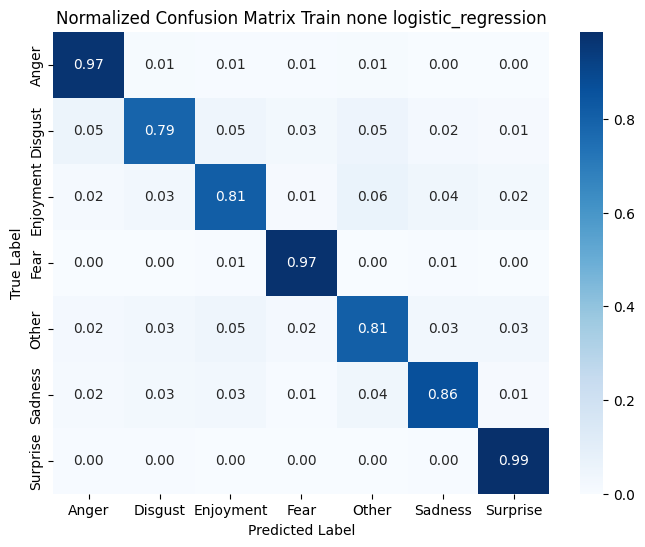

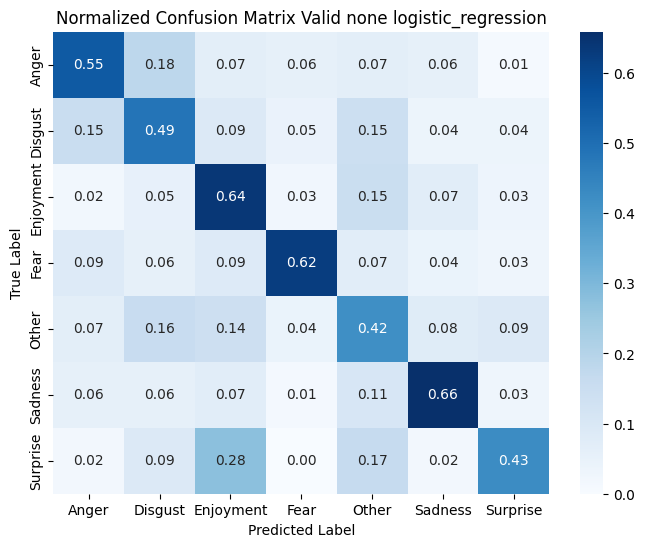

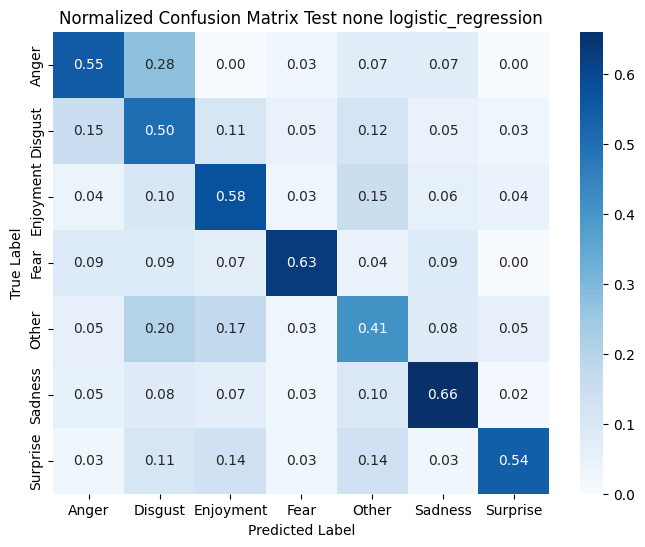

In [38]:
model_82, train_82, valid_82, test_82, pred_82 = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="logistic_regression",
    max_iter=1000
)

# Dự đoán từ pipeline_modeling
y_pred_train_82, y_pred_valid_82, y_pred_test_82 = pred_82

pipeline_evaluation(
    y_train_82, y_valid_82, y_test_82,
    y_pred_train_82, y_pred_valid_82, y_pred_test_82,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (4946, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 69106


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.8024666397088557
Recall: 0.8024666397088557
Precision: 0.8137090326571464
F1-score: 0.8027895803156818

--- valid --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.5472918350848828
Recall: 0.5472918350848828
Precision: 0.5642443692674399
F1-score: 0.5522616982497145

--- test --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.5494186046511628
Recall: 0.5494186046511628
Precision: 0.5641670510072321
F1-score: 0.5533591701129054


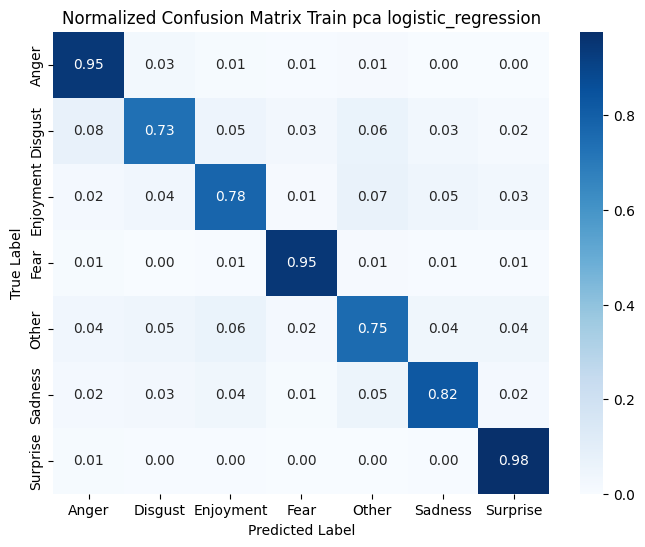

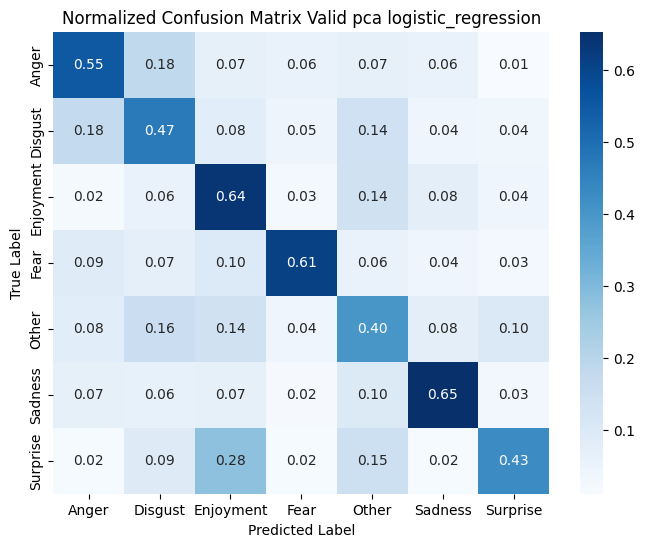

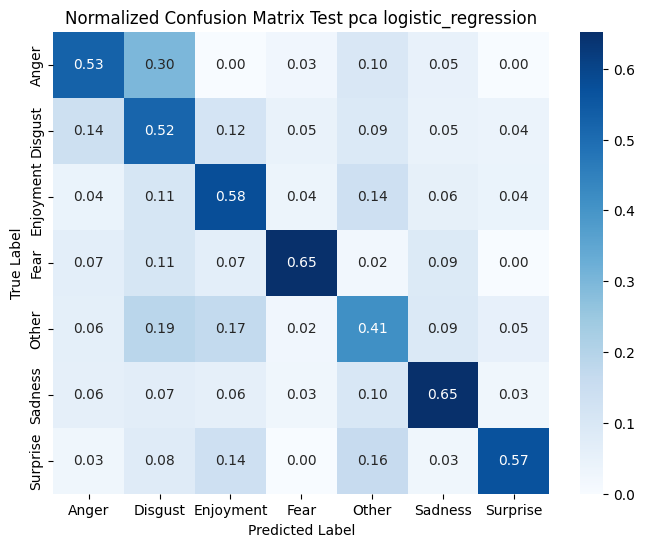

In [39]:
# Chuẩn bị dữ liệu với PCA
X_train_pca_82, X_valid_pca_82, X_test_pca_82, y_train_pca_82, y_valid_pca_82, y_test_pca_82, tfidf_vec_pca_82, disc_model_pca_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="pca"
)

# Chạy mô hình Logistic Regression trên dữ liệu PCA
model_pca_82, train_pca_82, valid_pca_82, test_pca_82, pred_pca_82 = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="logistic_regression",
    max_iter=1000
)

y_train_pca_82, y_valid_pca_82, y_test_pca_82 = train_pca_82[1], valid_pca_82[1], test_pca_82[1]
y_pred_train_pca_82, y_pred_valid_pca_82, y_pred_test_pca_82 = pred_pca_82

pipeline_evaluation(
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    y_pred_train_pca_82, y_pred_valid_pca_82, y_pred_test_pca_82,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (4946, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 69106


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.9987868985038415
Recall: 0.9987868985038415
Precision: 0.998794956402938
F1-score: 0.9987875567386413

--- valid --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.2902182700080841
Recall: 0.2902182700080841
Precision: 0.3696641540667728
F1-score: 0.310917344540634

--- test --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.26453488372093026
Recall: 0.26453488372093026
Precision: 0.3162417418799653
F1-score: 0.2735358184387528


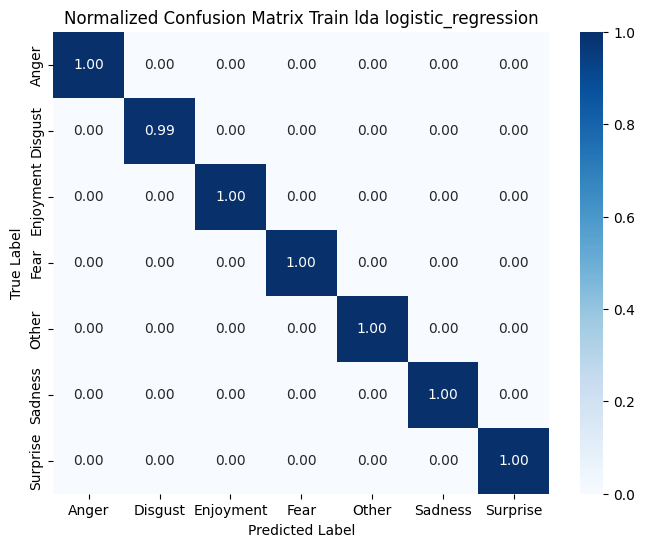

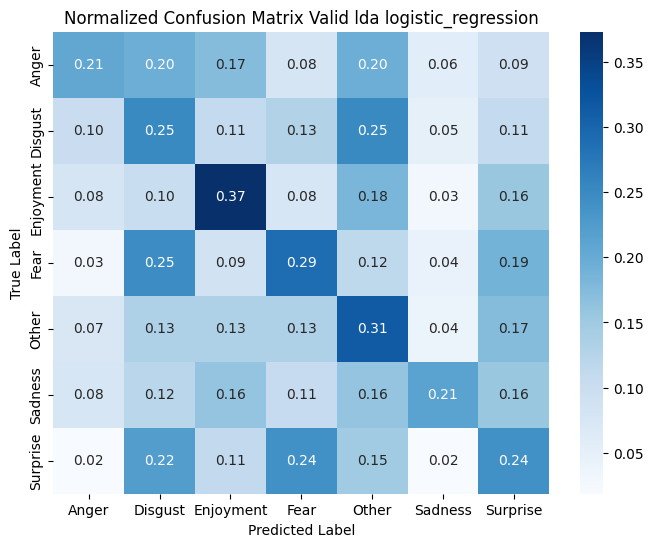

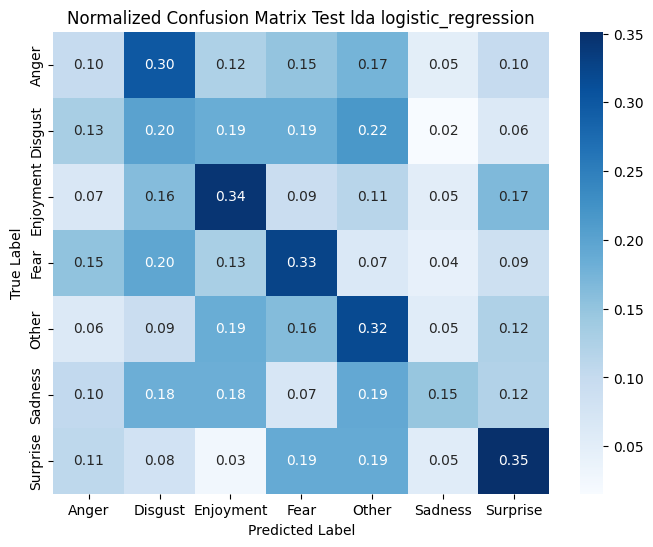

In [40]:
# Chuẩn bị dữ liệu với LDA
X_train_lda_82, X_valid_lda_82, X_test_lda_82, y_train_lda_82, y_valid_lda_82, y_test_lda_82, tfidf_vec_lda_82, disc_model_lda_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="lda"
)

# Chạy mô hình Logistic Regression trên dữ liệu LDA
model_lda_82, train_lda_82, valid_lda_82, test_lda_82, pred_lda_82 = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="logistic_regression",
    max_iter=1000
)

y_train_lda_82, y_valid_lda_82, y_test_lda_82 = train_lda_82[1], valid_lda_82[1], test_lda_82[1]
y_pred_train_lda_82, y_pred_valid_lda_82, y_pred_test_lda_82 = pred_lda_82

pipeline_evaluation(
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    y_pred_train_lda_82, y_pred_valid_lda_82, y_pred_test_lda_82,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

--- train --- 8:2 --- knn --- none ---
Accuracy: 0.5145572179539022
Recall: 0.5145572179539022
Precision: 0.5603350706160996
F1-score: 0.480300877630227

--- valid --- 8:2 --- knn --- none ---
Accuracy: 0.49151172190784154
Recall: 0.49151172190784154
Precision: 0.5070766797695774
F1-score: 0.4510977756461465

--- test --- 8:2 --- knn --- none ---
Accuracy: 0.47093023255813954
Recall: 0.47093023255813954
Precision: 0.48947568624183074
F1-score: 0.4388679590368376


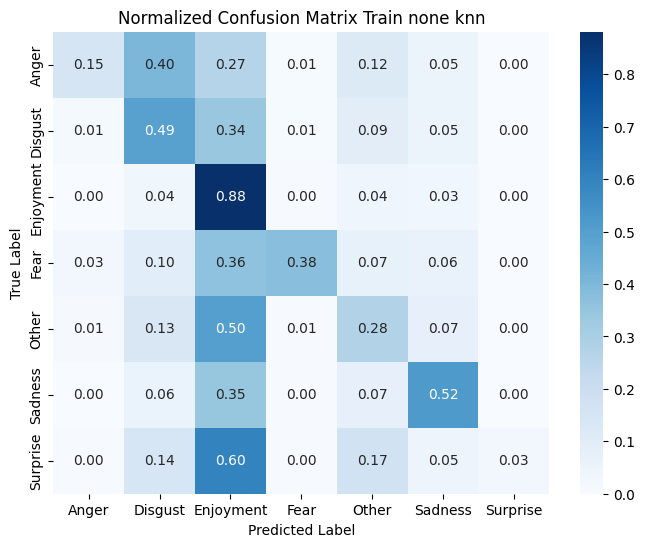

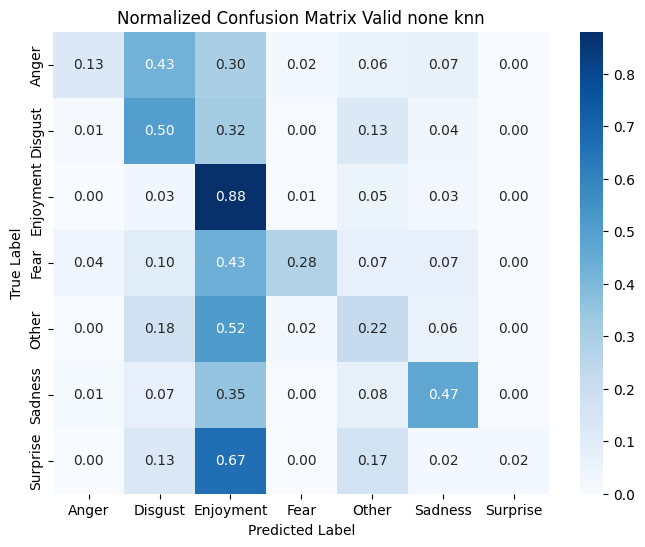

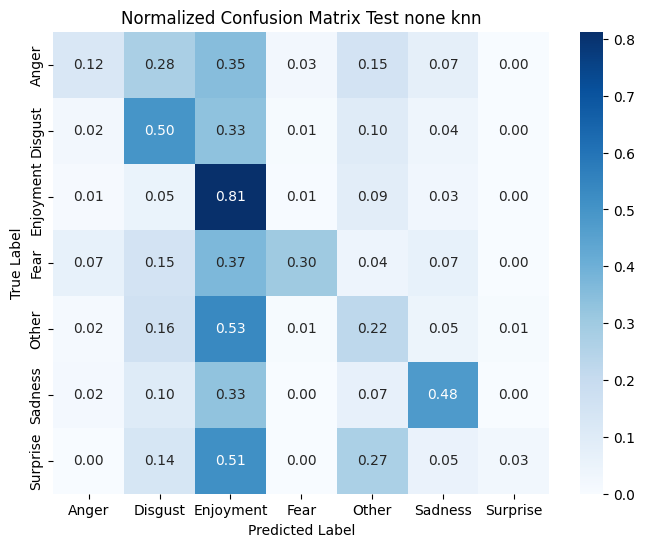

In [41]:
# Chạy KNN - cosine - None
model_82_knn, train_82_knn, valid_82_knn, test_82_knn, pred_82_knn = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="knn"
)

y_train_82_knn, y_valid_82_knn, y_test_82_knn = train_82_knn[1], valid_82_knn[1], test_82_knn[1]
y_pred_train_82_knn, y_pred_valid_82_knn, y_pred_test_82_knn = pred_82_knn

pipeline_evaluation(
    y_train_82_knn, y_valid_82_knn, y_test_82_knn,
    y_pred_train_82_knn, y_pred_valid_82_knn, y_pred_test_82_knn,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

--- train --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.5153659522846745
Recall: 0.5153659522846745
Precision: 0.5606653078747628
F1-score: 0.4812010338761784

--- valid --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.4874696847210994
Recall: 0.4874696847210994
Precision: 0.5020763465565204
F1-score: 0.4470907890092444

--- test --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.4680232558139535
Recall: 0.4680232558139535
Precision: 0.48652425677982636
F1-score: 0.43657491826486655


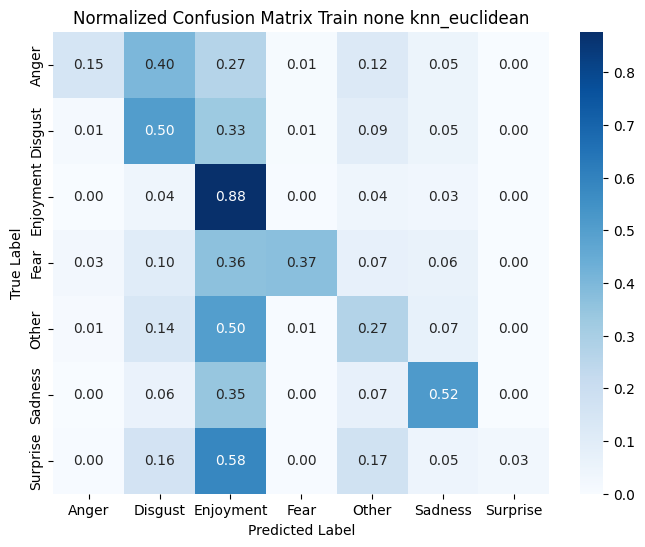

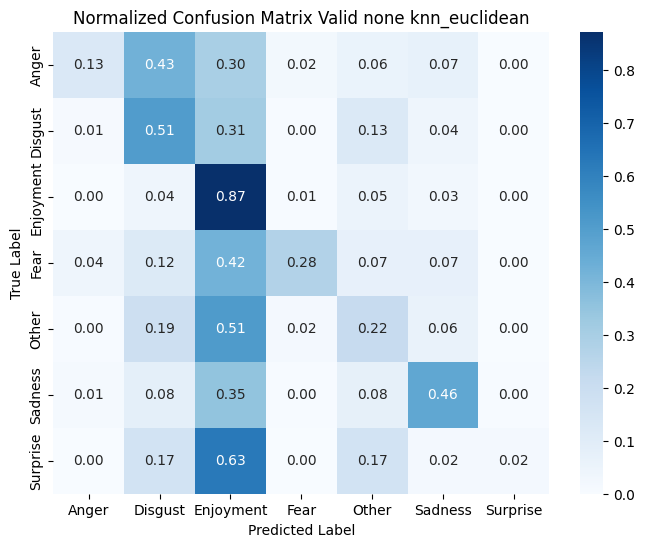

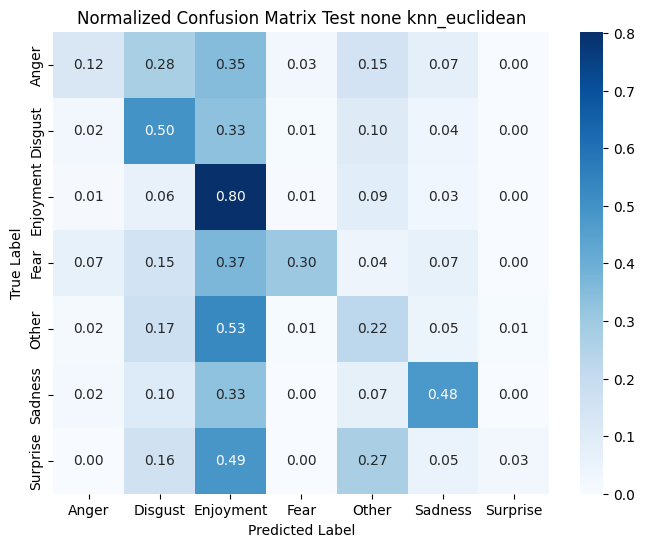

In [42]:
# KNN - euclidean - None
model_82_knn_euclidean, train_82_knn_euclidean, valid_82_knn_euclidean, test_82_knn_euclidean, pred_82_knn_euclidean = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="knn",
    metric="euclidean"
)

y_train_82_knn_euclidean, y_valid_82_knn_euclidean, y_test_82_knn_euclidean = train_82_knn_euclidean[1], valid_82_knn_euclidean[1], test_82_knn_euclidean[1]
y_pred_train_82_knn_euclidean, y_pred_valid_82_knn_euclidean, y_pred_test_82_knn_euclidean = pred_82_knn_euclidean

pipeline_evaluation(
    y_train_82_knn_euclidean, y_valid_82_knn_euclidean, y_test_82_knn_euclidean,
    y_pred_train_82_knn_euclidean, y_pred_valid_82_knn_euclidean, y_pred_test_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 8:2 --- knn --- pca ---
Accuracy: 0.5163768701981399
Recall: 0.5163768701981399
Precision: 0.5573910309380589
F1-score: 0.48321444934461233

--- valid --- 8:2 --- knn --- pca ---
Accuracy: 0.4858528698464026
Recall: 0.4858528698464026
Precision: 0.4899531637024911
F1-score: 0.44363630588661573

--- test --- 8:2 --- knn --- pca ---
Accuracy: 0.48546511627906974
Recall: 0.48546511627906974
Precision: 0.5069145726739968
F1-score: 0.453263618317349


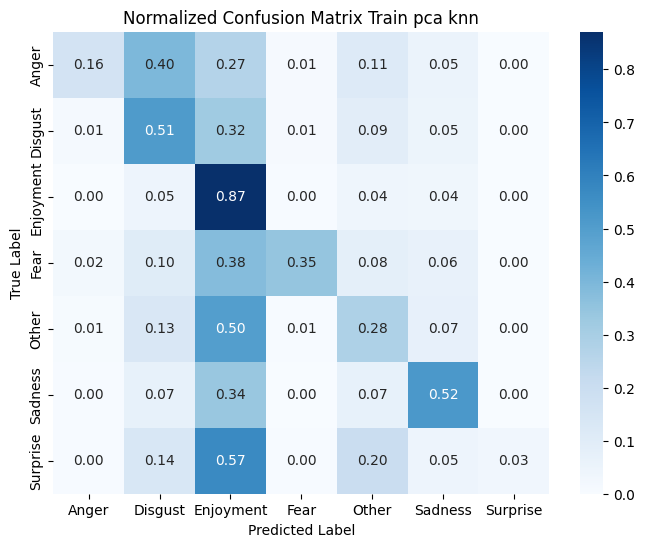

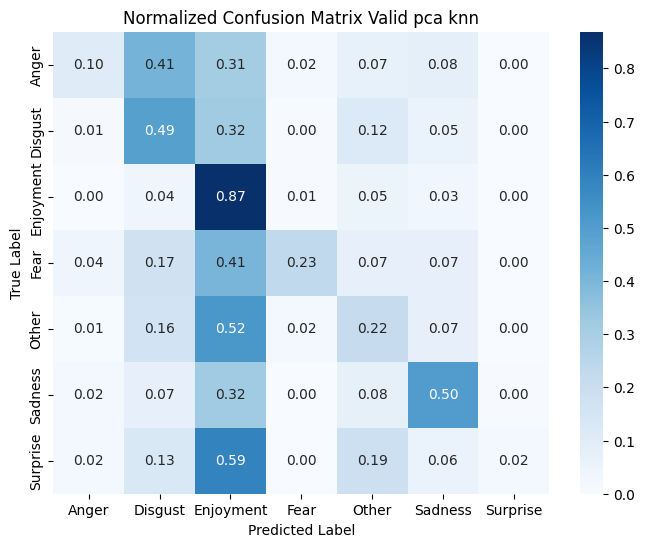

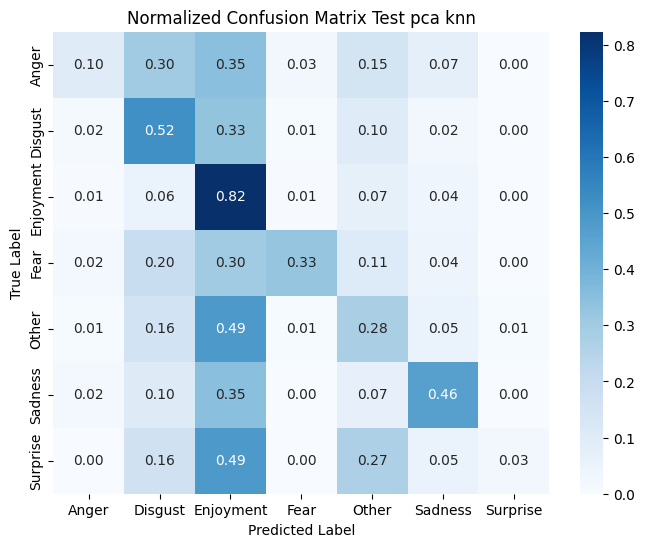

In [43]:
model_pca_82_knn, train_pca_82_knn, valid_pca_82_knn, test_pca_82_knn, pred_pca_82_knn = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="knn",
    max_iter=1000
)

y_train_pca_82_knn, y_valid_pca_82_knn, y_test_pca_82_knn = train_pca_82_knn[1], valid_pca_82_knn[1], test_pca_82_knn[1]
y_pred_train_pca_82_knn, y_pred_valid_pca_82_knn, y_pred_test_pca_82_knn = pred_pca_82_knn

pipeline_evaluation(
    y_train_pca_82_knn, y_valid_pca_82_knn, y_test_pca_82_knn,
    y_pred_train_pca_82_knn, y_pred_valid_pca_82_knn, y_pred_test_pca_82_knn,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.5101091791346543
Recall: 0.5101091791346543
Precision: 0.5515920816532318
F1-score: 0.4755145358488791

--- valid --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.47534357316087306
Recall: 0.47534357316087306
Precision: 0.5078910956532182
F1-score: 0.43385249160078115

--- test --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.4680232558139535
Recall: 0.4680232558139535
Precision: 0.46257797364527636
F1-score: 0.4325365012032962


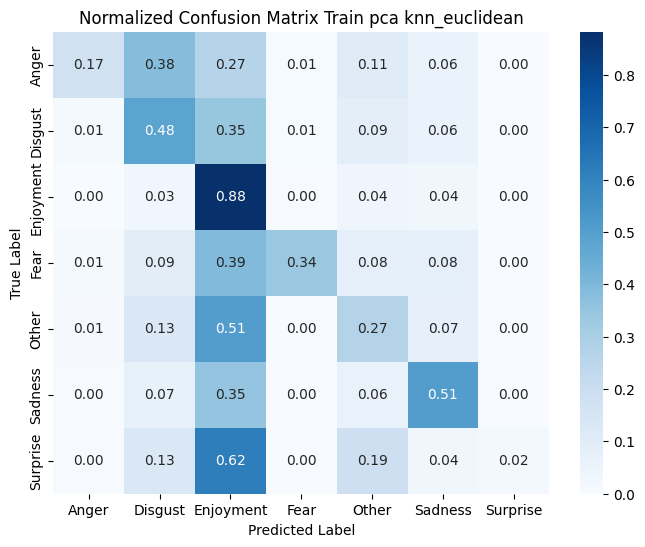

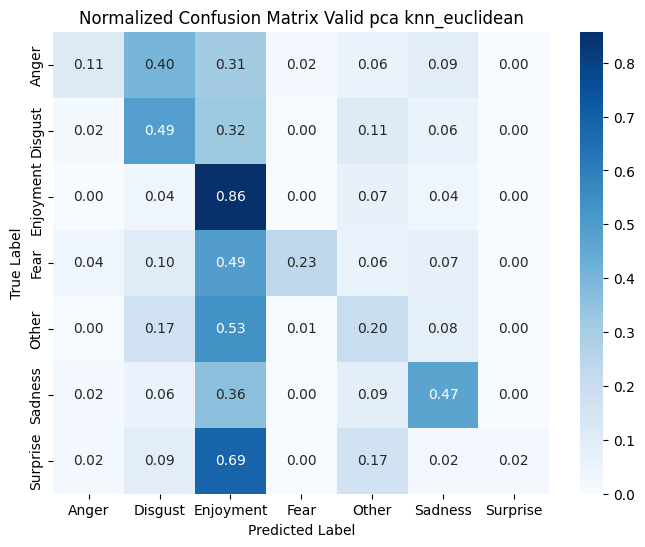

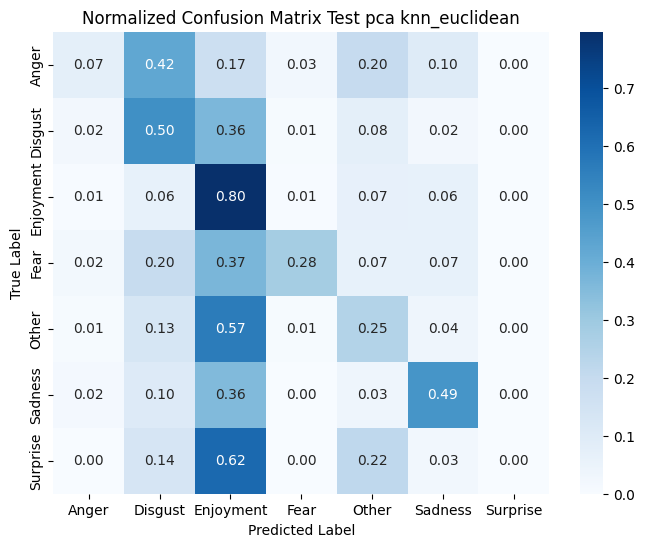

In [44]:
# KNN - euclidean - PCA
model_pca_82_knn_euclidean, train_pca_82_knn_euclidean, valid_pca_82_knn_euclidean, test_pca_82_knn_euclidean, pred_pca_82_knn_euclidean = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_82_knn_euclidean, y_valid_pca_82_knn_euclidean, y_test_pca_82_knn_euclidean = train_pca_82_knn_euclidean[1], valid_pca_82_knn_euclidean[1], test_pca_82_knn_euclidean[1]
y_pred_train_pca_82_knn_euclidean, y_pred_valid_pca_82_knn_euclidean, y_pred_test_pca_82_knn_euclidean = pred_pca_82_knn_euclidean

pipeline_evaluation(
    y_train_pca_82_knn_euclidean, y_valid_pca_82_knn_euclidean, y_test_pca_82_knn_euclidean,
    y_pred_train_pca_82_knn_euclidean, y_pred_valid_pca_82_knn_euclidean, y_pred_test_pca_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.9989890820865346
Recall: 0.9989890820865346
Precision: 0.9989903523498813
F1-score: 0.9989893248731954

--- valid --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.32012934518997577
Recall: 0.32012934518997577
Precision: 0.3809370915021065
F1-score: 0.3357382439777958

--- test --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.3066860465116279
Recall: 0.3066860465116279
Precision: 0.36141808931716773
F1-score: 0.32088104843976556


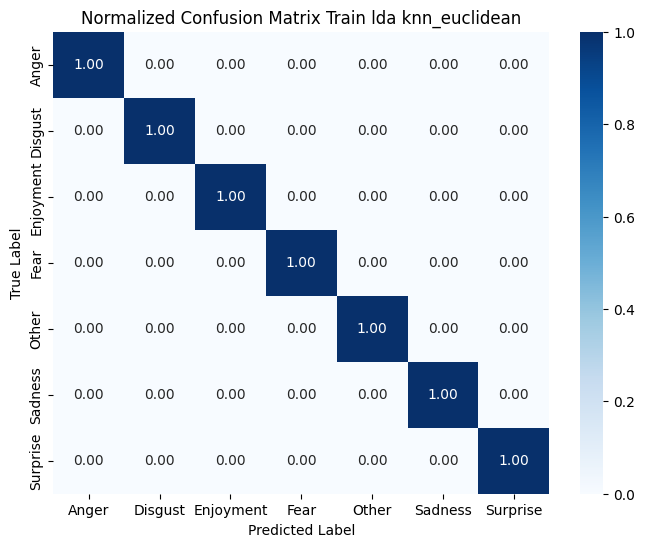

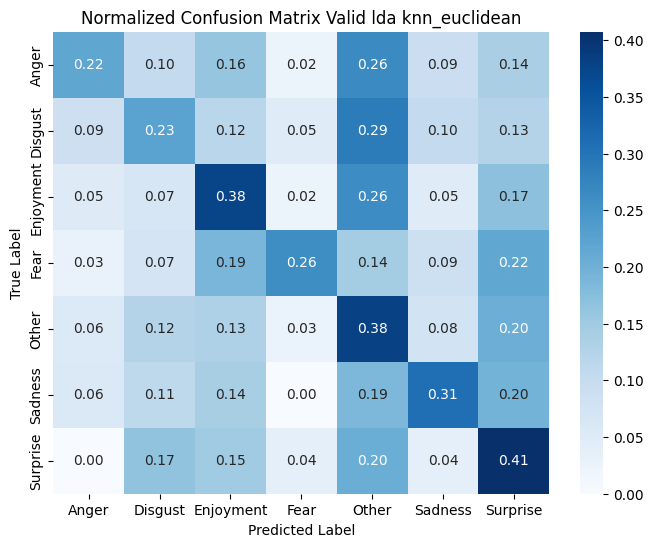

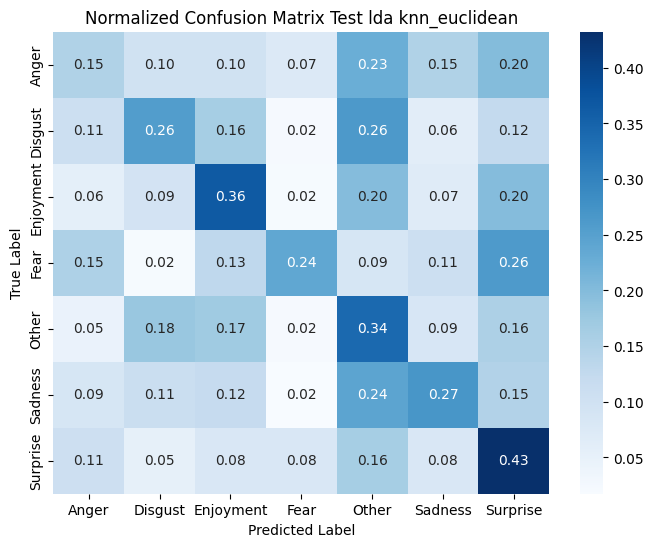

In [45]:
# KNN - euclidean - LDA
model_lda_82_knn_euclidean, train_lda_82_knn_euclidean, valid_lda_82_knn_euclidean, test_lda_82_knn_euclidean, pred_lda_82_knn_euclidean = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_82_knn_euclidean, y_valid_lda_82_knn_euclidean, y_test_lda_82_knn_euclidean = train_lda_82_knn_euclidean[1], valid_lda_82_knn_euclidean[1], test_lda_82_knn_euclidean[1]
y_pred_train_lda_82_knn_euclidean, y_pred_valid_lda_82_knn_euclidean, y_pred_test_lda_82_knn_euclidean = pred_lda_82_knn_euclidean

pipeline_evaluation(
    y_train_lda_82_knn_euclidean, y_valid_lda_82_knn_euclidean, y_test_lda_82_knn_euclidean,
    y_pred_train_lda_82_knn_euclidean, y_pred_valid_lda_82_knn_euclidean, y_pred_test_lda_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 8:2 --- knn --- lda ---
Accuracy: 0.9987868985038415
Recall: 0.9987868985038415
Precision: 0.9987882505481236
F1-score: 0.9987867743833434

--- valid --- 8:2 --- knn --- lda ---
Accuracy: 0.2991107518189167
Recall: 0.2991107518189167
Precision: 0.39657748990157243
F1-score: 0.31793139443820106

--- test --- 8:2 --- knn --- lda ---
Accuracy: 0.2805232558139535
Recall: 0.2805232558139535
Precision: 0.36303081956342453
F1-score: 0.2922814390437736


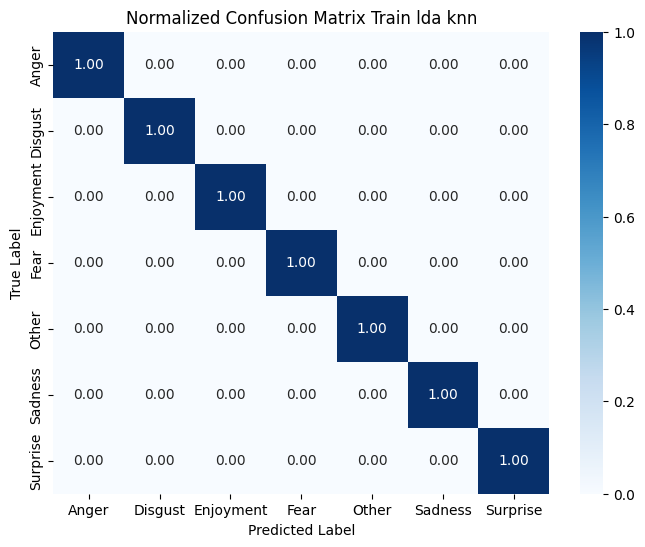

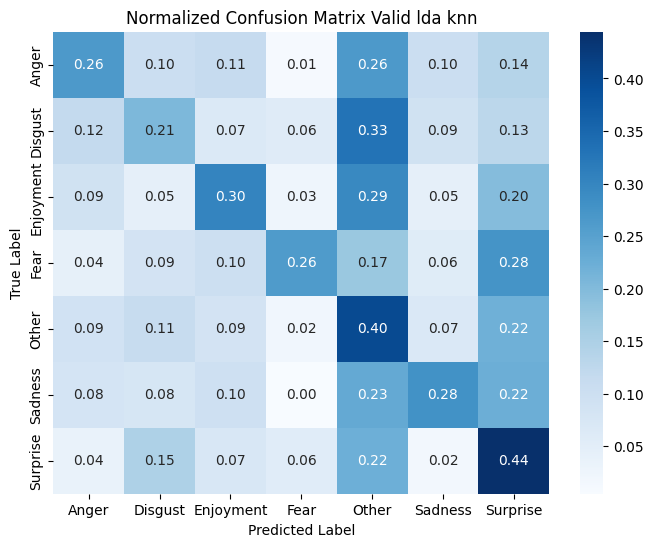

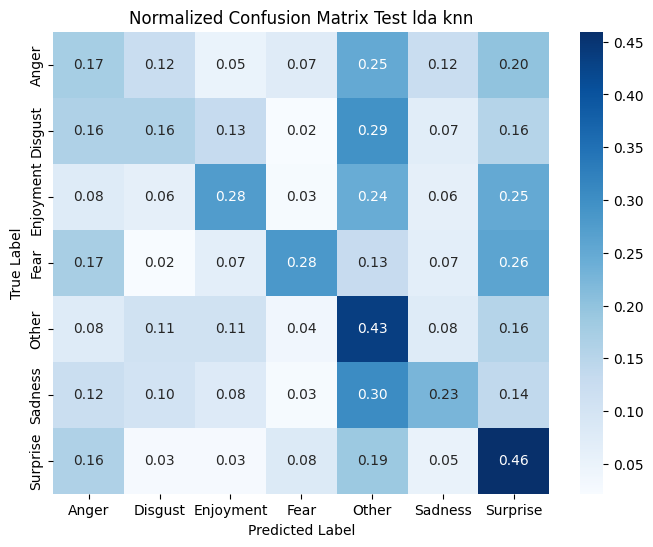

In [46]:
model_lda_82_knn, train_lda_82_knn, valid_lda_82_knn, test_lda_82_knn, pred_lda_82_knn = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="knn",
    max_iter=1000
)

y_train_lda_82_knn, y_valid_lda_82_knn, y_test_lda_82_knn = train_lda_82_knn[1], valid_lda_82_knn[1], test_lda_82_knn[1]
y_pred_train_lda_82_knn, y_pred_valid_lda_82_knn, y_pred_test_lda_82_knn = pred_lda_82_knn

pipeline_evaluation(
    y_train_lda_82_knn, y_valid_lda_82_knn, y_test_lda_82_knn,
    y_pred_train_lda_82_knn, y_pred_valid_lda_82_knn, y_pred_test_lda_82_knn,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu không giảm chiều

--- train --- 8:2 --- svm_linear --- none ---
Accuracy: 0.9623938536190861
Recall: 0.9623938536190861
Precision: 0.9628910377322886
F1-score: 0.9623952776191987

--- valid --- 8:2 --- svm_linear --- none ---
Accuracy: 0.561034761519806
Recall: 0.561034761519806
Precision: 0.5575431648895106
F1-score: 0.5579423178398085

--- test --- 8:2 --- svm_linear --- none ---
Accuracy: 0.561046511627907
Recall: 0.561046511627907
Precision: 0.566456192557641
F1-score: 0.5622021407390833


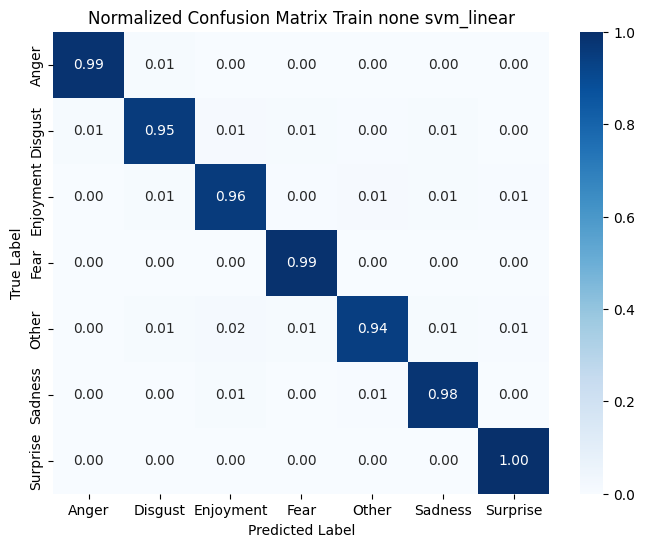

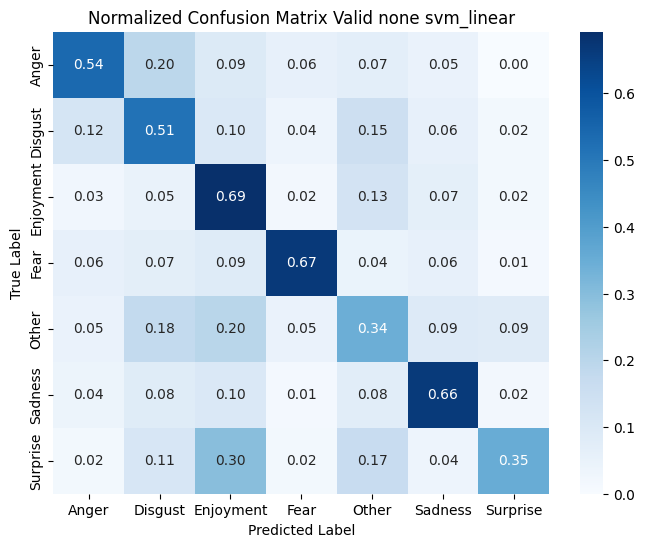

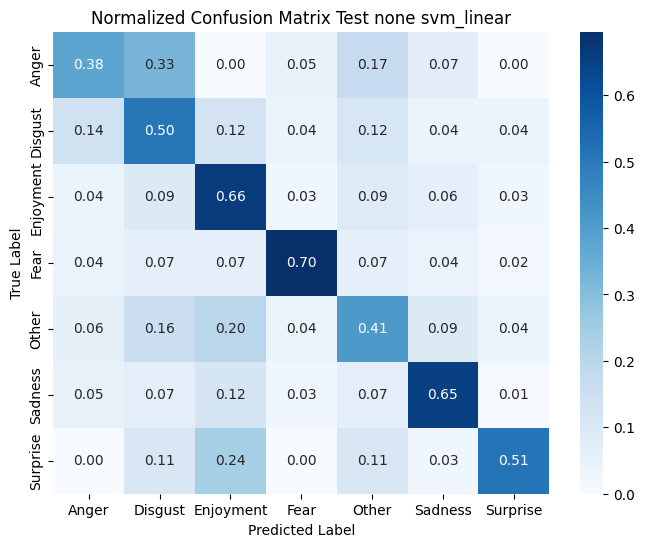

In [47]:
# SVM - linear - None (8:2)
model_82_svm_linear, train_82_svm_linear, valid_82_svm_linear, test_82_svm_linear, pred_82_svm_linear = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_82_svm_linear, y_valid_82_svm_linear, y_test_82_svm_linear = train_82_svm_linear[1], valid_82_svm_linear[1], test_82_svm_linear[1]
y_pred_train_82_svm_linear, y_pred_valid_82_svm_linear, y_pred_test_82_svm_linear = pred_82_svm_linear

pipeline_evaluation(
    y_train_82_svm_linear, y_valid_82_svm_linear, y_test_82_svm_linear,
    y_pred_train_82_svm_linear, y_pred_valid_82_svm_linear, y_pred_test_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_poly --- none ---
Accuracy: 0.9268095430651031
Recall: 0.9268095430651031
Precision: 0.9388037688226248
F1-score: 0.9252908775366969

--- valid --- 8:2 --- svm_poly --- none ---
Accuracy: 0.4042037186742118
Recall: 0.4042037186742118
Precision: 0.5846880261665215
F1-score: 0.377706004750641

--- test --- 8:2 --- svm_poly --- none ---
Accuracy: 0.43023255813953487
Recall: 0.43023255813953487
Precision: 0.6134788010465049
F1-score: 0.40663940535941195


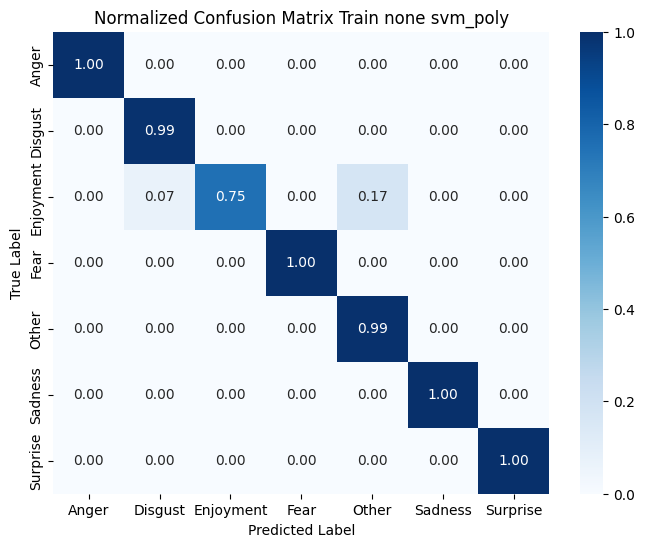

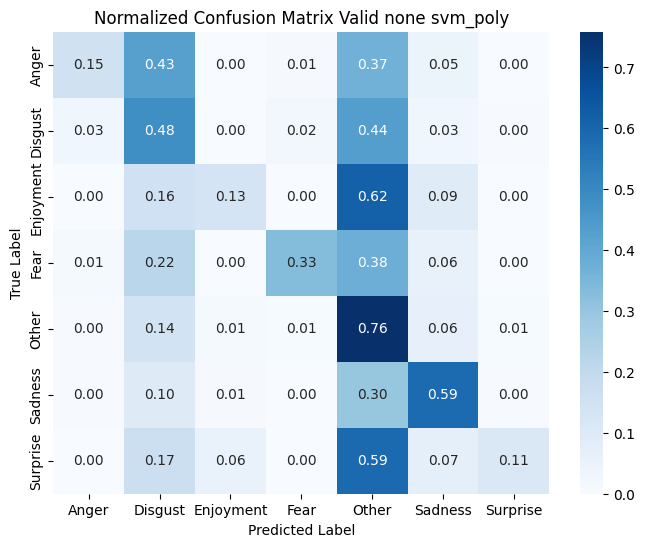

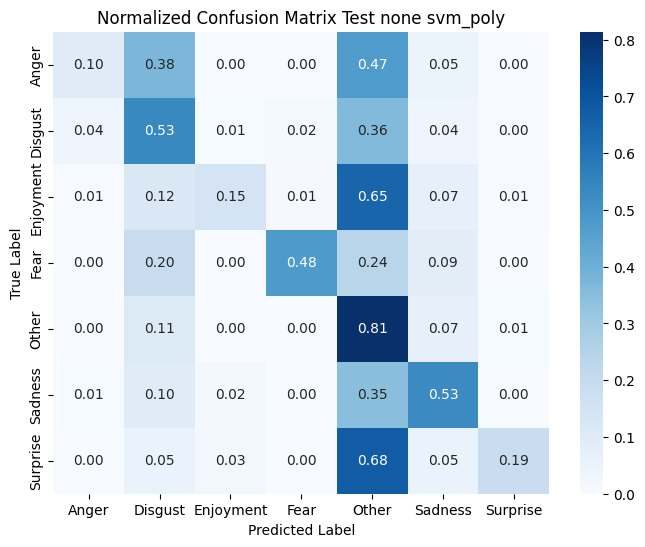

In [48]:
# SVM - poly - None (8:2)
model_82_svm_poly, train_82_svm_poly, valid_82_svm_poly, test_82_svm_poly, pred_82_svm_poly = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly = train_82_svm_poly[1], valid_82_svm_poly[1], test_82_svm_poly[1]
y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly = pred_82_svm_poly

pipeline_evaluation(
    y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly,
    y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.9587545491306106
Recall: 0.9587545491306106
Precision: 0.9619078745264351
F1-score: 0.9588254218672841

--- valid --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.5109135004042037
Recall: 0.5109135004042037
Precision: 0.6037016879915057
F1-score: 0.5162835919812658

--- test --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.5072674418604651
Recall: 0.5072674418604651
Precision: 0.6133288205585194
F1-score: 0.5084062496932069


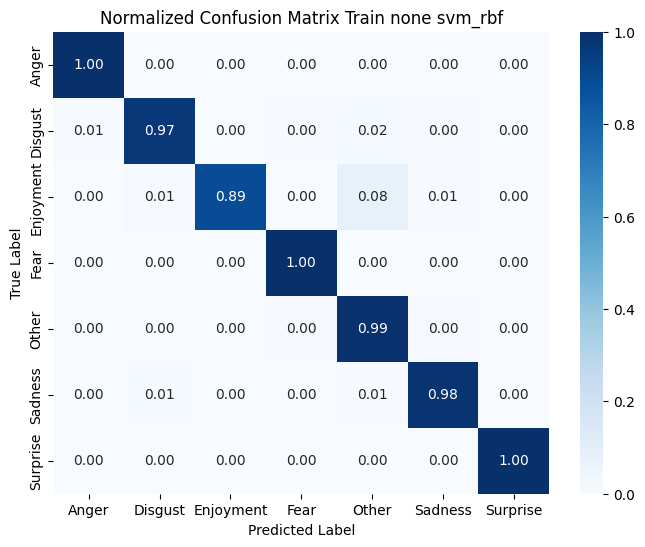

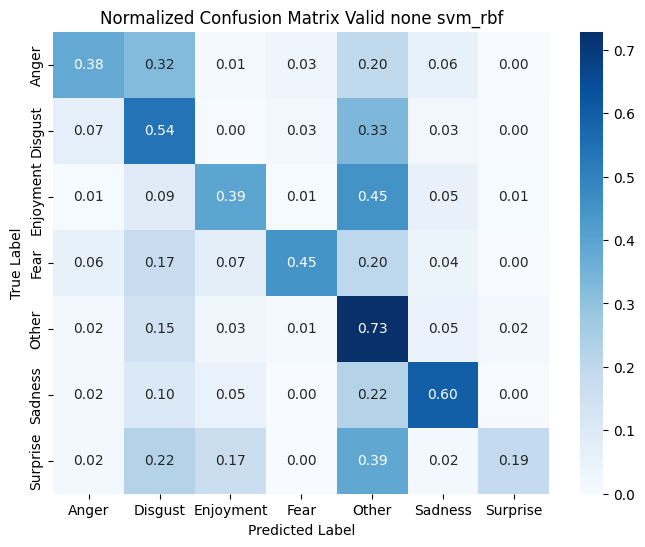

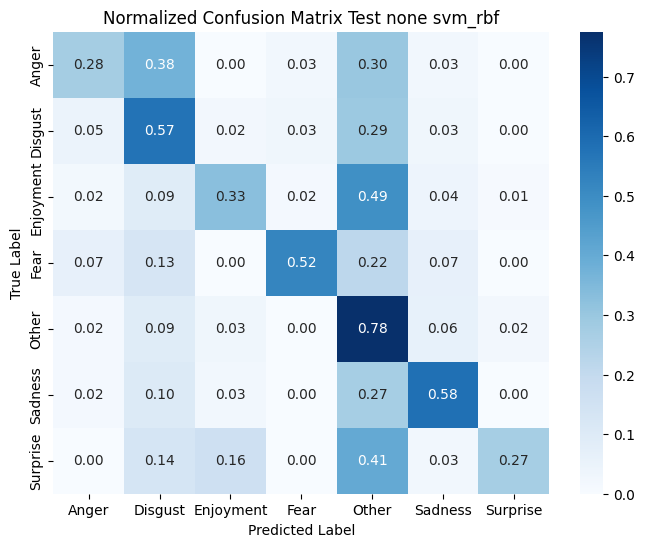

In [49]:
# SVM - rbf - None (8:2)
model_82_svm_rbf, train_82_svm_rbf, valid_82_svm_rbf, test_82_svm_rbf, pred_82_svm_rbf = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_82_svm_rbf, y_valid_82_svm_rbf, y_test_82_svm_rbf = train_82_svm_rbf[1], valid_82_svm_rbf[1], test_82_svm_rbf[1]
y_pred_train_82_svm_rbf, y_pred_valid_82_svm_rbf, y_pred_test_82_svm_rbf = pred_82_svm_rbf

pipeline_evaluation(
    y_train_82_svm_rbf, y_valid_82_svm_rbf, y_test_82_svm_rbf,
    y_pred_train_82_svm_rbf, y_pred_valid_82_svm_rbf, y_pred_test_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.9053780832996361
Recall: 0.9053780832996361
Precision: 0.9076298059811462
F1-score: 0.9052918691255996

--- valid --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.570735650767987
Recall: 0.570735650767987
Precision: 0.5690279648979328
F1-score: 0.5680559040377112

--- test --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.559593023255814
Recall: 0.559593023255814
Precision: 0.5638954624344313
F1-score: 0.5596322949189233


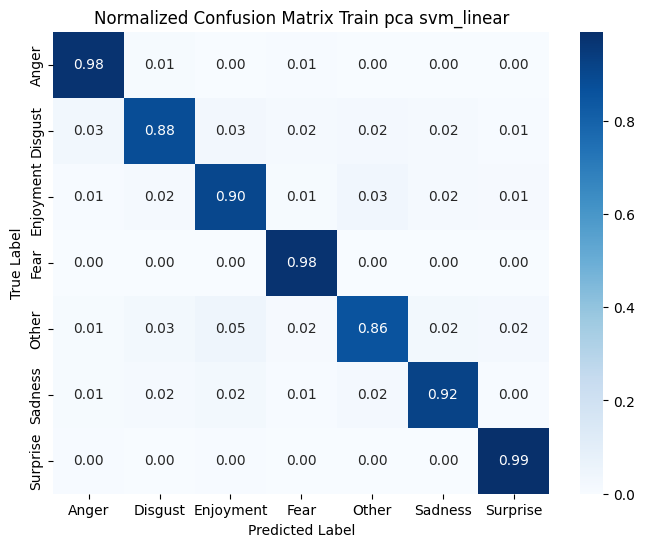

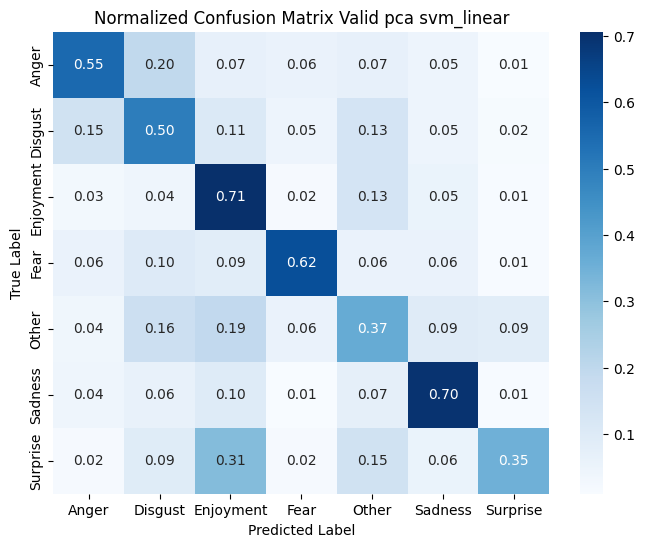

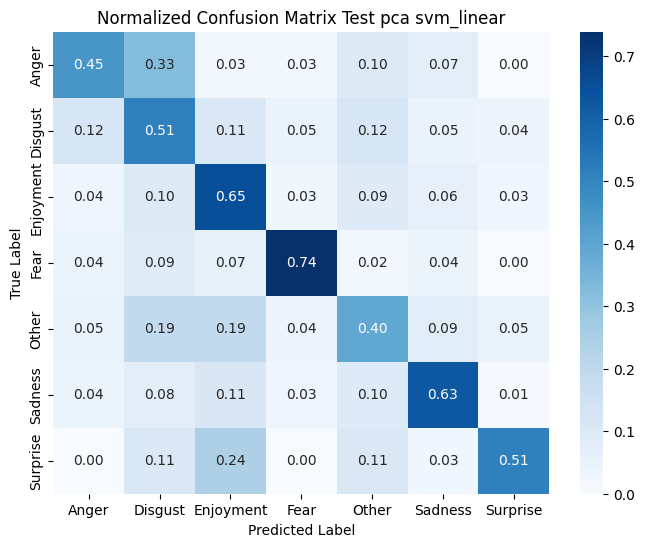

In [50]:
# SVM - linear - PCA (8:2)
model_pca_82_svm_linear, train_pca_82_svm_linear, valid_pca_82_svm_linear, test_pca_82_svm_linear, pred_pca_82_svm_linear = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_82_svm_linear, y_valid_pca_82_svm_linear, y_test_pca_82_svm_linear = train_pca_82_svm_linear[1], valid_pca_82_svm_linear[1], test_pca_82_svm_linear[1]
y_pred_train_pca_82_svm_linear, y_pred_valid_pca_82_svm_linear, y_pred_test_pca_82_svm_linear = pred_pca_82_svm_linear

pipeline_evaluation(
    y_train_pca_82_svm_linear, y_valid_pca_82_svm_linear, y_test_pca_82_svm_linear,
    y_pred_train_pca_82_svm_linear, y_pred_valid_pca_82_svm_linear, y_pred_test_pca_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.9363121714516781
Recall: 0.9363121714516781
Precision: 0.9453348717710846
F1-score: 0.9354032962826538

--- valid --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.40016168148746967
Recall: 0.40016168148746967
Precision: 0.5690697002599081
F1-score: 0.38148758182855635

--- test --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.4055232558139535
Recall: 0.4055232558139535
Precision: 0.610454172616619
F1-score: 0.3822165217416053


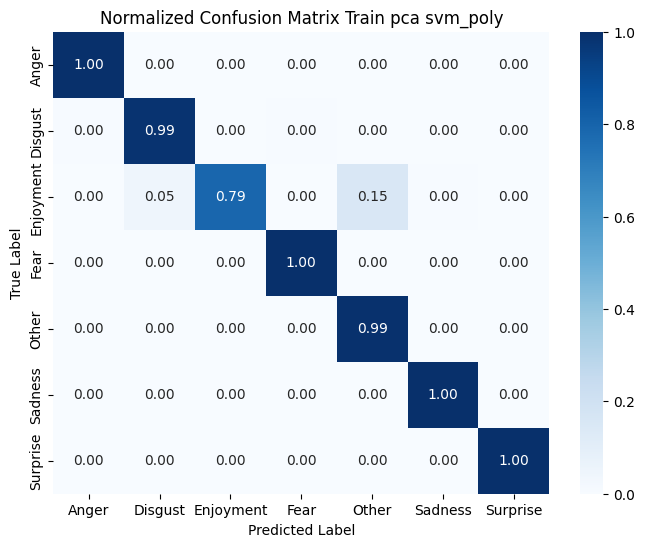

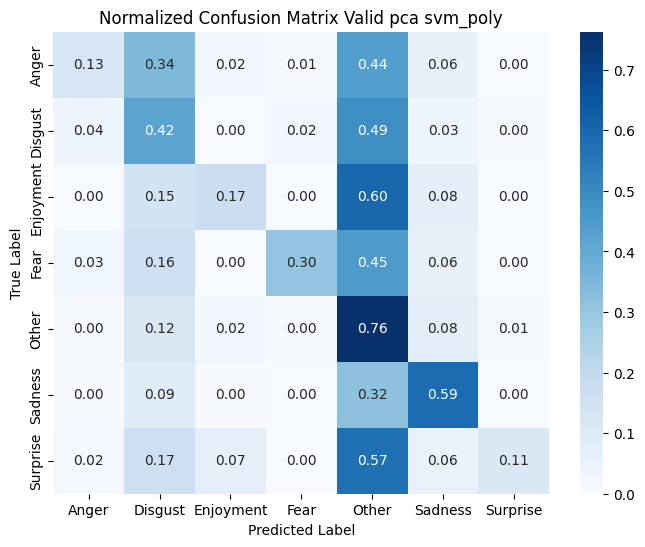

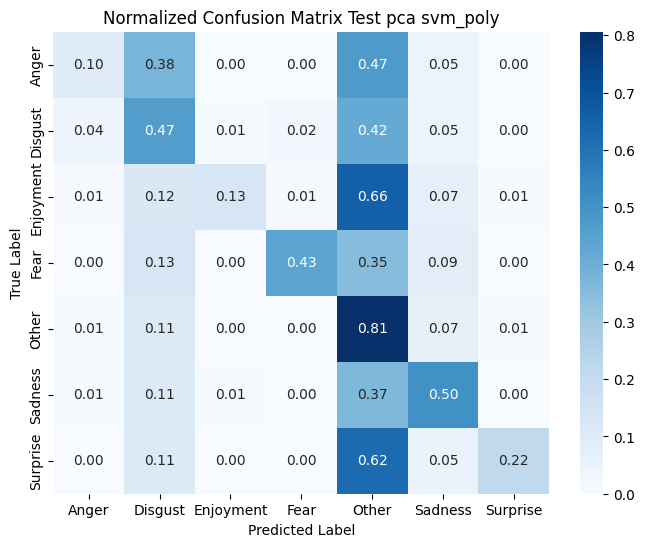

In [51]:
# SVM - poly - PCA (8:2)
model_pca_82_svm_poly, train_pca_82_svm_poly, valid_pca_82_svm_poly, test_pca_82_svm_poly, pred_pca_82_svm_poly = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_82_svm_poly, y_valid_pca_82_svm_poly, y_test_pca_82_svm_poly = train_pca_82_svm_poly[1], valid_pca_82_svm_poly[1], test_pca_82_svm_poly[1]
y_pred_train_pca_82_svm_poly, y_pred_valid_pca_82_svm_poly, y_pred_test_pca_82_svm_poly = pred_pca_82_svm_poly

pipeline_evaluation(
    y_train_pca_82_svm_poly, y_valid_pca_82_svm_poly, y_test_pca_82_svm_poly,
    y_pred_train_pca_82_svm_poly, y_pred_valid_pca_82_svm_poly, y_pred_test_pca_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.9308532147189649
Recall: 0.9308532147189649
Precision: 0.9384235440838637
F1-score: 0.9310815017932

--- valid --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.5505254648342764
Recall: 0.5505254648342764
Precision: 0.6055829023381896
F1-score: 0.5574802633144725

--- test --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.5203488372093024
Recall: 0.5203488372093024
Precision: 0.5850015539106755
F1-score: 0.5246905391942882


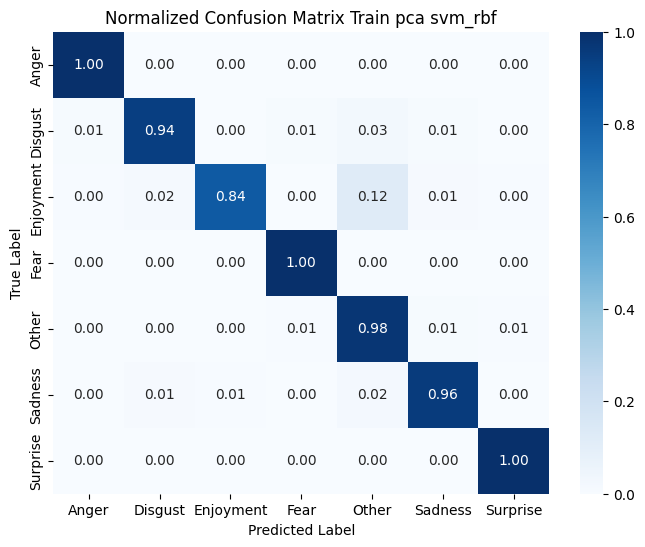

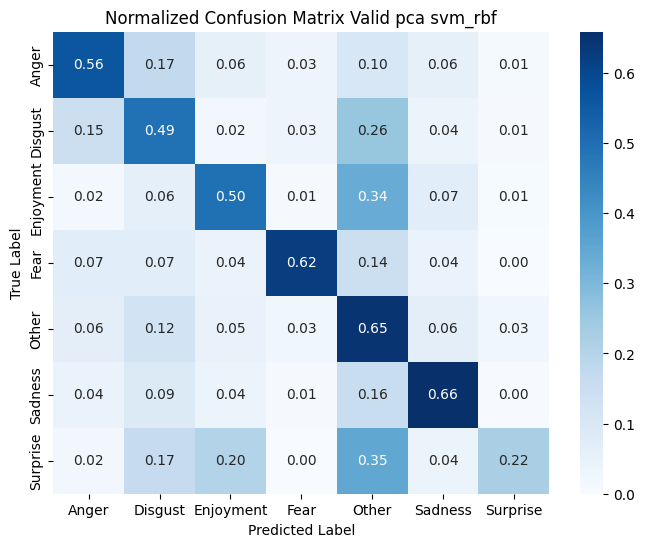

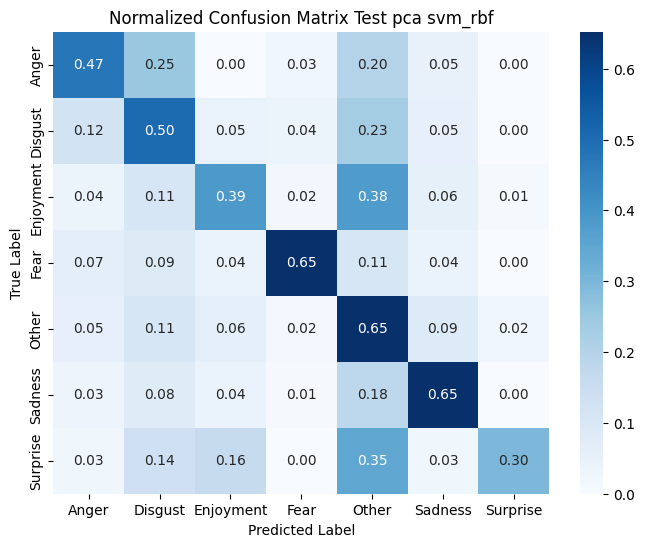

In [52]:
# SVM - rbf - PCA (8:2)
model_pca_82_svm_rbf, train_pca_82_svm_rbf, valid_pca_82_svm_rbf, test_pca_82_svm_rbf, pred_pca_82_svm_rbf = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_82_svm_rbf, y_valid_pca_82_svm_rbf, y_test_pca_82_svm_rbf = train_pca_82_svm_rbf[1], valid_pca_82_svm_rbf[1], test_pca_82_svm_rbf[1]
y_pred_train_pca_82_svm_rbf, y_pred_valid_pca_82_svm_rbf, y_pred_test_pca_82_svm_rbf = pred_pca_82_svm_rbf

pipeline_evaluation(
    y_train_pca_82_svm_rbf, y_valid_pca_82_svm_rbf, y_test_pca_82_svm_rbf,
    y_pred_train_pca_82_svm_rbf, y_pred_valid_pca_82_svm_rbf, y_pred_test_pca_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu LDA

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


--- train --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.9989890820865346
Recall: 0.9989890820865346
Precision: 0.9989902160255494
F1-score: 0.9989890115812688

--- valid --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.34357316087308004
Recall: 0.34357316087308004
Precision: 0.37606769982846594
F1-score: 0.34787916813162784

--- test --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.3183139534883721
Recall: 0.3183139534883721
Precision: 0.33613246563720617
F1-score: 0.3158400096565759


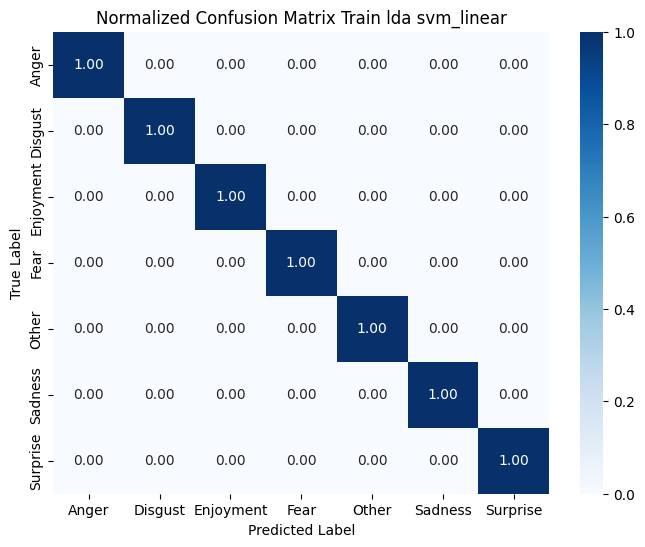

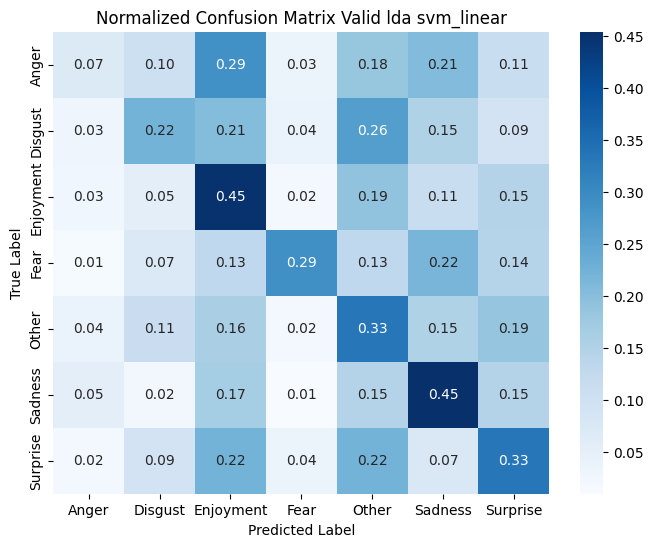

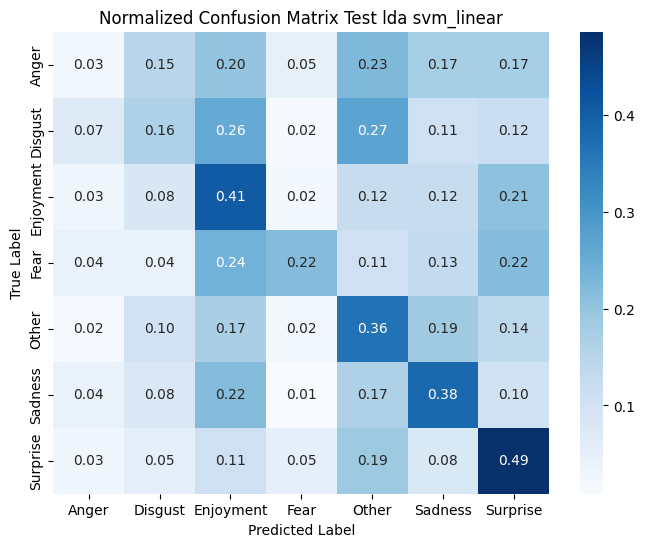

In [53]:
# SVM - linear - LDA (8:2)
model_lda_82_svm_linear, train_lda_82_svm_linear, valid_lda_82_svm_linear, test_lda_82_svm_linear, pred_lda_82_svm_linear = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_82_svm_linear, y_valid_lda_82_svm_linear, y_test_lda_82_svm_linear = train_lda_82_svm_linear[1], valid_lda_82_svm_linear[1], test_lda_82_svm_linear[1]
y_pred_train_lda_82_svm_linear, y_pred_valid_lda_82_svm_linear, y_pred_test_lda_82_svm_linear = pred_lda_82_svm_linear

pipeline_evaluation(
    y_train_lda_82_svm_linear, y_valid_lda_82_svm_linear, y_test_lda_82_svm_linear,
    y_pred_train_lda_82_svm_linear, y_pred_valid_lda_82_svm_linear, y_pred_test_lda_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.9985847149211484
Recall: 0.9985847149211484
Precision: 0.9985866449235883
F1-score: 0.9985848579543158

--- valid --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.24171382376717865
Recall: 0.24171382376717865
Precision: 0.30721960766331213
F1-score: 0.2581340598302595

--- test --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.17296511627906977
Recall: 0.17296511627906977
Precision: 0.21250244627553785
F1-score: 0.17712675934768546


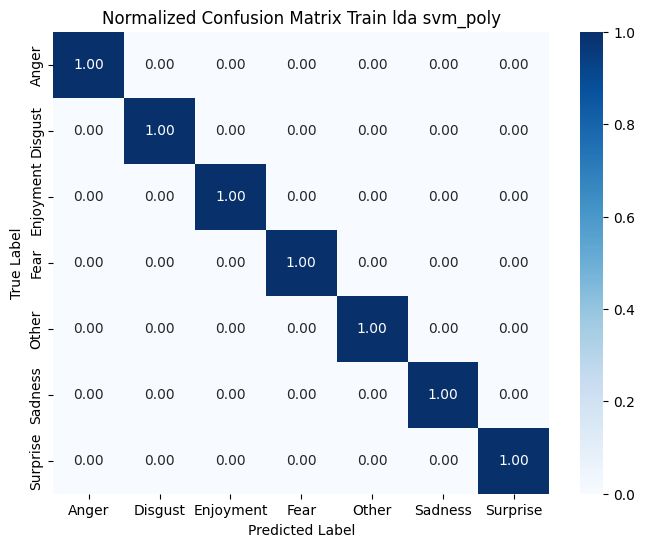

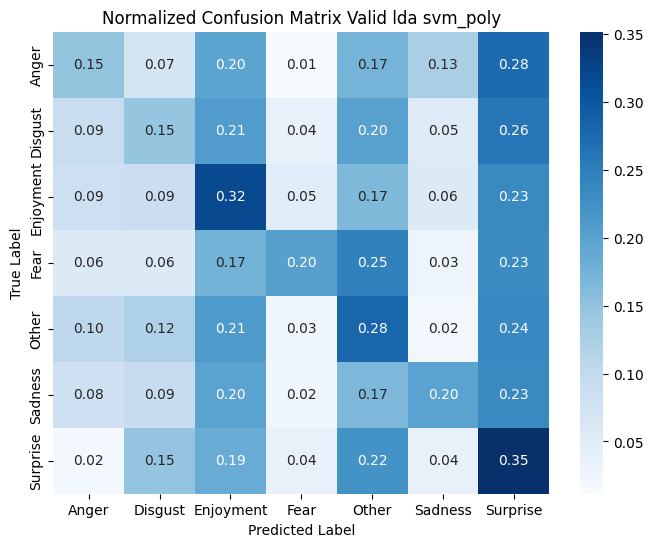

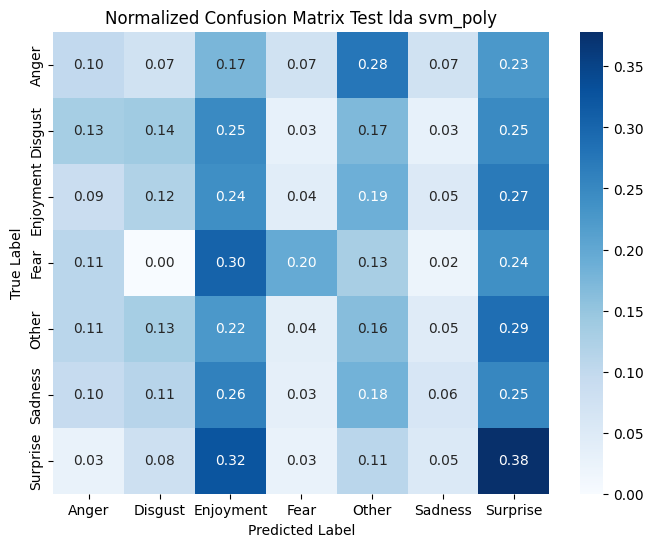

In [54]:
# SVM - poly - LDA (8:2)
model_lda_82_svm_poly, train_lda_82_svm_poly, valid_lda_82_svm_poly, test_lda_82_svm_poly, pred_lda_82_svm_poly = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly = train_lda_82_svm_poly[1], valid_lda_82_svm_poly[1], test_lda_82_svm_poly[1]
y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly = pred_lda_82_svm_poly

pipeline_evaluation(
    y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly,
    y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.9979781641730692
Recall: 0.9979781641730692
Precision: 0.9979881920313549
F1-score: 0.9979789229562457

--- valid --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.2853678253839935
Recall: 0.2853678253839935
Precision: 0.13642513721652555
F1-score: 0.12873725115712764

--- test --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.2805232558139535
Recall: 0.2805232558139535
Precision: 0.245144460241698
F1-score: 0.12479635425362165


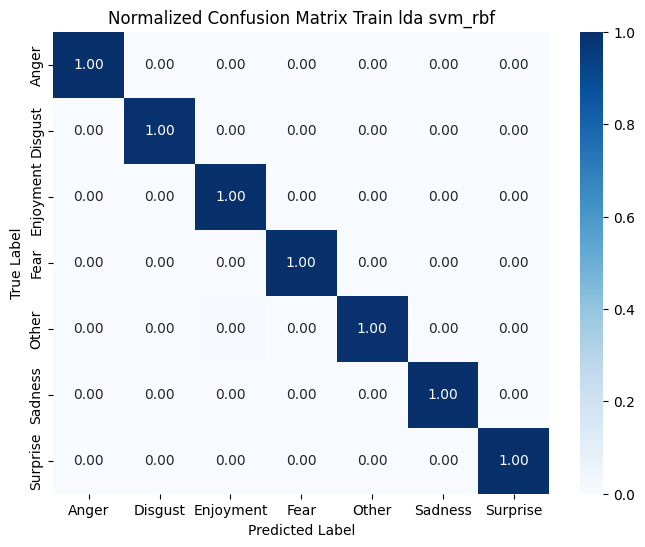

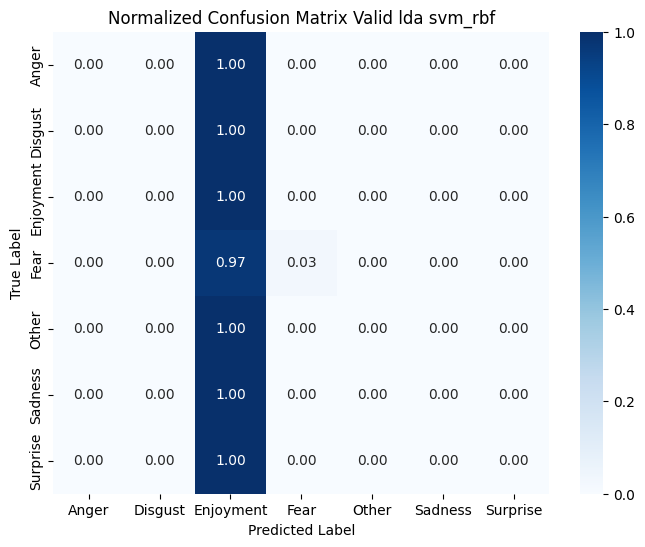

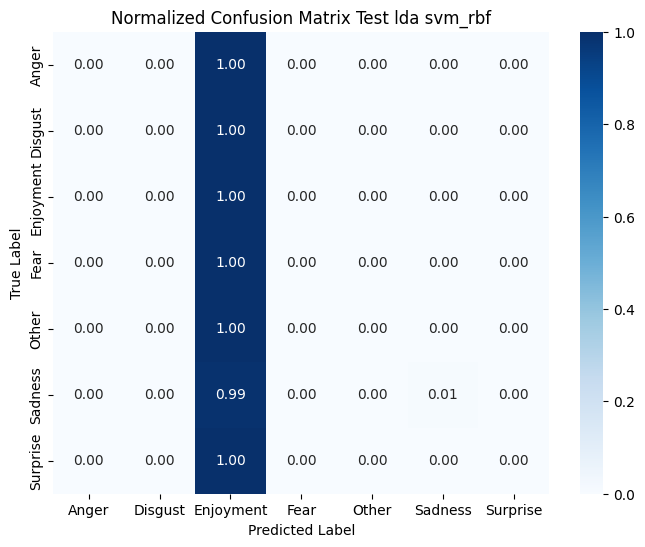

In [55]:
# SVM - rbf - LDA (8:2)
model_lda_82_svm_rbf, train_lda_82_svm_rbf, valid_lda_82_svm_rbf, test_lda_82_svm_rbf, pred_lda_82_svm_rbf = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_82_svm_rbf, y_valid_lda_82_svm_rbf, y_test_lda_82_svm_rbf = train_lda_82_svm_rbf[1], valid_lda_82_svm_rbf[1], test_lda_82_svm_rbf[1]
y_pred_train_lda_82_svm_rbf, y_pred_valid_lda_82_svm_rbf, y_pred_test_lda_82_svm_rbf = pred_lda_82_svm_rbf

pipeline_evaluation(
    y_train_lda_82_svm_rbf, y_valid_lda_82_svm_rbf, y_test_lda_82_svm_rbf,
    y_pred_train_lda_82_svm_rbf, y_pred_valid_lda_82_svm_rbf, y_pred_test_lda_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Train:Validation = 7:3

## Logistic Regression

### Bộ dữ liệu không giảm chiều

In [48]:
X_train_73, X_valid_73, X_test_73, y_train_73, y_valid_73, y_test_73, tfidf_vec_73, disc_model_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="none"
)

TF-IDF hoàn thành!
Shape: (4328, 7227) (số câu x số từ vựng)
Số từ vựng: 7227
TF-IDF - Non-zero values: 60021


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.8445009242144177
Recall: 0.8445009242144177
Precision: 0.8518679202575978
F1-score: 0.8442796365497183

--- valid --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.5439353099730458
Recall: 0.5439353099730458
Precision: 0.5588313337469614
F1-score: 0.5482712263657885

--- test --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.5319767441860465
Recall: 0.5319767441860465
Precision: 0.545341744498506
F1-score: 0.5353304777991896


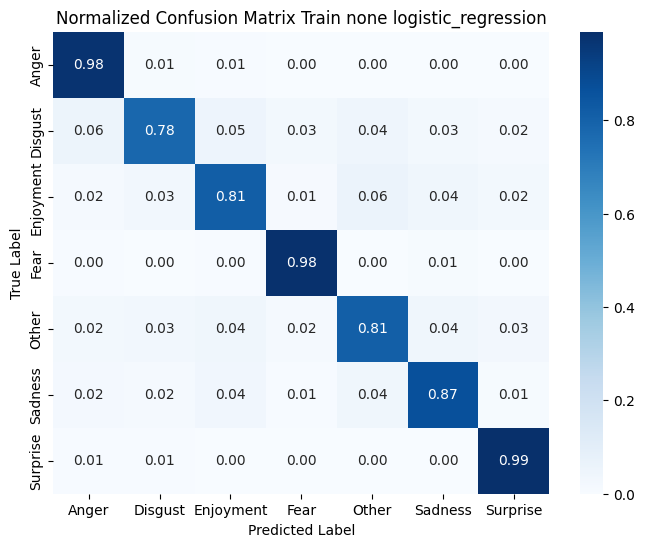

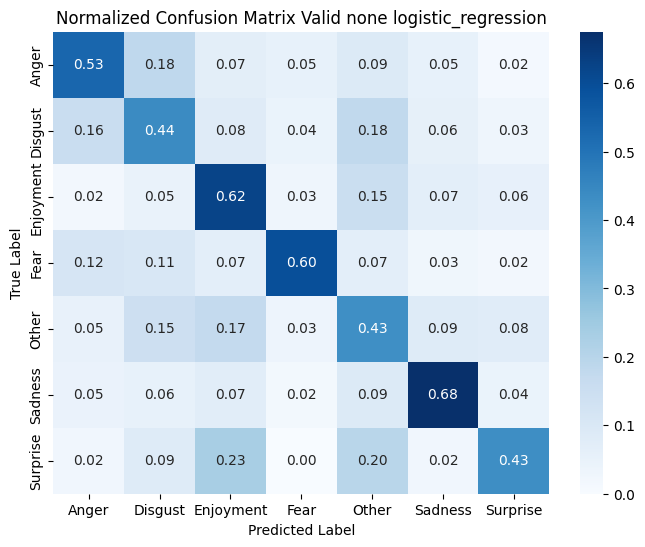

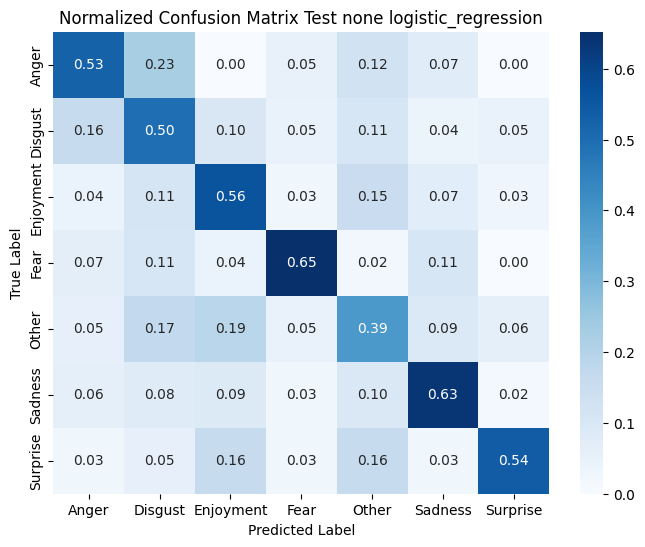

In [49]:
model_73, train_73, valid_73, test_73, pred_73 = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_73, y_pred_valid_73, y_pred_test_73 = pred_73

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73, y_pred_valid_73, y_pred_test_73,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (4328, 7227) (số câu x số từ vựng)
Số từ vựng: 7227
TF-IDF - Non-zero values: 60021


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.8006007393715342
Recall: 0.8006007393715342
Precision: 0.8120645396813397
F1-score: 0.8006671648518361

--- valid --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.5417789757412399
Recall: 0.5417789757412399
Precision: 0.557807857561753
F1-score: 0.5460899122001637

--- test --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.5247093023255814
Recall: 0.5247093023255814
Precision: 0.5373541784124971
F1-score: 0.5275658146842951


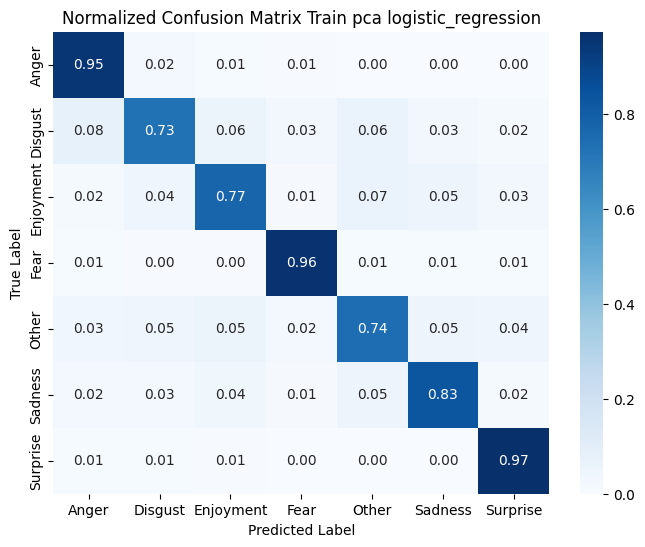

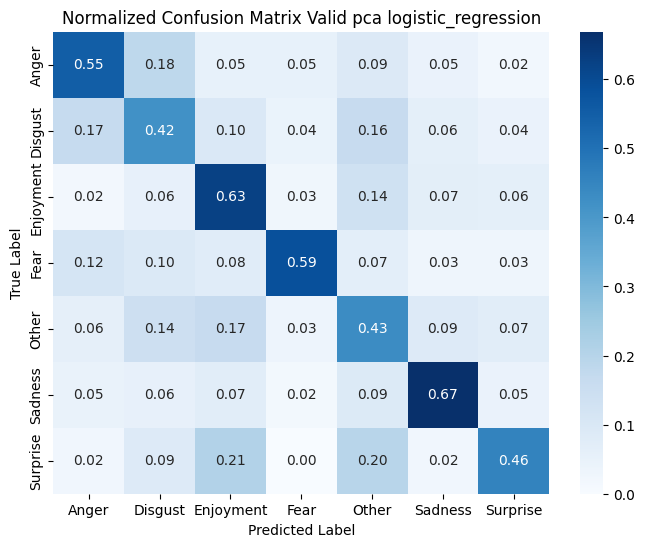

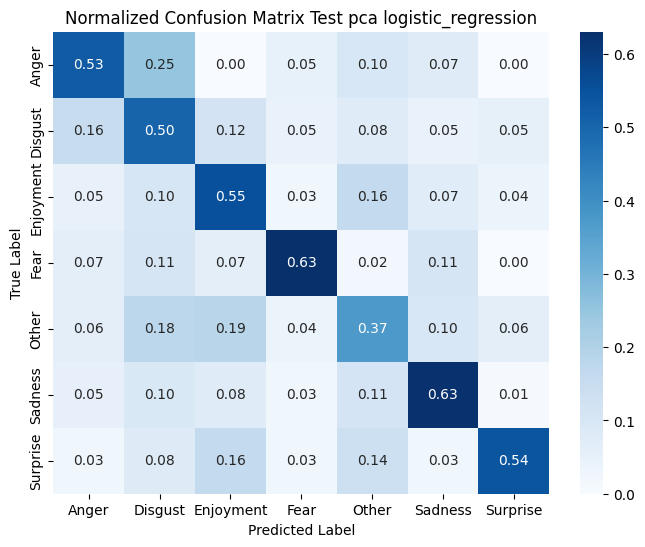

In [58]:
X_train_pca_73, X_valid_pca_73, X_test_pca_73, y_train_pca_73, y_valid_pca_73, y_test_pca_73, tfidf_vec_pca_73, disc_model_pca_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="pca"
)

model_pca_73, train_pca_73, valid_pca_73, test_pca_73, pred_pca_73 = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_pca_73, y_pred_valid_pca_73, y_pred_test_pca_73 = pred_pca_73

pipeline_evaluation(
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    y_pred_train_pca_73, y_pred_valid_pca_73, y_pred_test_pca_73,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (4328, 7227) (số câu x số từ vựng)
Số từ vựng: 7227
TF-IDF - Non-zero values: 60021


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.9988447319778189
Recall: 0.9988447319778189
Precision: 0.9988542956461697
F1-score: 0.9988453996081674

--- valid --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.35795148247978437
Recall: 0.35795148247978437
Precision: 0.3836647387509673
F1-score: 0.365044446670552

--- test --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.3168604651162791
Recall: 0.3168604651162791
Precision: 0.33576085572674774
F1-score: 0.32280479542720714


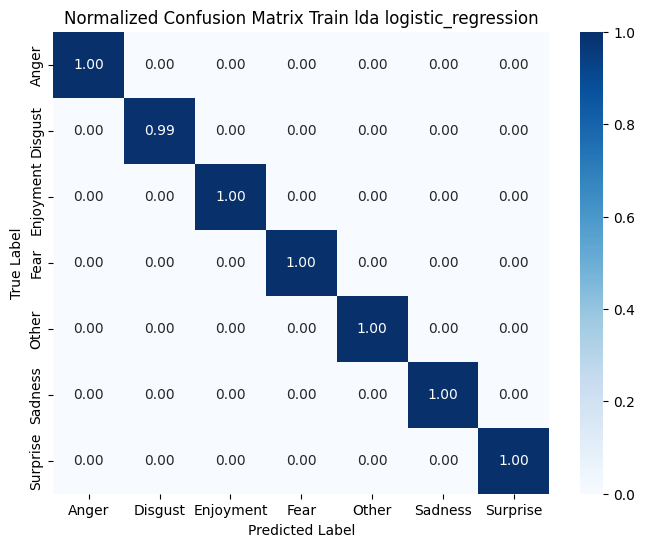

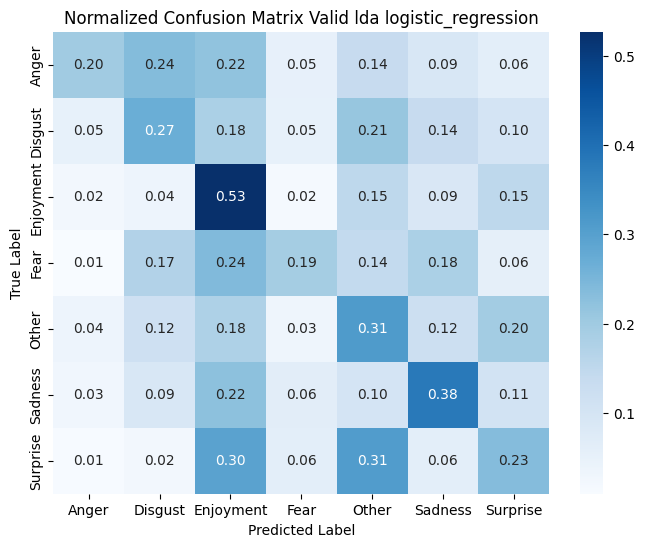

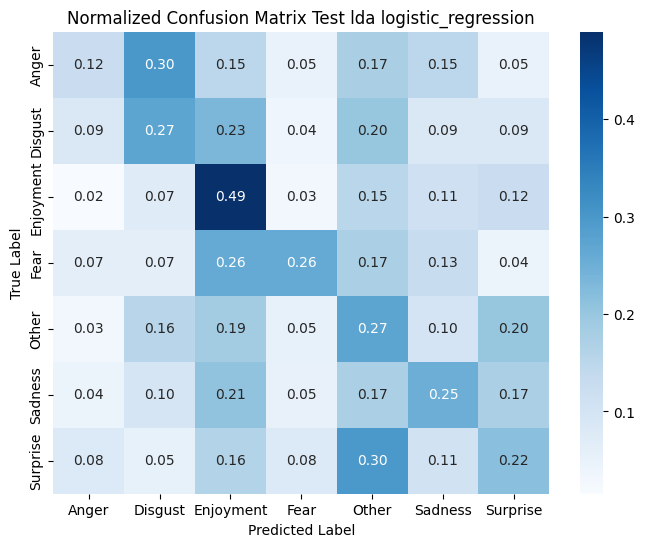

In [59]:
X_train_lda_73, X_valid_lda_73, X_test_lda_73, y_train_lda_73, y_valid_lda_73, y_test_lda_73, tfidf_vec_lda_73, disc_model_lda_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="lda"
)

model_lda_73, train_lda_73, valid_lda_73, test_lda_73, pred_lda_73 = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_lda_73, y_pred_valid_lda_73, y_pred_test_lda_73 = pred_lda_73

pipeline_evaluation(
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    y_pred_train_lda_73, y_pred_valid_lda_73, y_pred_test_lda_73,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.508086876155268
Recall: 0.508086876155268
Precision: 0.5584664019323156
F1-score: 0.4704680014745788

--- valid --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.48463611859838274
Recall: 0.48463611859838274
Precision: 0.518702047853261
F1-score: 0.4451289885131649

--- test --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.46656976744186046
Recall: 0.46656976744186046
Precision: 0.4577756252125252
F1-score: 0.4279012617211753


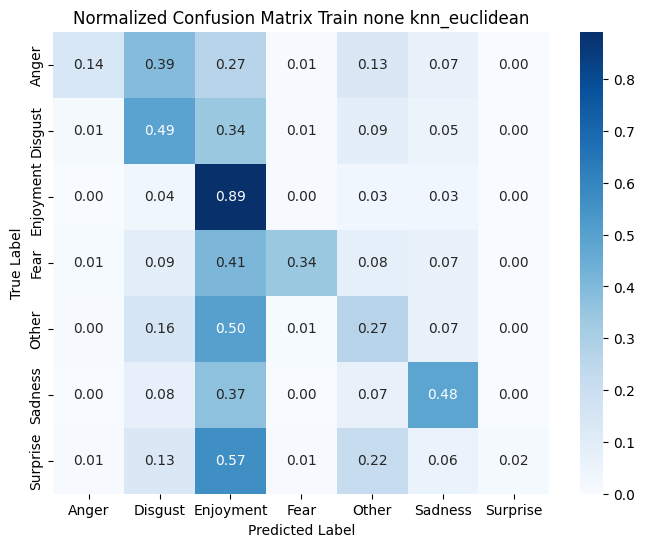

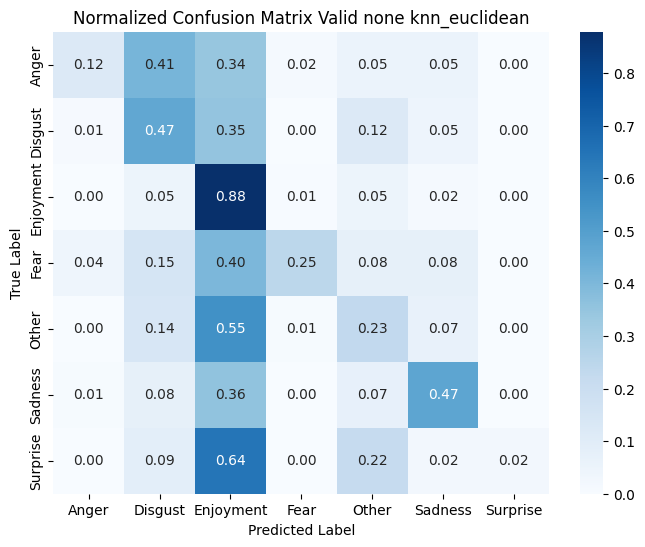

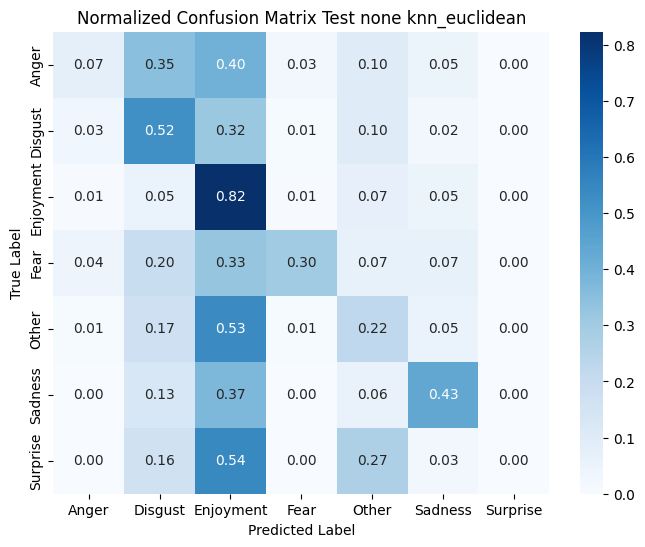

In [60]:
# KNN - euclidean - None (7:3)
model_73_knn_euclidean, train_73_knn_euclidean, valid_73_knn_euclidean, test_73_knn_euclidean, pred_73_knn_euclidean = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="knn",
    metric="euclidean"
)

y_pred_train_73_knn_euclidean, y_pred_valid_73_knn_euclidean, y_pred_test_73_knn_euclidean = pred_73_knn_euclidean

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73_knn_euclidean, y_pred_valid_73_knn_euclidean, y_pred_test_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- knn --- none ---
Accuracy: 0.5078558225508318
Recall: 0.5078558225508318
Precision: 0.558201133652253
F1-score: 0.47024950049160896

--- valid --- 7:3 --- knn --- none ---
Accuracy: 0.48517520215633425
Recall: 0.48517520215633425
Precision: 0.5193044438652386
F1-score: 0.44570399460190463

--- test --- 7:3 --- knn --- none ---
Accuracy: 0.46656976744186046
Recall: 0.46656976744186046
Precision: 0.4580587367009667
F1-score: 0.4279553034407939


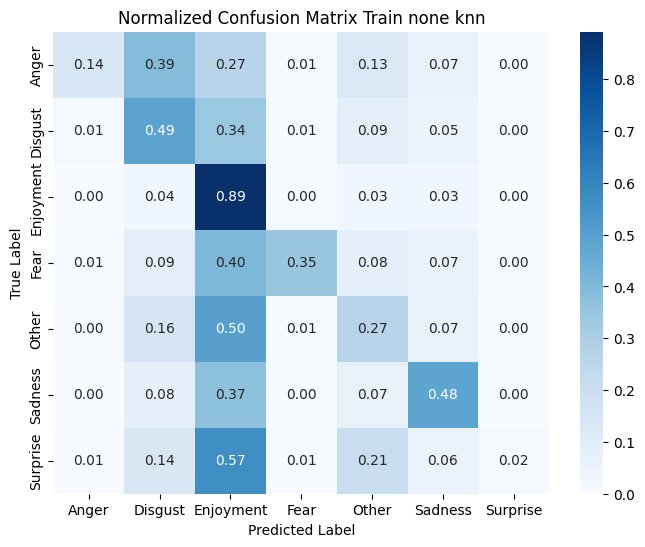

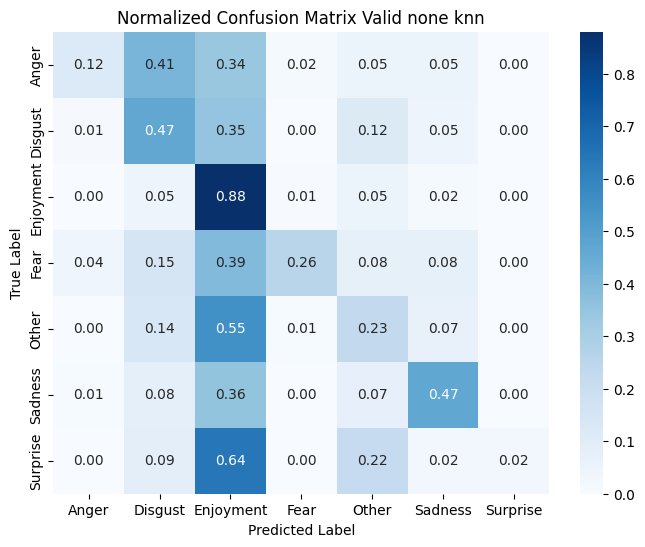

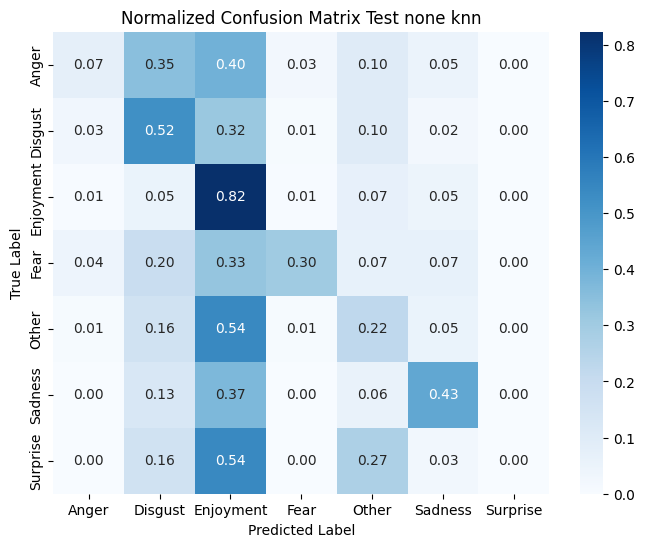

In [61]:
# KNN - cosine - none
model_73_knn, train_73_knn, valid_73_knn, test_73_knn, pred_73_knn = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="knn"
)

y_pred_train_73_knn, y_pred_valid_73_knn, y_pred_test_73_knn = pred_73_knn

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73_knn, y_pred_valid_73_knn, y_pred_test_73_knn,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu PCA

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.506007393715342
Recall: 0.506007393715342
Precision: 0.554004396854277
F1-score: 0.4677064487549784

--- valid --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.4862533692722372
Recall: 0.4862533692722372
Precision: 0.4877744735726932
F1-score: 0.4445952854171806

--- test --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.4752906976744186
Recall: 0.4752906976744186
Precision: 0.4636222984483492
F1-score: 0.43583797885013476


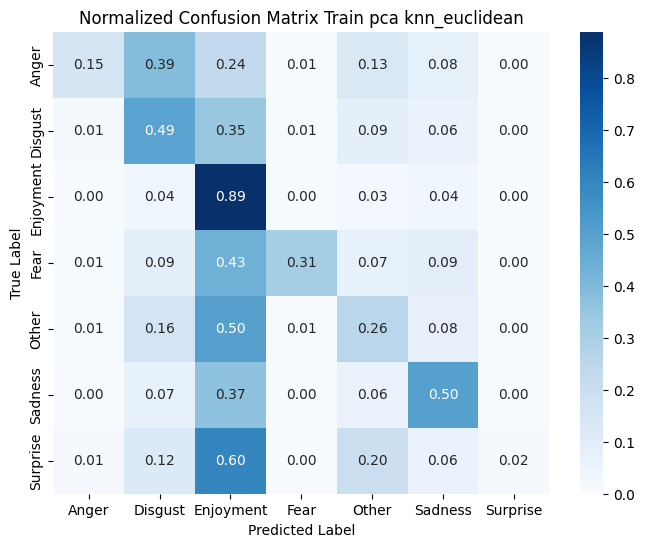

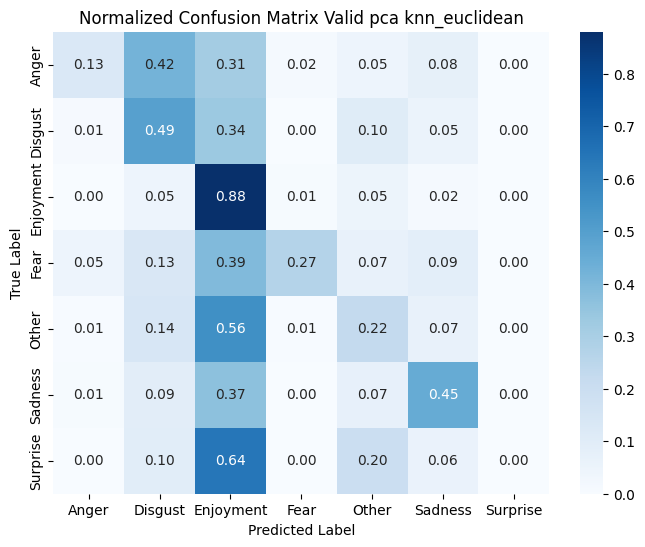

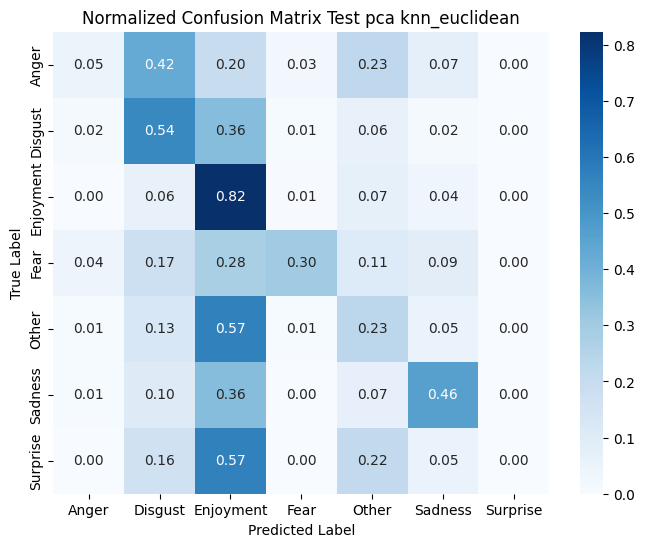

In [62]:
# KNN - euclidean - PCA (7:3)
model_pca_73_knn_euclidean, train_pca_73_knn_euclidean, valid_pca_73_knn_euclidean, test_pca_73_knn_euclidean, pred_pca_73_knn_euclidean = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_73_knn_euclidean, y_valid_pca_73_knn_euclidean, y_test_pca_73_knn_euclidean = train_pca_73_knn_euclidean[1], valid_pca_73_knn_euclidean[1], test_pca_73_knn_euclidean[1]
y_pred_train_pca_73_knn_euclidean, y_pred_valid_pca_73_knn_euclidean, y_pred_test_pca_73_knn_euclidean = pred_pca_73_knn_euclidean

pipeline_evaluation(
    y_train_pca_73_knn_euclidean, y_valid_pca_73_knn_euclidean, y_test_pca_73_knn_euclidean,
    y_pred_train_pca_73_knn_euclidean, y_pred_valid_pca_73_knn_euclidean, y_pred_test_pca_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- knn --- pca ---
Accuracy: 0.5076247689463955
Recall: 0.5076247689463955
Precision: 0.5572073999290581
F1-score: 0.4714744774140349

--- valid --- 7:3 --- knn --- pca ---
Accuracy: 0.4797843665768194
Recall: 0.4797843665768194
Precision: 0.507930965246405
F1-score: 0.44118710525387794

--- test --- 7:3 --- knn --- pca ---
Accuracy: 0.4636627906976744
Recall: 0.4636627906976744
Precision: 0.45521046407914445
F1-score: 0.4296567030740859


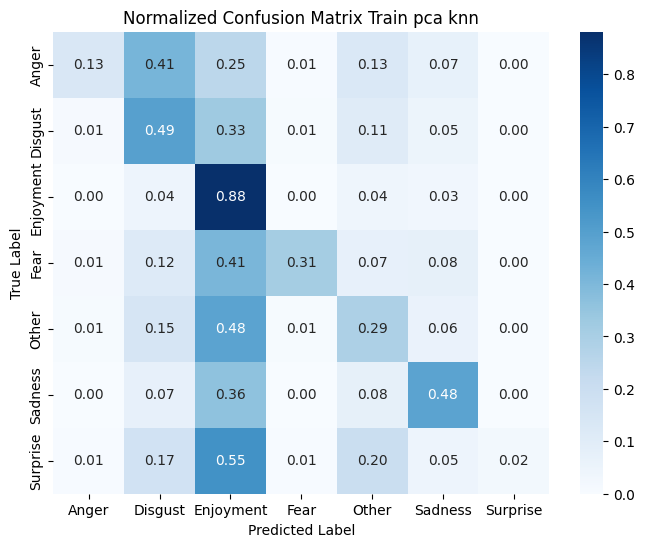

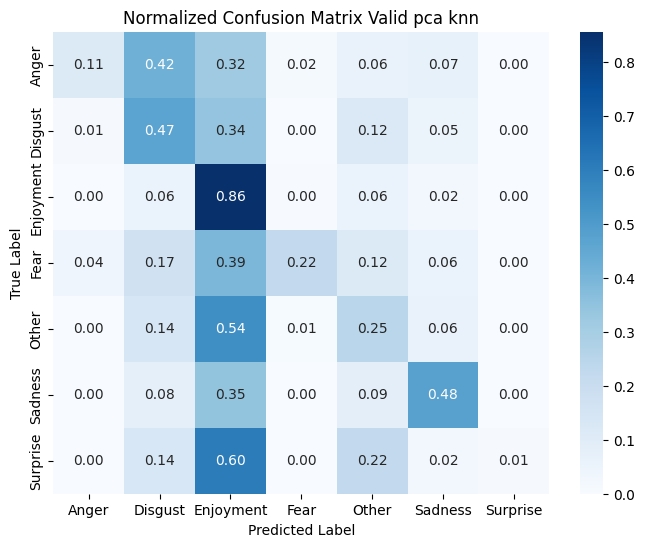

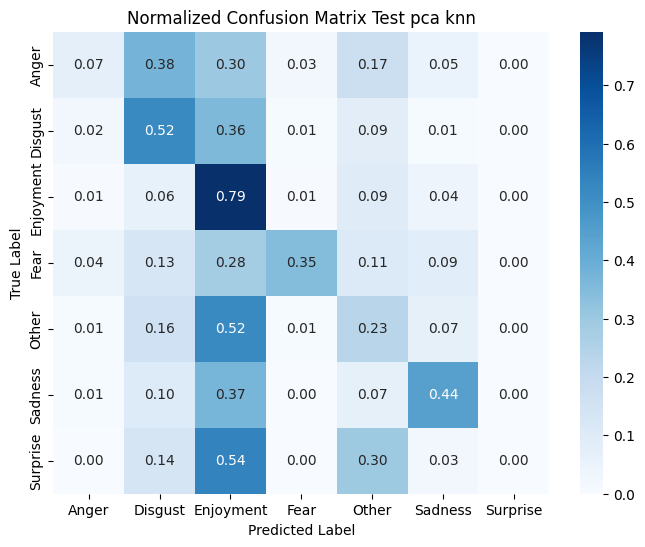

In [63]:
model_pca_73_knn, train_pca_73_knn, valid_pca_73_knn, test_pca_73_knn, pred_pca_73_knn = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="knn",
    max_iter=1000
)

y_train_pca_73_knn, y_valid_pca_73_knn, y_test_pca_73_knn = train_pca_73_knn[1], valid_pca_73_knn[1], test_pca_73_knn[1]
y_pred_train_pca_73_knn, y_pred_valid_pca_73_knn, y_pred_test_pca_73_knn = pred_pca_73_knn

pipeline_evaluation(
    y_train_pca_73_knn, y_valid_pca_73_knn, y_test_pca_73_knn,
    y_pred_train_pca_73_knn, y_pred_valid_pca_73_knn, y_pred_test_pca_73_knn,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.9990757855822551
Recall: 0.9990757855822551
Precision: 0.9990801971069222
F1-score: 0.9990756622796274

--- valid --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.3665768194070081
Recall: 0.3665768194070081
Precision: 0.3953723523663159
F1-score: 0.37250265775768354

--- test --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.31540697674418605
Recall: 0.31540697674418605
Precision: 0.34293470918578767
F1-score: 0.32047491002292755


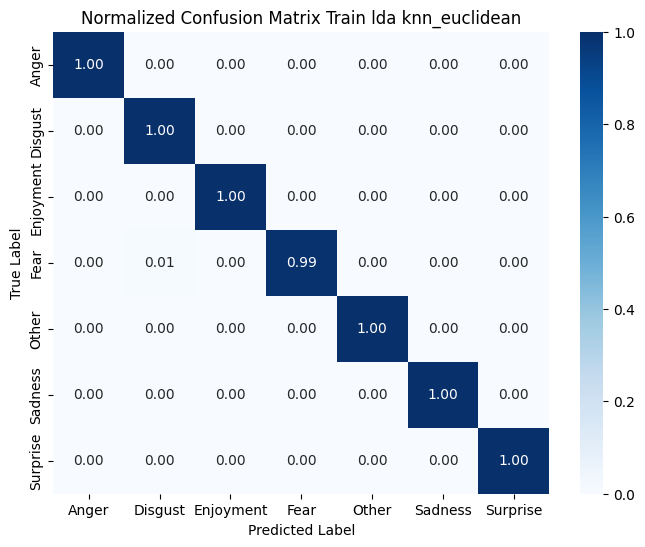

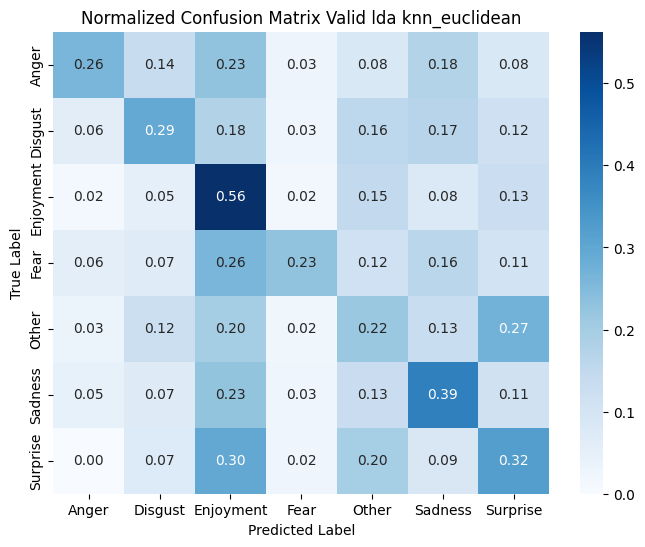

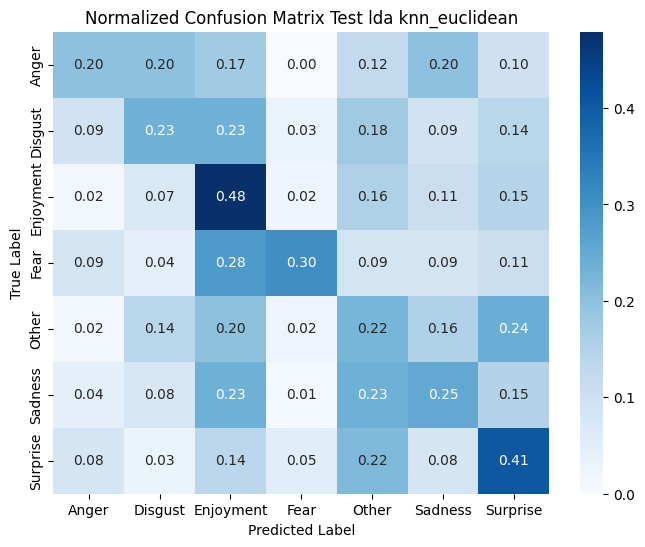

In [64]:
# KNN - euclidean - LDA (7:3)
model_lda_73_knn_euclidean, train_lda_73_knn_euclidean, valid_lda_73_knn_euclidean, test_lda_73_knn_euclidean, pred_lda_73_knn_euclidean = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_73_knn_euclidean, y_valid_lda_73_knn_euclidean, y_test_lda_73_knn_euclidean = train_lda_73_knn_euclidean[1], valid_lda_73_knn_euclidean[1], test_lda_73_knn_euclidean[1]
y_pred_train_lda_73_knn_euclidean, y_pred_valid_lda_73_knn_euclidean, y_pred_test_lda_73_knn_euclidean = pred_lda_73_knn_euclidean

pipeline_evaluation(
    y_train_lda_73_knn_euclidean, y_valid_lda_73_knn_euclidean, y_test_lda_73_knn_euclidean,
    y_pred_train_lda_73_knn_euclidean, y_pred_valid_lda_73_knn_euclidean, y_pred_test_lda_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 7:3 --- knn --- lda ---
Accuracy: 0.9988447319778189
Recall: 0.9988447319778189
Precision: 0.9988464686170254
F1-score: 0.9988446801394129

--- valid --- 7:3 --- knn --- lda ---
Accuracy: 0.3849056603773585
Recall: 0.3849056603773585
Precision: 0.3954093972593839
F1-score: 0.37934345198313146

--- test --- 7:3 --- knn --- lda ---
Accuracy: 0.3313953488372093
Recall: 0.3313953488372093
Precision: 0.3379545204560636
F1-score: 0.32740271804980614


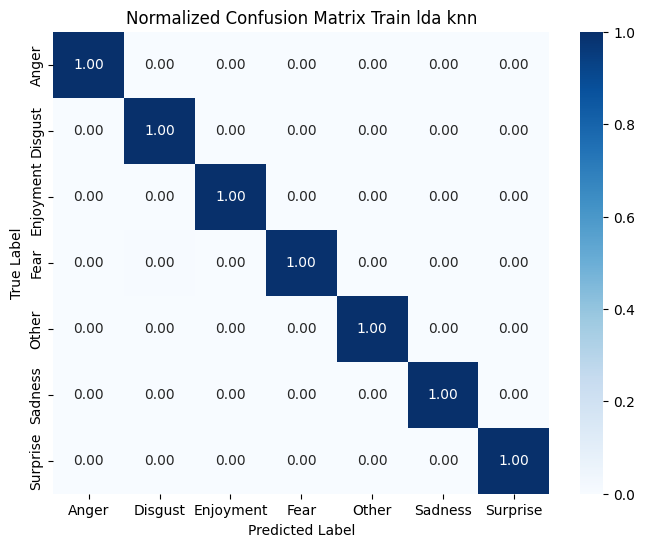

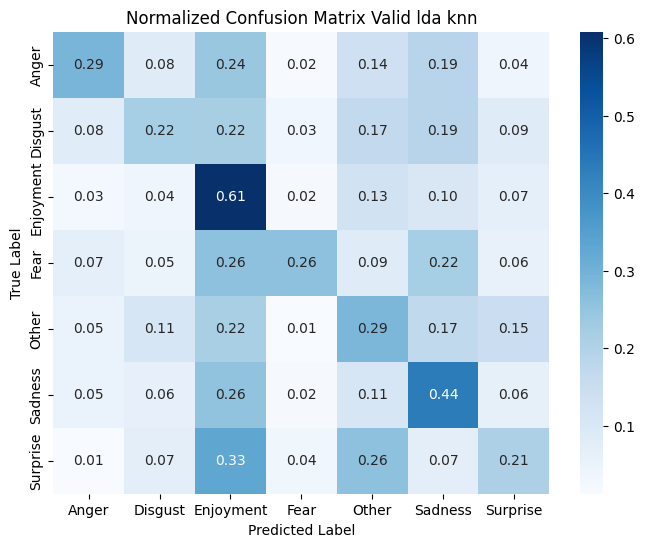

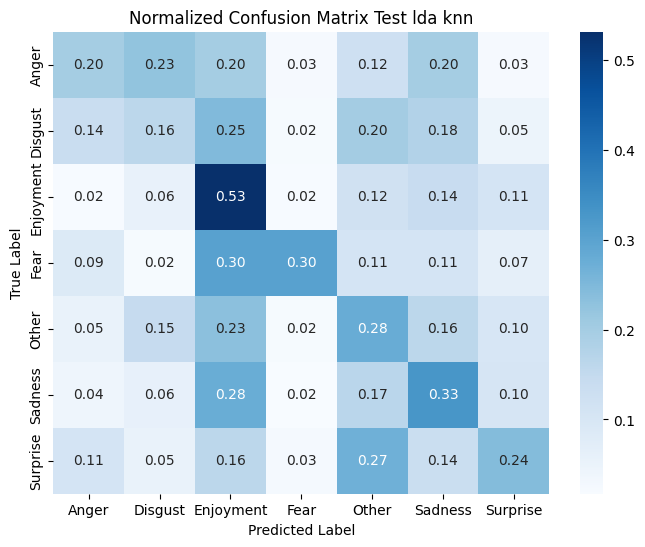

In [65]:

model_lda_73_knn, train_lda_73_knn, valid_lda_73_knn, test_lda_73_knn, pred_lda_73_knn = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="knn",
    max_iter=1000
)

y_train_lda_73_knn, y_valid_lda_73_knn, y_test_lda_73_knn = train_lda_73_knn[1], valid_lda_73_knn[1], test_lda_73_knn[1]
y_pred_train_lda_73_knn, y_pred_valid_lda_73_knn, y_pred_test_lda_73_knn = pred_lda_73_knn

pipeline_evaluation(
    y_train_lda_73_knn, y_valid_lda_73_knn, y_test_lda_73_knn,
    y_pred_train_lda_73_knn, y_pred_valid_lda_73_knn, y_pred_test_lda_73_knn,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu gốc

--- train --- 7:3 --- svm_linear --- none ---
Accuracy: 0.9655730129390019
Recall: 0.9655730129390019
Precision: 0.9661396543561439
F1-score: 0.9655983355952394

--- valid --- 7:3 --- svm_linear --- none ---
Accuracy: 0.5584905660377358
Recall: 0.5584905660377358
Precision: 0.558323696357842
F1-score: 0.5574510070102413

--- test --- 7:3 --- svm_linear --- none ---
Accuracy: 0.5537790697674418
Recall: 0.5537790697674418
Precision: 0.5574895024165538
F1-score: 0.5539397033890027


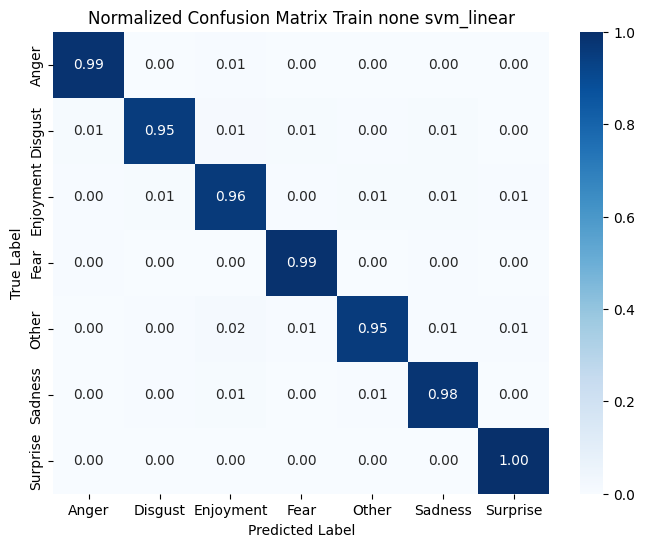

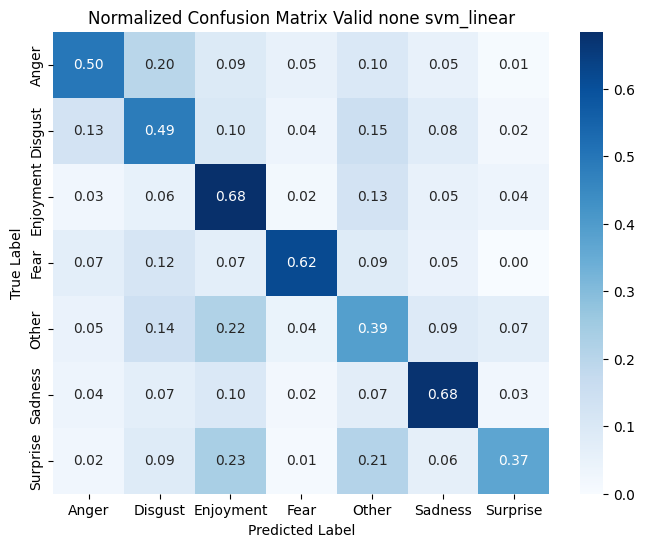

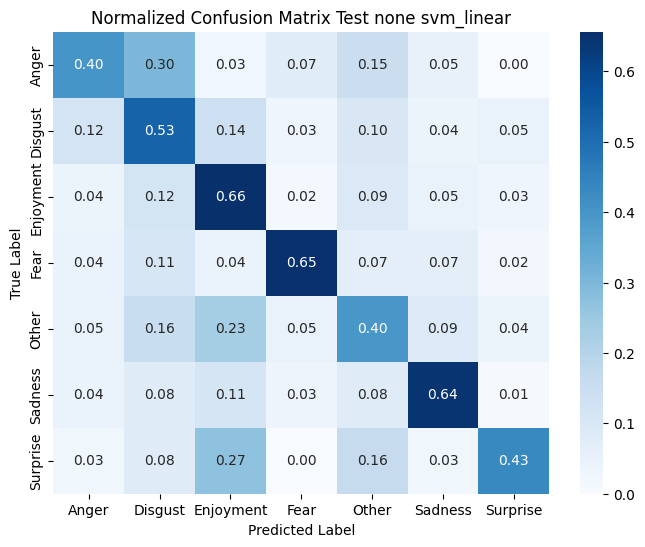

In [66]:
# SVM - linear - None (7:3)
model_73_svm_linear, train_73_svm_linear, valid_73_svm_linear, test_73_svm_linear, pred_73_svm_linear = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_73_svm_linear, y_valid_73_svm_linear, y_test_73_svm_linear = train_73_svm_linear[1], valid_73_svm_linear[1], test_73_svm_linear[1]
y_pred_train_73_svm_linear, y_pred_valid_73_svm_linear, y_pred_test_73_svm_linear = pred_73_svm_linear

pipeline_evaluation(
    y_train_73_svm_linear, y_valid_73_svm_linear, y_test_73_svm_linear,
    y_pred_train_73_svm_linear, y_pred_valid_73_svm_linear, y_pred_test_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_poly --- none ---
Accuracy: 0.9930683918669131
Recall: 0.9930683918669131
Precision: 0.9931159871006056
F1-score: 0.9930690251959118

--- valid --- 7:3 --- svm_poly --- none ---
Accuracy: 0.45983827493261453
Recall: 0.45983827493261453
Precision: 0.5921567287073843
F1-score: 0.46281336041436905

--- test --- 7:3 --- svm_poly --- none ---
Accuracy: 0.46656976744186046
Recall: 0.46656976744186046
Precision: 0.607139638924745
F1-score: 0.4620897906427009


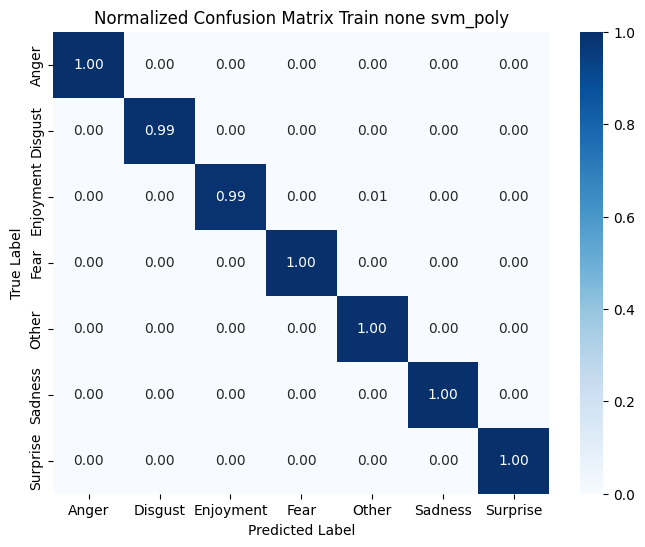

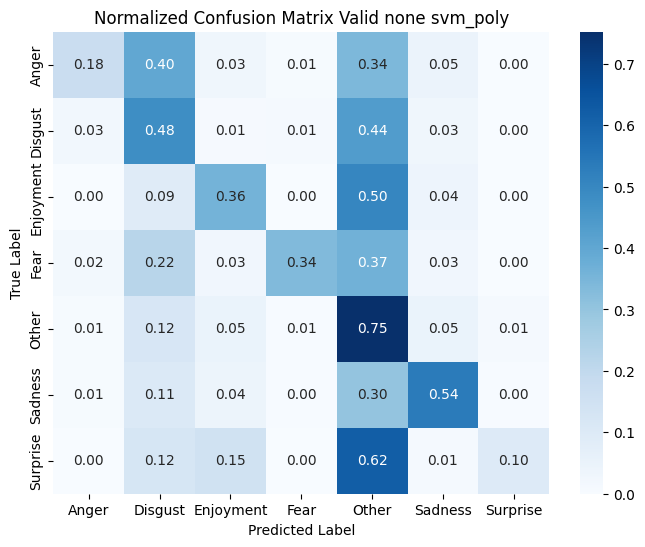

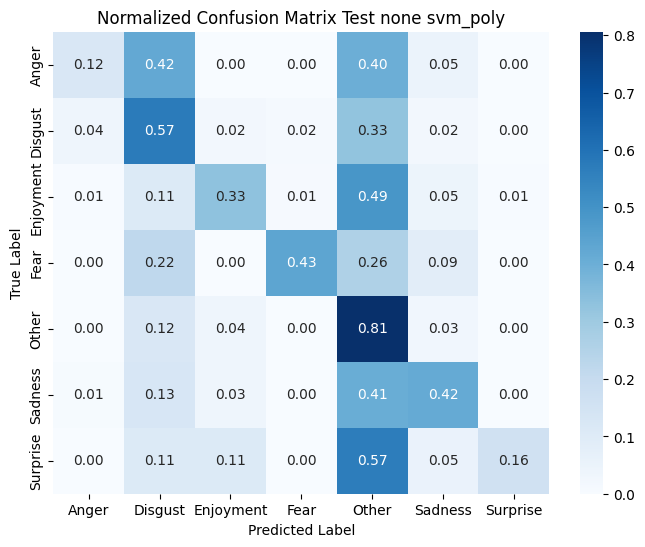

In [67]:
# SVM - poly - None (7:3)
model_73_svm_poly, train_73_svm_poly, valid_73_svm_poly, test_73_svm_poly, pred_73_svm_poly = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly = train_73_svm_poly[1], valid_73_svm_poly[1], test_73_svm_poly[1]
y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly = pred_73_svm_poly

pipeline_evaluation(
    y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly,
    y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.9715804066543438
Recall: 0.9715804066543438
Precision: 0.97274954944367
F1-score: 0.9715880636790065

--- valid --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.5245283018867924
Recall: 0.5245283018867924
Precision: 0.59134697880883
F1-score: 0.5311007048360026

--- test --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.5188953488372093
Recall: 0.5188953488372093
Precision: 0.5895647382344846
F1-score: 0.5230495334495536


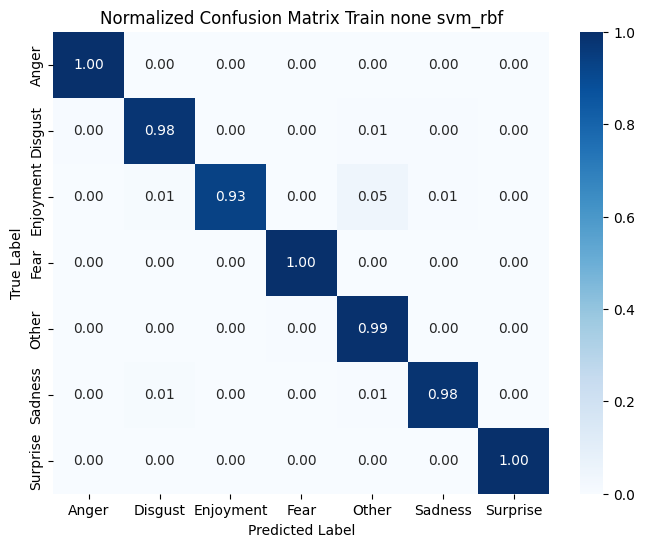

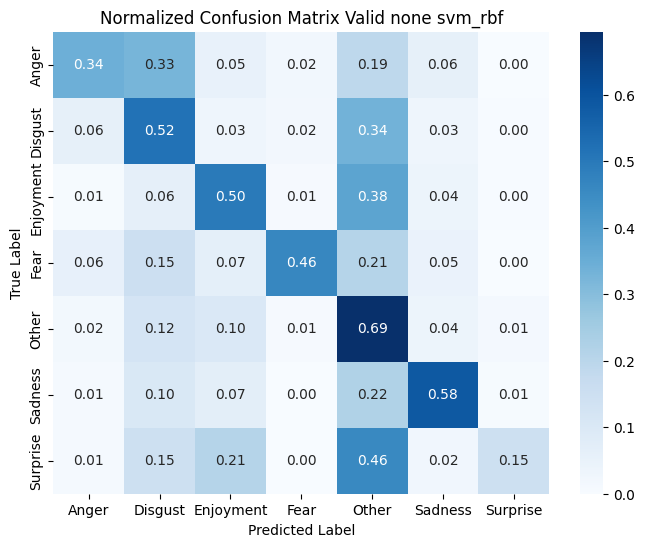

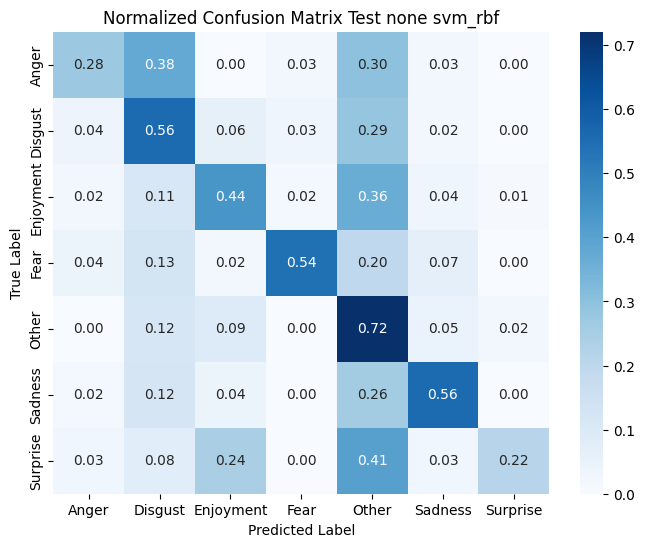

In [68]:
# SVM - rbf - None (7:3)
model_73_svm_rbf, train_73_svm_rbf, valid_73_svm_rbf, test_73_svm_rbf, pred_73_svm_rbf = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_73_svm_rbf, y_valid_73_svm_rbf, y_test_73_svm_rbf = train_73_svm_rbf[1], valid_73_svm_rbf[1], test_73_svm_rbf[1]
y_pred_train_73_svm_rbf, y_pred_valid_73_svm_rbf, y_pred_test_73_svm_rbf = pred_73_svm_rbf

pipeline_evaluation(
    y_train_73_svm_rbf, y_valid_73_svm_rbf, y_test_73_svm_rbf,
    y_pred_train_73_svm_rbf, y_pred_valid_73_svm_rbf, y_pred_test_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

## Bộ dữ liệu PCA

--- train --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.902264325323475
Recall: 0.902264325323475
Precision: 0.9051099044358517
F1-score: 0.9021692019430709

--- valid --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.5606469002695418
Recall: 0.5606469002695418
Precision: 0.5586455934003434
F1-score: 0.5583428042338231

--- test --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.5552325581395349
Recall: 0.5552325581395349
Precision: 0.559282234968784
F1-score: 0.5545354338244105


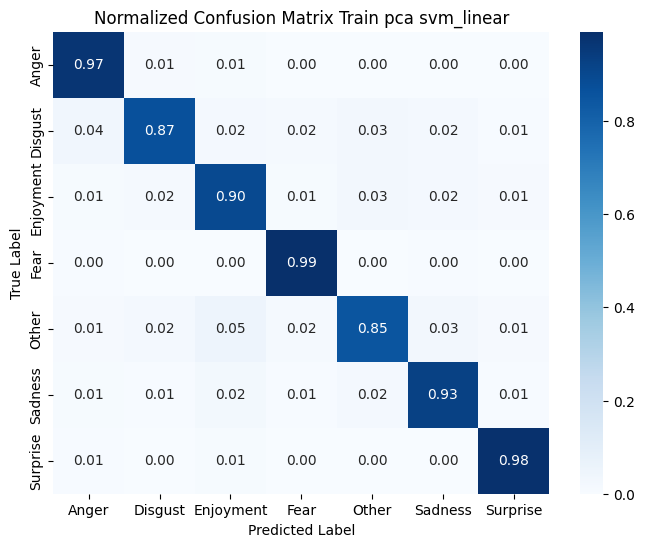

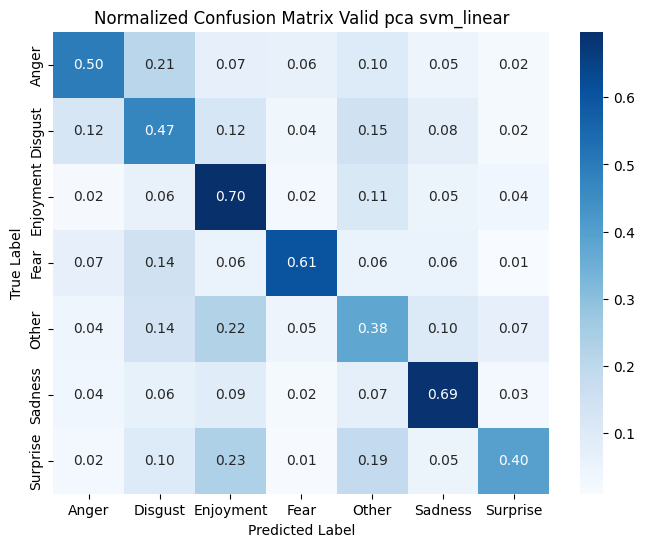

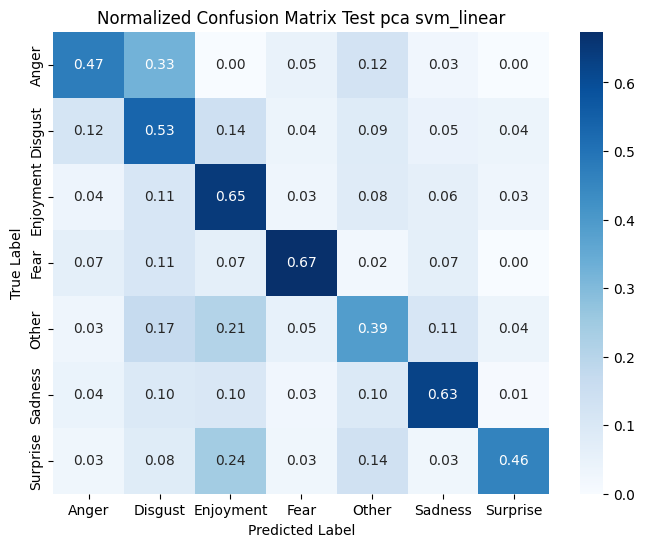

In [69]:
# SVM - linear - PCA (7:3)
model_pca_73_svm_linear, train_pca_73_svm_linear, valid_pca_73_svm_linear, test_pca_73_svm_linear, pred_pca_73_svm_linear = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_73_svm_linear, y_valid_pca_73_svm_linear, y_test_pca_73_svm_linear = train_pca_73_svm_linear[1], valid_pca_73_svm_linear[1], test_pca_73_svm_linear[1]
y_pred_train_pca_73_svm_linear, y_pred_valid_pca_73_svm_linear, y_pred_test_pca_73_svm_linear = pred_pca_73_svm_linear

pipeline_evaluation(
    y_train_pca_73_svm_linear, y_valid_pca_73_svm_linear, y_test_pca_73_svm_linear,
    y_pred_train_pca_73_svm_linear, y_pred_valid_pca_73_svm_linear, y_pred_test_pca_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.9898336414048059
Recall: 0.9898336414048059
Precision: 0.9899549976439136
F1-score: 0.989835810586819

--- valid --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.4522911051212938
Recall: 0.4522911051212938
Precision: 0.5894518551275274
F1-score: 0.4567642932873904

--- test --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.44622093023255816
Recall: 0.44622093023255816
Precision: 0.5952899159680883
F1-score: 0.4467960970109552


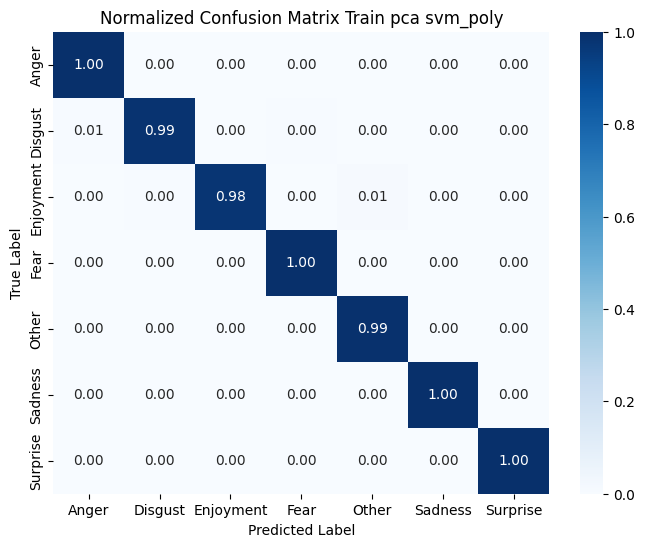

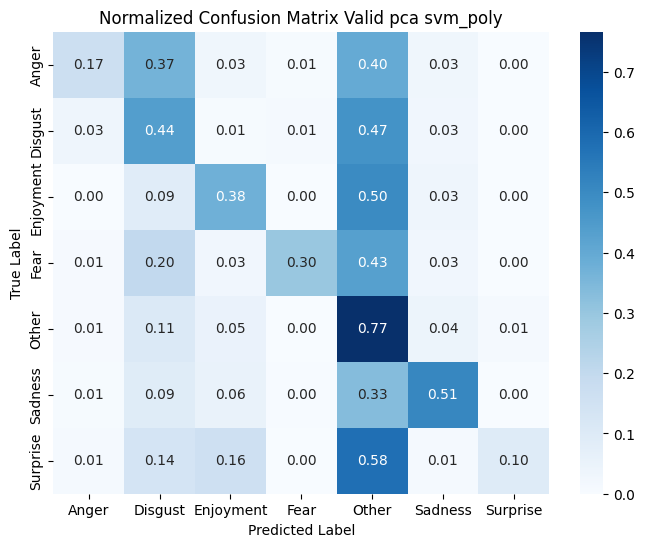

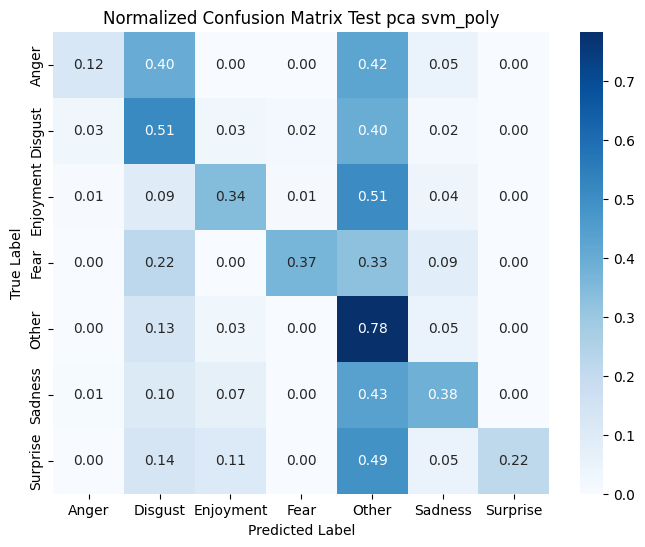

In [70]:
# SVM - poly - PCA (7:3)
model_pca_73_svm_poly, train_pca_73_svm_poly, valid_pca_73_svm_poly, test_pca_73_svm_poly, pred_pca_73_svm_poly = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly = train_pca_73_svm_poly[1], valid_pca_73_svm_poly[1], test_pca_73_svm_poly[1]
y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly = pred_pca_73_svm_poly

pipeline_evaluation(
    y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly,
    y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.94362292051756
Recall: 0.94362292051756
Precision: 0.9473868687876057
F1-score: 0.9437318705642395

--- valid --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.5380053908355795
Recall: 0.5380053908355795
Precision: 0.5729338285350339
F1-score: 0.542949913498706

--- test --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.5159883720930233
Recall: 0.5159883720930233
Precision: 0.5610188697964112
F1-score: 0.5218356679391839


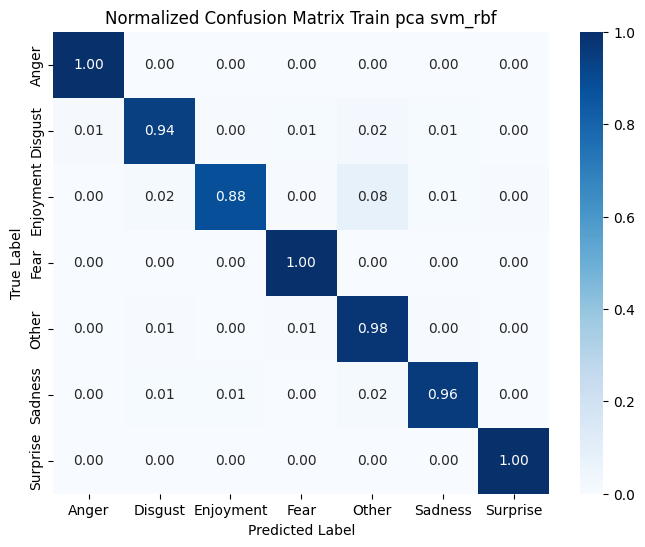

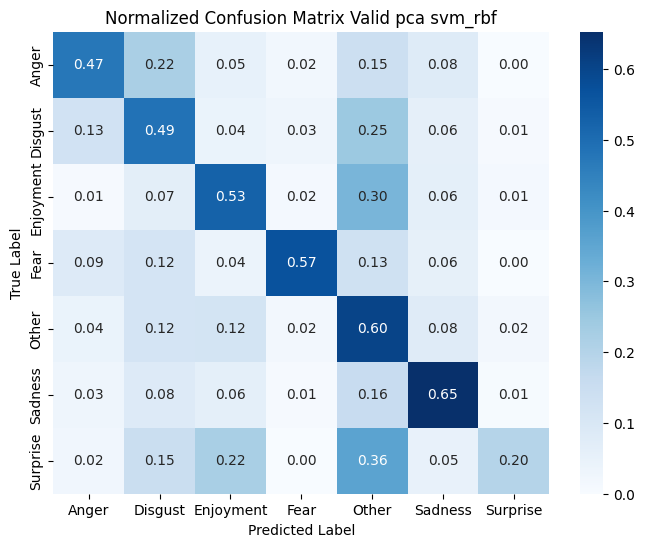

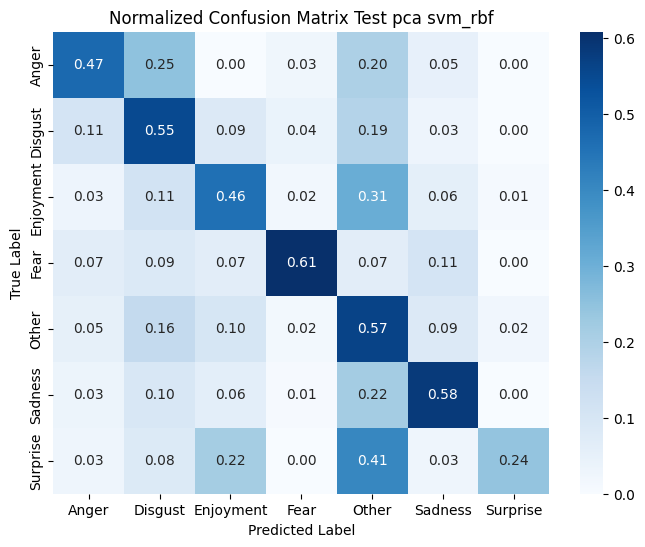

In [71]:
# SVM - rbf - PCA (7:3)
model_pca_73_svm_rbf, train_pca_73_svm_rbf, valid_pca_73_svm_rbf, test_pca_73_svm_rbf, pred_pca_73_svm_rbf = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_73_svm_rbf, y_valid_pca_73_svm_rbf, y_test_pca_73_svm_rbf = train_pca_73_svm_rbf[1], valid_pca_73_svm_rbf[1], test_pca_73_svm_rbf[1]
y_pred_train_pca_73_svm_rbf, y_pred_valid_pca_73_svm_rbf, y_pred_test_pca_73_svm_rbf = pred_pca_73_svm_rbf

pipeline_evaluation(
    y_train_pca_73_svm_rbf, y_valid_pca_73_svm_rbf, y_test_pca_73_svm_rbf,
    y_pred_train_pca_73_svm_rbf, y_pred_valid_pca_73_svm_rbf, y_pred_test_pca_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

## Bộ dữ liệu LDA

--- train --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.9988447319778189
Recall: 0.9988447319778189
Precision: 0.9988452532121906
F1-score: 0.9988445835588005

--- valid --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.3471698113207547
Recall: 0.3471698113207547
Precision: 0.3935334844209422
F1-score: 0.338315173641637

--- test --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.3125
Recall: 0.3125
Precision: 0.34086960217613643
F1-score: 0.29510495978397305


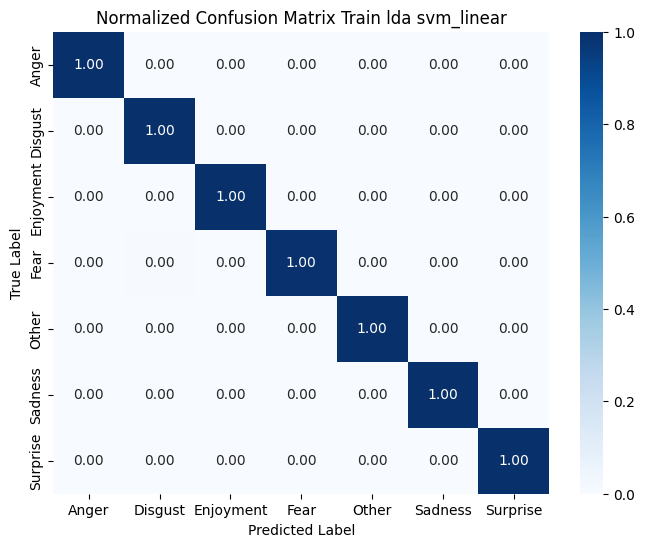

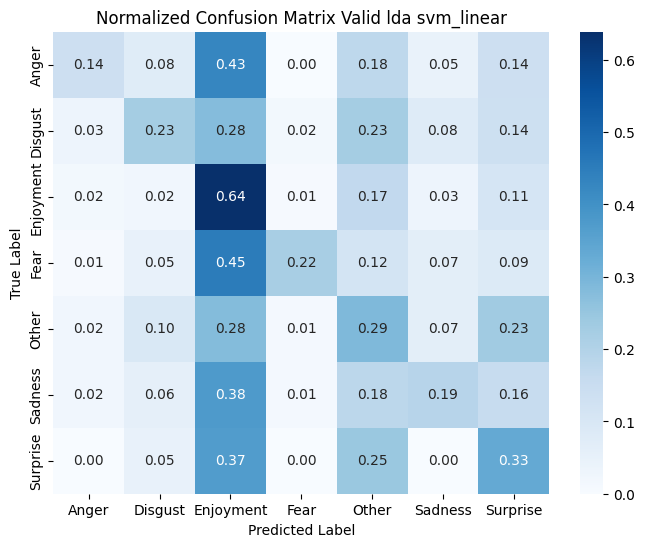

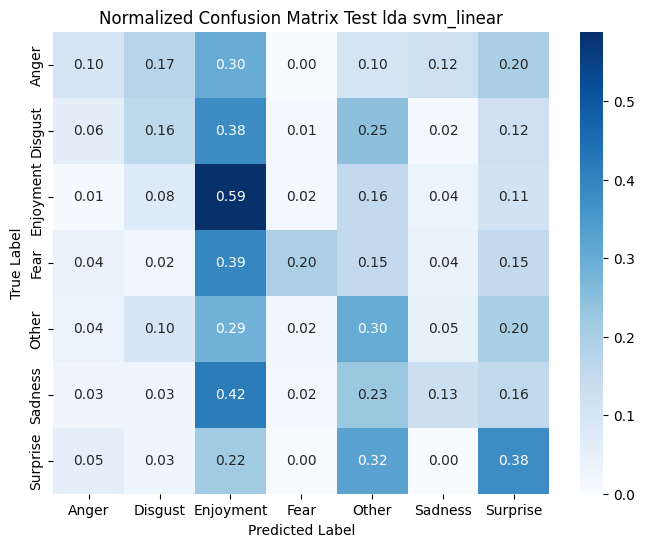

In [72]:
# SVM - linear - LDA (7:3)
model_lda_73_svm_linear, train_lda_73_svm_linear, valid_lda_73_svm_linear, test_lda_73_svm_linear, pred_lda_73_svm_linear = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_73_svm_linear, y_valid_lda_73_svm_linear, y_test_lda_73_svm_linear = train_lda_73_svm_linear[1], valid_lda_73_svm_linear[1], test_lda_73_svm_linear[1]
y_pred_train_lda_73_svm_linear, y_pred_valid_lda_73_svm_linear, y_pred_test_lda_73_svm_linear = pred_lda_73_svm_linear

pipeline_evaluation(
    y_train_lda_73_svm_linear, y_valid_lda_73_svm_linear, y_test_lda_73_svm_linear,
    y_pred_train_lda_73_svm_linear, y_pred_valid_lda_73_svm_linear, y_pred_test_lda_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.9988447319778189
Recall: 0.9988447319778189
Precision: 0.9988483291230722
F1-score: 0.9988446113814801

--- valid --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.25660377358490566
Recall: 0.25660377358490566
Precision: 0.28756882085817753
F1-score: 0.2632402662994949

--- test --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.251453488372093
Recall: 0.251453488372093
Precision: 0.28702699584210856
F1-score: 0.25653668224174364


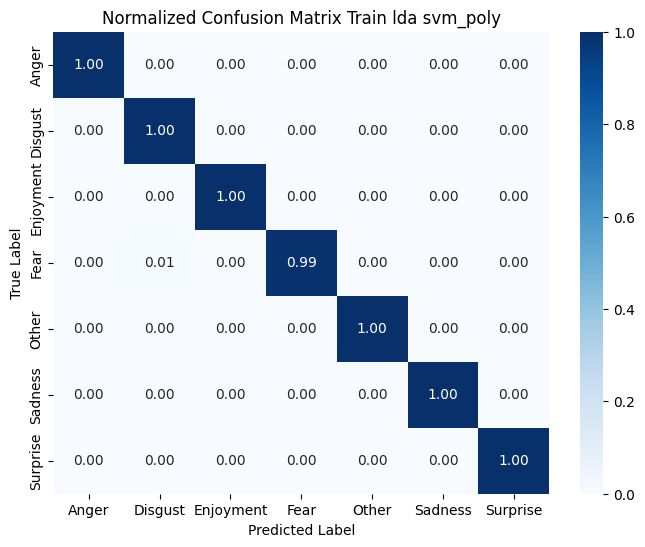

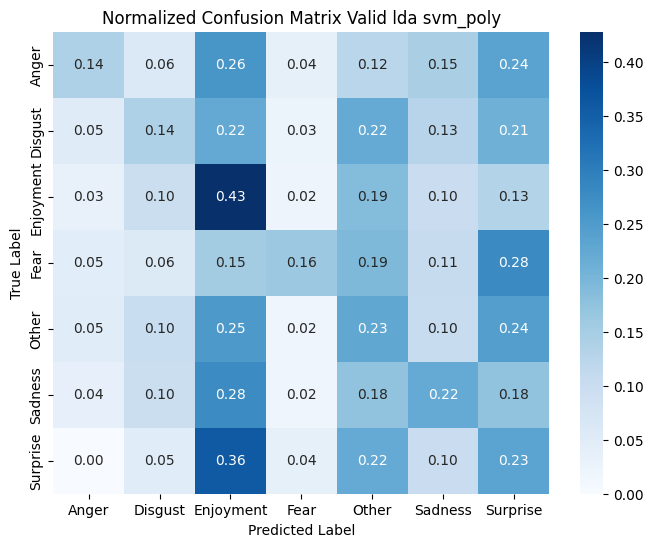

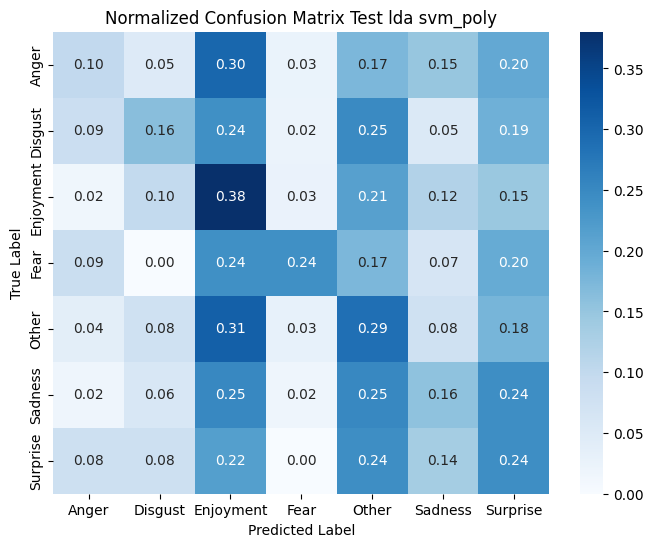

In [73]:
# SVM - poly - LDA (7:3)
model_lda_73_svm_poly, train_lda_73_svm_poly, valid_lda_73_svm_poly, test_lda_73_svm_poly, pred_lda_73_svm_poly = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_73_svm_poly, y_valid_lda_73_svm_poly, y_test_lda_73_svm_poly = train_lda_73_svm_poly[1], valid_lda_73_svm_poly[1], test_lda_73_svm_poly[1]
y_pred_train_lda_73_svm_poly, y_pred_valid_lda_73_svm_poly, y_pred_test_lda_73_svm_poly = pred_lda_73_svm_poly

pipeline_evaluation(
    y_train_lda_73_svm_poly, y_valid_lda_73_svm_poly, y_test_lda_73_svm_poly,
    y_pred_train_lda_73_svm_poly, y_pred_valid_lda_73_svm_poly, y_pred_test_lda_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.9988447319778189
Recall: 0.9988447319778189
Precision: 0.9988531406098499
F1-score: 0.9988459348718566

--- valid --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.2846361185983827
Recall: 0.2846361185983827
Precision: 0.13655658559078815
F1-score: 0.12750571381669318

--- test --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.2805232558139535
Recall: 0.2805232558139535
Precision: 0.245144460241698
F1-score: 0.12479635425362165


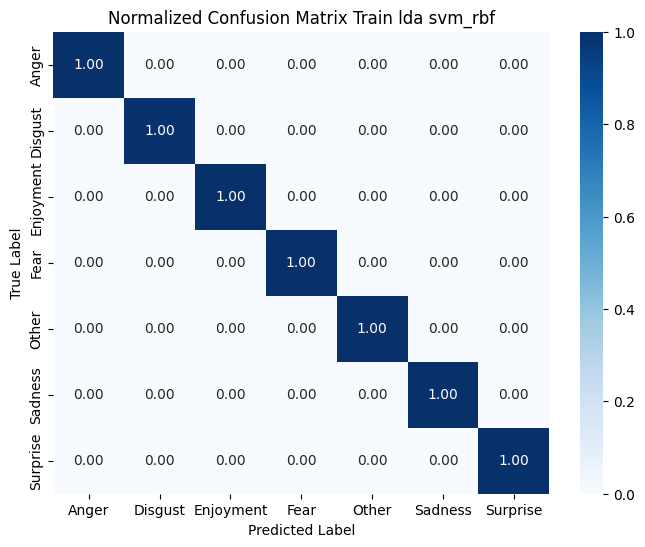

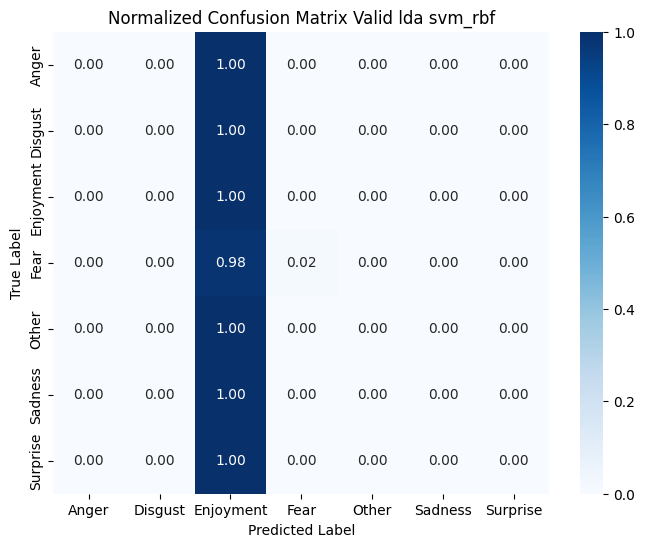

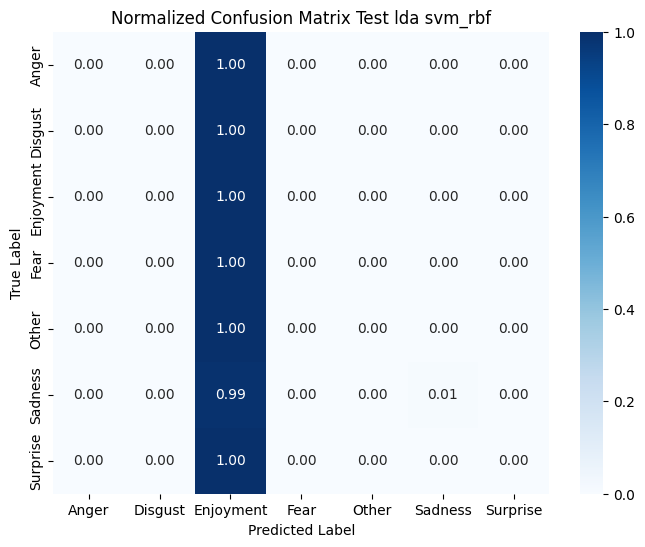

In [74]:
# SVM - rbf - LDA (7:3)
model_lda_73_svm_rbf, train_lda_73_svm_rbf, valid_lda_73_svm_rbf, test_lda_73_svm_rbf, pred_lda_73_svm_rbf = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_73_svm_rbf, y_valid_lda_73_svm_rbf, y_test_lda_73_svm_rbf = train_lda_73_svm_rbf[1], valid_lda_73_svm_rbf[1], test_lda_73_svm_rbf[1]
y_pred_train_lda_73_svm_rbf, y_pred_valid_lda_73_svm_rbf, y_pred_test_lda_73_svm_rbf = pred_lda_73_svm_rbf

pipeline_evaluation(
    y_train_lda_73_svm_rbf, y_valid_lda_73_svm_rbf, y_test_lda_73_svm_rbf,
    y_pred_train_lda_73_svm_rbf, y_pred_valid_lda_73_svm_rbf, y_pred_test_lda_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Train:Validation = 6:4

## Logistic Regression

### Bộ dữ liệu không giảm chiều

TF-IDF hoàn thành!
Shape: (3709, 6301) (số câu x số từ vựng)
Số từ vựng: 6301
TF-IDF - Non-zero values: 50423


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.8438932326772715
Recall: 0.8438932326772715
Precision: 0.8505245227919512
F1-score: 0.8435309559595782

--- valid --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.5388035569927243
Recall: 0.5388035569927243
Precision: 0.5529832211530136
F1-score: 0.54271010969859

--- test --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.5392441860465116
Recall: 0.5392441860465116
Precision: 0.5510320672561702
F1-score: 0.5426471519877429


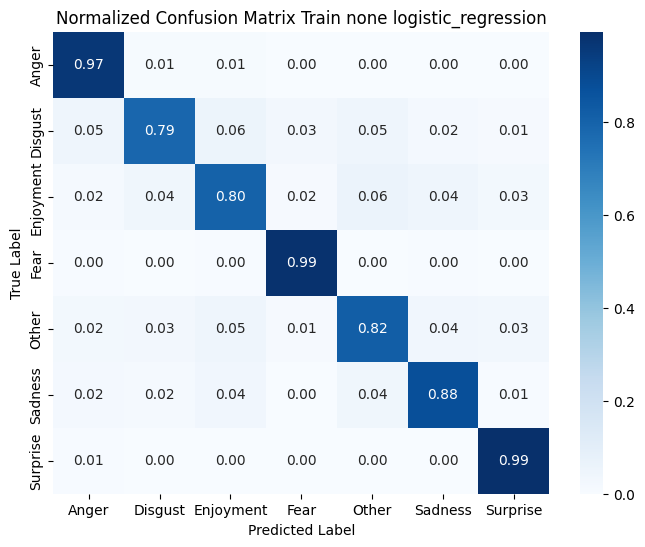

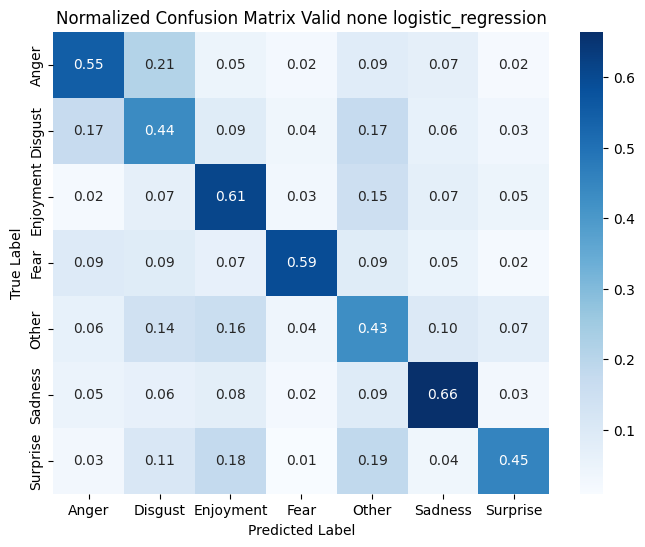

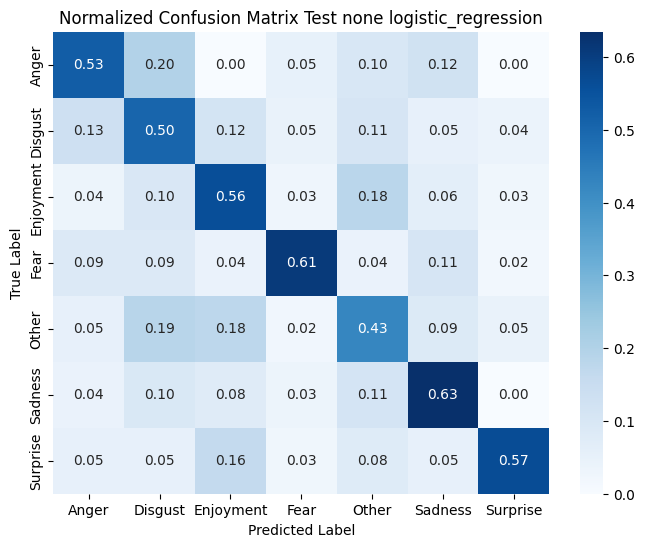

In [75]:
X_train_64, X_valid_64, X_test_64, y_train_64, y_valid_64, y_test_64, tfidf_vec_64, disc_model_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="none"
)

model_64, train_64, valid_64, test_64, pred_64 = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_64, y_pred_valid_64, y_pred_test_64 = pred_64
pipeline_evaluation(
    y_train_64, y_valid_64, y_test_64,
    y_pred_train_64, y_pred_valid_64, y_pred_test_64,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (3709, 6301) (số câu x số từ vựng)
Số từ vựng: 6301
TF-IDF - Non-zero values: 50423


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.8069560528444325
Recall: 0.8069560528444325
Precision: 0.817612590136444
F1-score: 0.8067304115232962

--- valid --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.5311236863379143
Recall: 0.5311236863379143
Precision: 0.5488561490631502
F1-score: 0.5360734138375735

--- test --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.5377906976744186
Recall: 0.5377906976744186
Precision: 0.55132769569977
F1-score: 0.5416421110131122


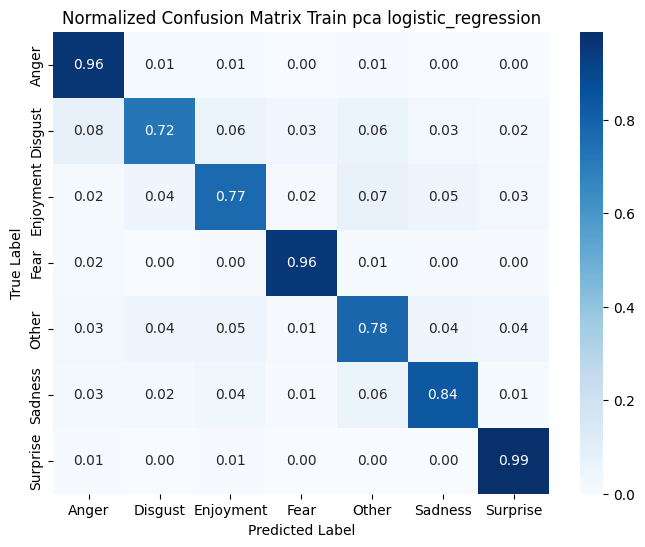

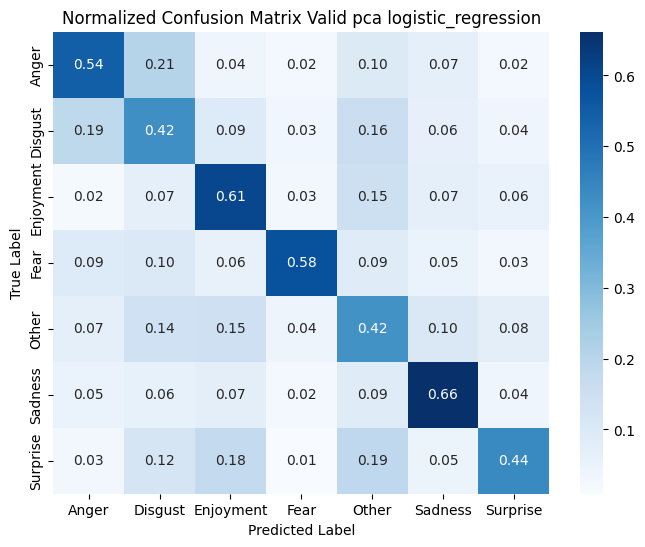

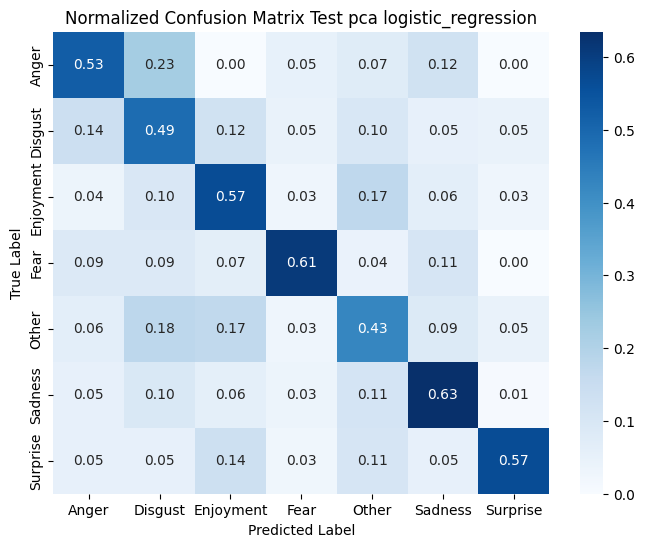

In [76]:
X_train_pca_64, X_valid_pca_64, X_test_pca_64, y_train_pca_64, y_valid_pca_64, y_test_pca_64, tfidf_vec_pca_64, disc_model_pca_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="pca"
)

model_pca_64, train_pca_64, valid_pca_64, test_pca_64, pred_pca_64 = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_pca_64, y_pred_valid_pca_64, y_pred_test_pca_64 = pred_pca_64

pipeline_evaluation(
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    y_pred_train_pca_64, y_pred_valid_pca_64, y_pred_test_pca_64,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (3709, 6301) (số câu x số từ vựng)
Số từ vựng: 6301
TF-IDF - Non-zero values: 50423


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.9994607710973308
Recall: 0.9994607710973308
Precision: 0.9994624980950494
F1-score: 0.9994608260974783

--- valid --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.28334680679062246
Recall: 0.28334680679062246
Precision: 0.36156021034960545
F1-score: 0.30253071838579415

--- test --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.26744186046511625
Recall: 0.26744186046511625
Precision: 0.31905113551683145
F1-score: 0.27900407267224986


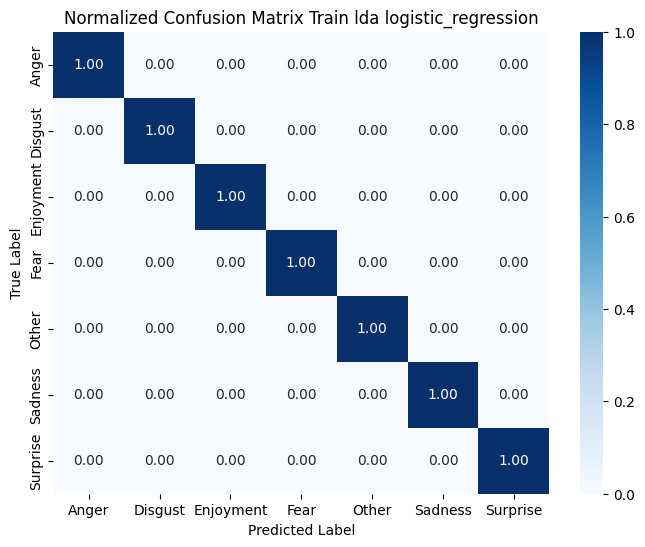

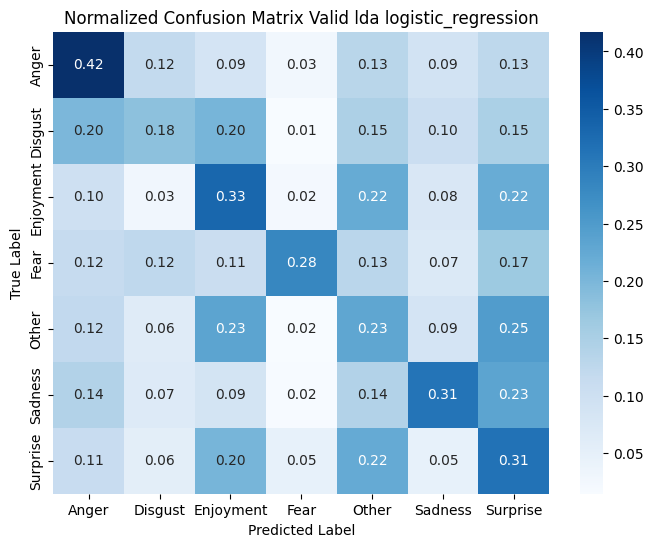

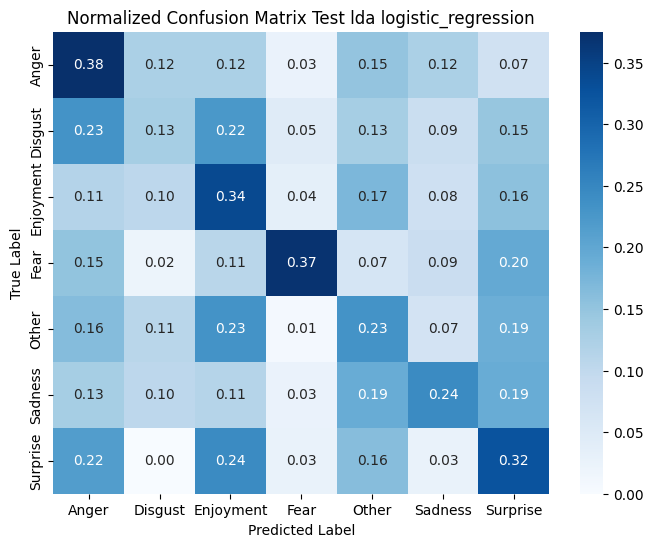

In [77]:
X_train_lda_64, X_valid_lda_64, X_test_lda_64, y_train_lda_64, y_valid_lda_64, y_test_lda_64, tfidf_vec_lda_64, disc_model_lda_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="lda"
)

model_lda_64, train_lda_64, valid_lda_64, test_lda_64, pred_lda_64 = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_lda_64, y_pred_valid_lda_64, y_pred_test_lda_64 = pred_lda_64

pipeline_evaluation(
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    y_pred_train_lda_64, y_pred_valid_lda_64, y_pred_test_lda_64,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.4931248314909679
Recall: 0.4931248314909679
Precision: 0.5581437286622861
F1-score: 0.452540204359123

--- valid --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.4757477768795473
Recall: 0.4757477768795473
Precision: 0.5123805819510815
F1-score: 0.4320046414109942

--- test --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.45058139534883723
Recall: 0.45058139534883723
Precision: 0.452941011093104
F1-score: 0.41092350532840716


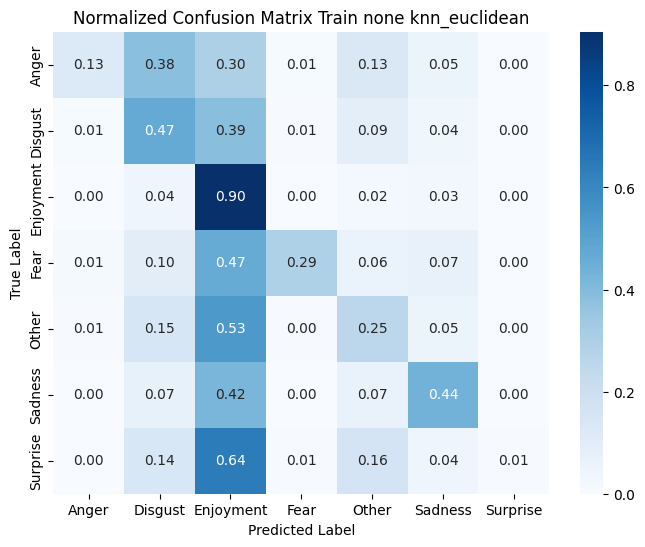

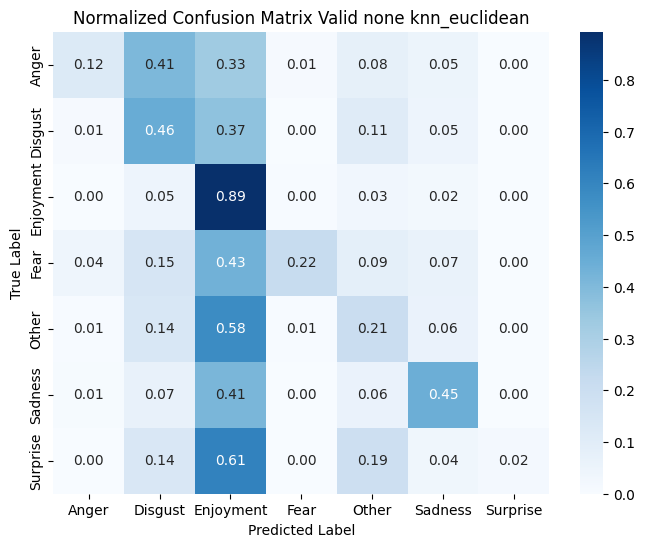

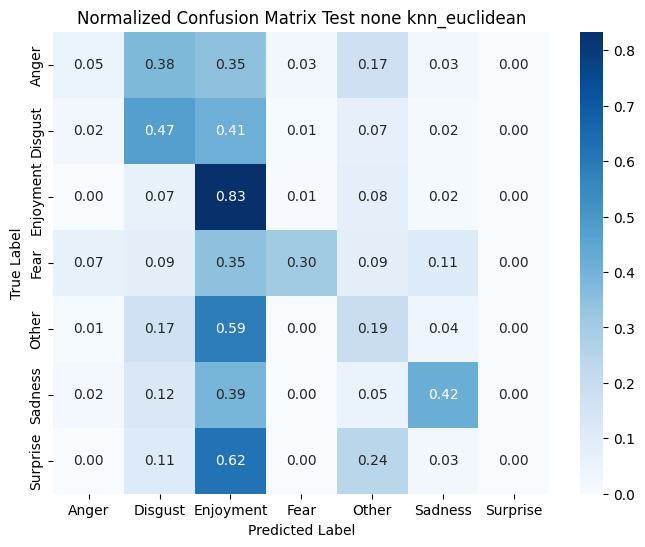

In [78]:
# KNN - euclidean - None (6:4)
model_64_knn_euclidean, train_64_knn_euclidean, valid_64_knn_euclidean, test_64_knn_euclidean, pred_64_knn_euclidean = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="knn",
    metric="euclidean"
)

y_train_64_knn_euclidean, y_valid_64_knn_euclidean, y_test_64_knn_euclidean = train_64_knn_euclidean[1], valid_64_knn_euclidean[1], test_64_knn_euclidean[1]
y_pred_train_64_knn_euclidean, y_pred_valid_64_knn_euclidean, y_pred_test_64_knn_euclidean = pred_64_knn_euclidean

pipeline_evaluation(
    y_train_64_knn_euclidean, y_valid_64_knn_euclidean, y_test_64_knn_euclidean,
    y_pred_train_64_knn_euclidean, y_pred_valid_64_knn_euclidean, y_pred_test_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- knn --- none ---
Accuracy: 0.5001348072256673
Recall: 0.5001348072256673
Precision: 0.5560382356803956
F1-score: 0.4624014923943726

--- valid --- 6:4 --- knn --- none ---
Accuracy: 0.4797898140662894
Recall: 0.4797898140662894
Precision: 0.5095580646249199
F1-score: 0.4387916946750729

--- test --- 6:4 --- knn --- none ---
Accuracy: 0.45348837209302323
Recall: 0.45348837209302323
Precision: 0.4525724444718628
F1-score: 0.41668733576303885


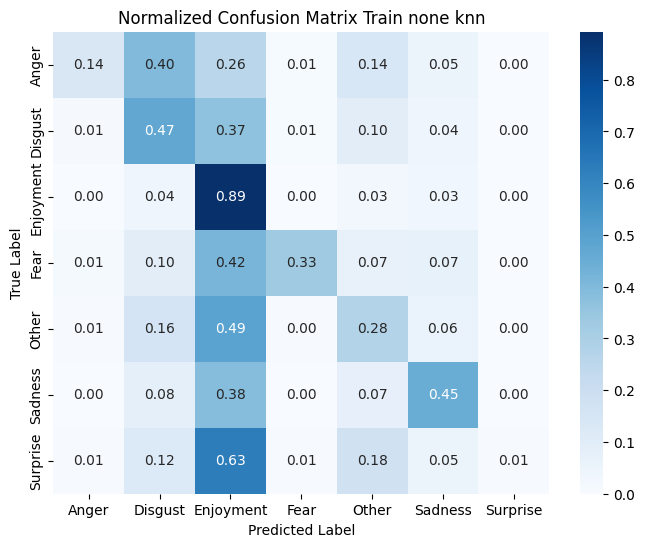

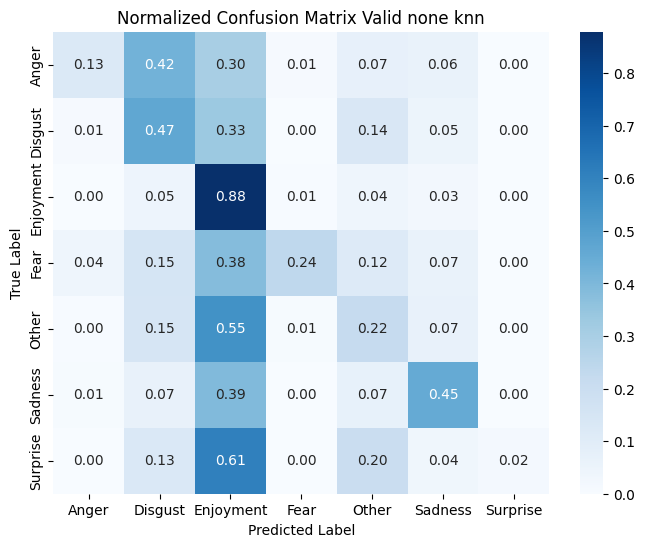

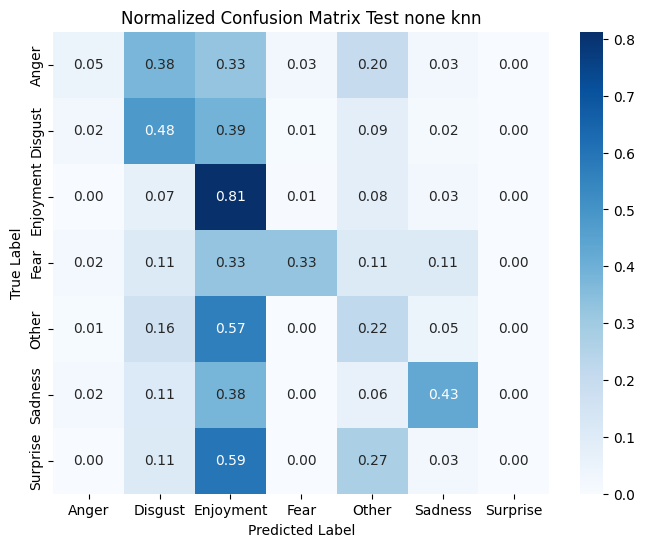

In [79]:
model_64_knn, train_64_knn, valid_64_knn, test_64_knn, pred_64_knn = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="knn"
)

y_train_64_knn, y_valid_64_knn, y_test_64_knn = train_64_knn[1], valid_64_knn[1], test_64_knn[1]
y_pred_train_64_knn, y_pred_valid_64_knn, y_pred_test_64_knn = pred_64_knn

pipeline_evaluation(
    y_train_64_knn, y_valid_64_knn, y_test_64_knn,
    y_pred_train_64_knn, y_pred_valid_64_knn, y_pred_test_64_knn,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu PCA

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.4998651927743327
Recall: 0.4998651927743327
Precision: 0.5241434972496788
F1-score: 0.46002629488572794

--- valid --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.47089733225545677
Recall: 0.47089733225545677
Precision: 0.49110427221613046
F1-score: 0.4270527617785097

--- test --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.45930232558139533
Recall: 0.45930232558139533
Precision: 0.4658534626075574
F1-score: 0.42325097274753126


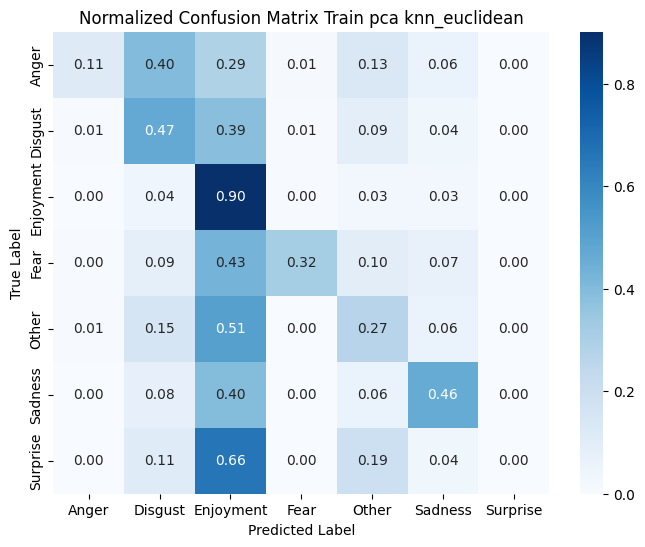

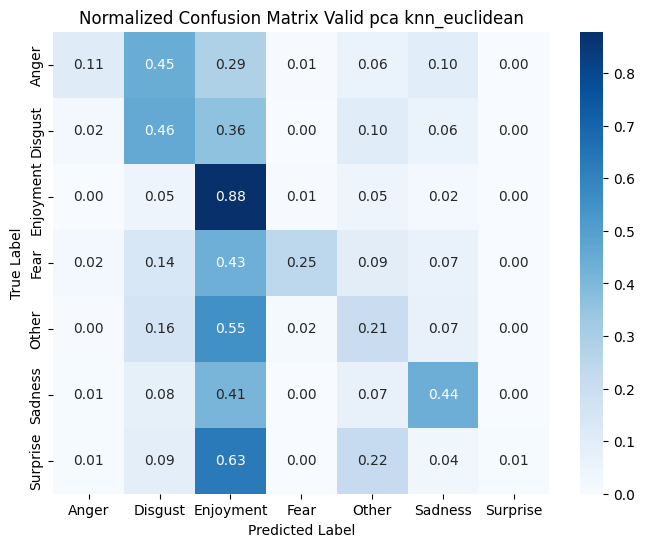

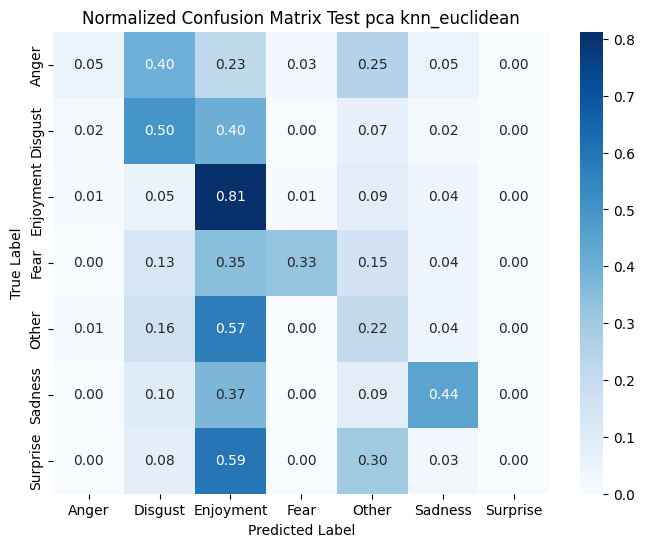

In [80]:
# KNN - euclidean - PCA (6:4)
model_pca_64_knn_euclidean, train_pca_64_knn_euclidean, valid_pca_64_knn_euclidean, test_pca_64_knn_euclidean, pred_pca_64_knn_euclidean = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_64_knn_euclidean, y_valid_pca_64_knn_euclidean, y_test_pca_64_knn_euclidean = train_pca_64_knn_euclidean[1], valid_pca_64_knn_euclidean[1], test_pca_64_knn_euclidean[1]
y_pred_train_pca_64_knn_euclidean, y_pred_valid_pca_64_knn_euclidean, y_pred_test_pca_64_knn_euclidean = pred_pca_64_knn_euclidean

pipeline_evaluation(
    y_train_pca_64_knn_euclidean, y_valid_pca_64_knn_euclidean, y_test_pca_64_knn_euclidean,
    y_pred_train_pca_64_knn_euclidean, y_pred_valid_pca_64_knn_euclidean, y_pred_test_pca_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- knn --- pca ---
Accuracy: 0.5014828794823403
Recall: 0.5014828794823403
Precision: 0.5618243369803415
F1-score: 0.465872645212344

--- valid --- 6:4 --- knn --- pca ---
Accuracy: 0.478981406628941
Recall: 0.478981406628941
Precision: 0.5096523473536134
F1-score: 0.43894851062108065

--- test --- 6:4 --- knn --- pca ---
Accuracy: 0.46656976744186046
Recall: 0.46656976744186046
Precision: 0.45789885407557124
F1-score: 0.4286017719381763


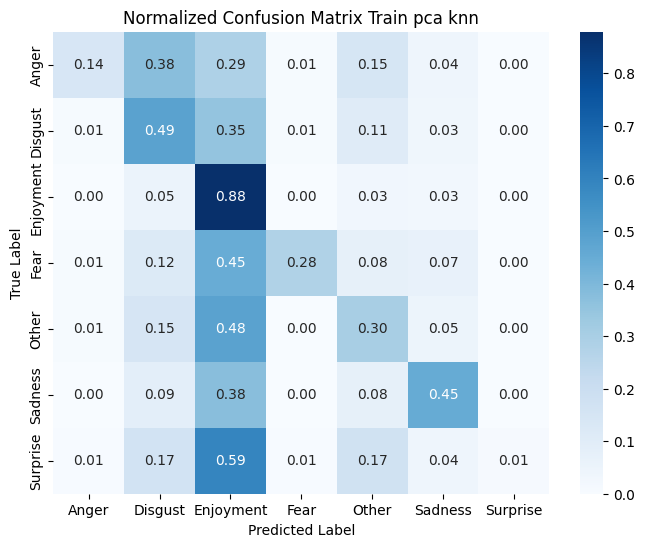

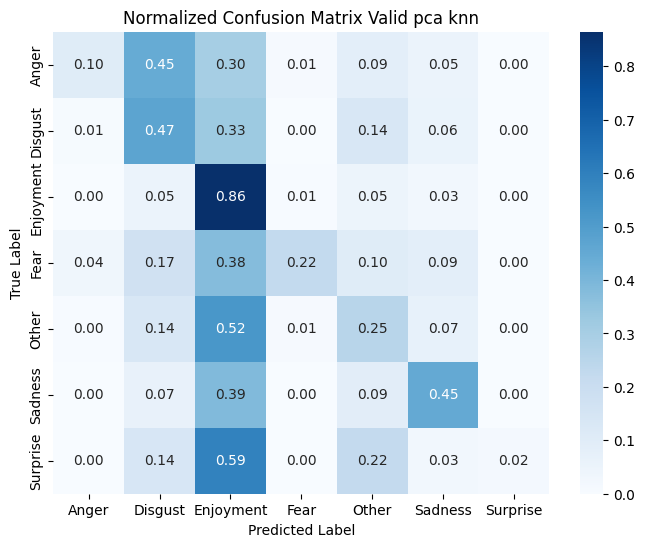

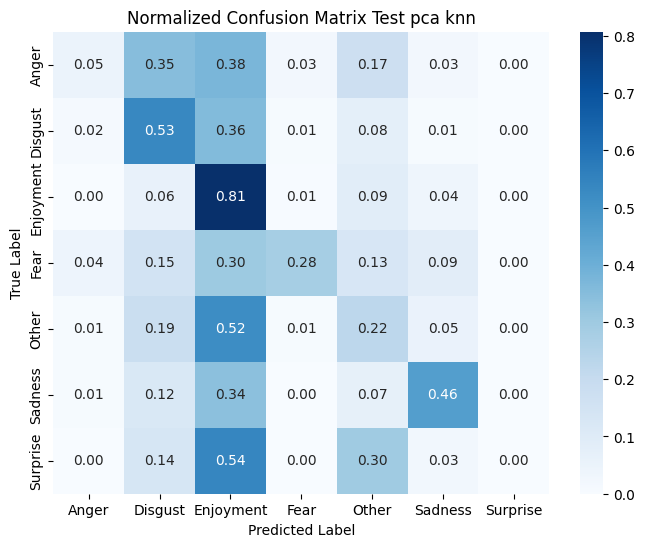

In [81]:

model_pca_64_knn, train_pca_64_knn, valid_pca_64_knn, test_pca_64_knn, pred_pca_64_knn = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="knn",
    max_iter=1000
)

y_train_pca_64_knn, y_valid_pca_64_knn, y_test_pca_64_knn = train_pca_64_knn[1], valid_pca_64_knn[1], test_pca_64_knn[1]
y_pred_train_pca_64_knn, y_pred_valid_pca_64_knn, y_pred_test_pca_64_knn = pred_pca_64_knn

pipeline_evaluation(
    y_train_pca_64_knn, y_valid_pca_64_knn, y_test_pca_64_knn,
    y_pred_train_pca_64_knn, y_pred_valid_pca_64_knn, y_pred_test_pca_64_knn,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.9994607710973308
Recall: 0.9994607710973308
Precision: 0.999461208073751
F1-score: 0.9994605555933478

--- valid --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.31325788197251414
Recall: 0.31325788197251414
Precision: 0.36295822578410053
F1-score: 0.3279027698431055

--- test --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.27325581395348836
Recall: 0.27325581395348836
Precision: 0.3254664682082238
F1-score: 0.2892524791331205


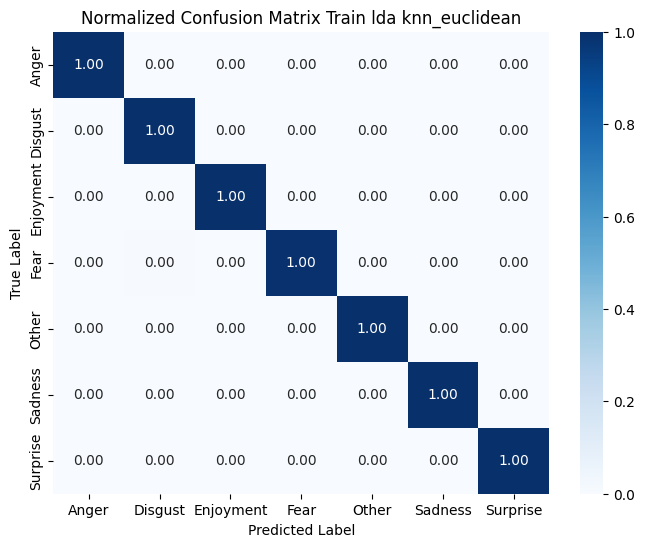

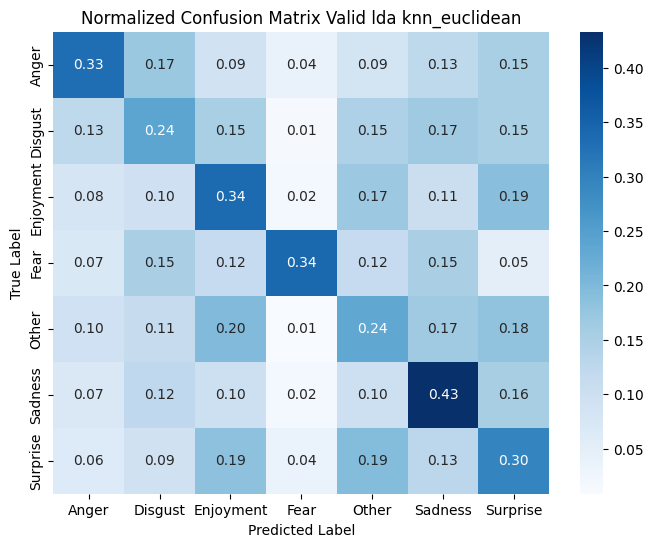

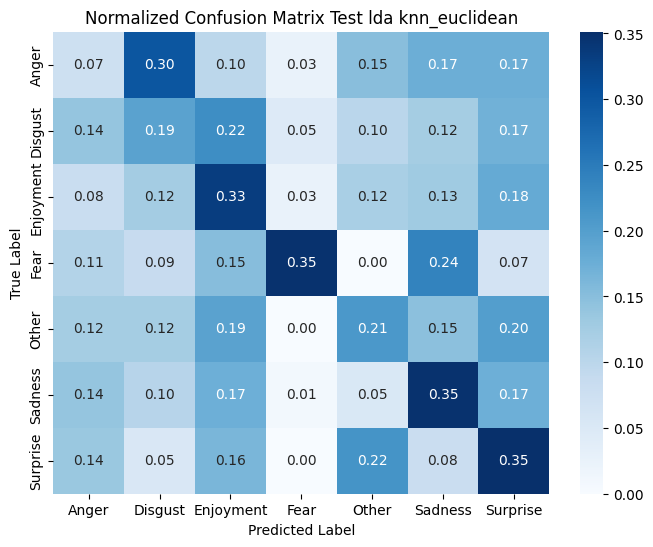

In [82]:
# KNN - euclidean - LDA (6:4)
model_lda_64_knn_euclidean, train_lda_64_knn_euclidean, valid_lda_64_knn_euclidean, test_lda_64_knn_euclidean, pred_lda_64_knn_euclidean = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_64_knn_euclidean, y_valid_lda_64_knn_euclidean, y_test_lda_64_knn_euclidean = train_lda_64_knn_euclidean[1], valid_lda_64_knn_euclidean[1], test_lda_64_knn_euclidean[1]
y_pred_train_lda_64_knn_euclidean, y_pred_valid_lda_64_knn_euclidean, y_pred_test_lda_64_knn_euclidean = pred_lda_64_knn_euclidean

pipeline_evaluation(
    y_train_lda_64_knn_euclidean, y_valid_lda_64_knn_euclidean, y_test_lda_64_knn_euclidean,
    y_pred_train_lda_64_knn_euclidean, y_pred_valid_lda_64_knn_euclidean, y_pred_test_lda_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 6:4 --- knn --- lda ---
Accuracy: 0.9989215421946617
Recall: 0.9989215421946617
Precision: 0.9989232789581891
F1-score: 0.9989215321783558

--- valid --- 6:4 --- knn --- lda ---
Accuracy: 0.3055780113177041
Recall: 0.3055780113177041
Precision: 0.3690061278882242
F1-score: 0.3120898207040386

--- test --- 6:4 --- knn --- lda ---
Accuracy: 0.28488372093023256
Recall: 0.28488372093023256
Precision: 0.3505396038819354
F1-score: 0.29897476591352895


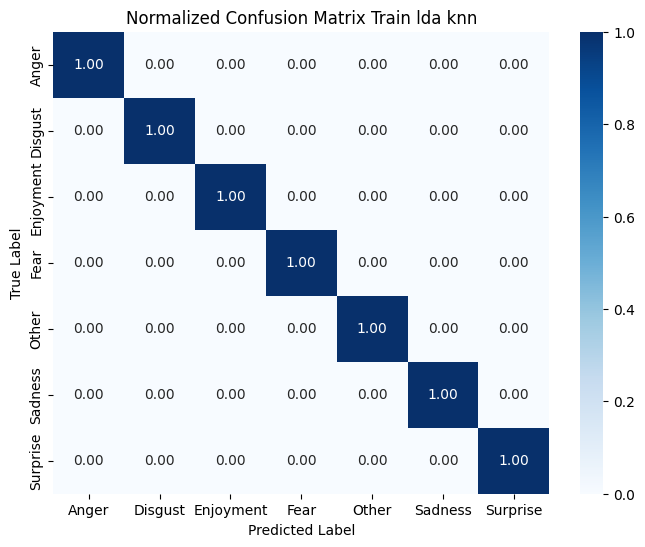

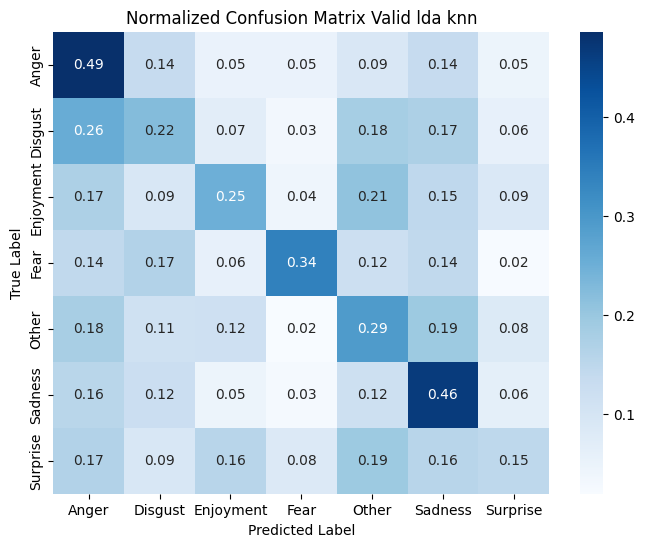

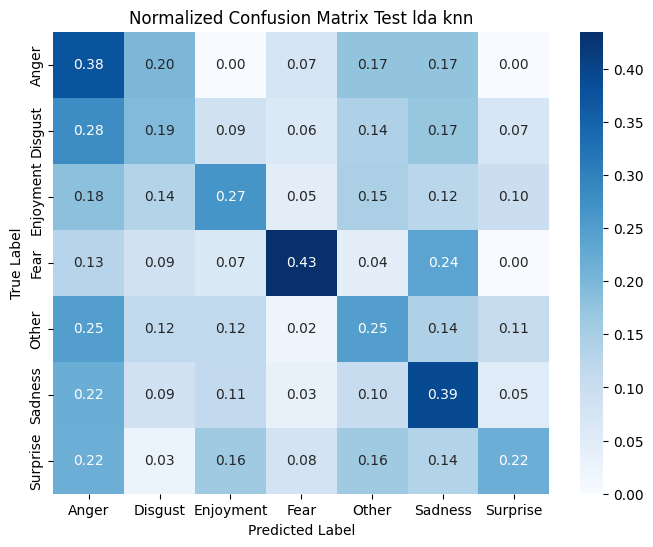

In [83]:

model_lda_64_knn, train_lda_64_knn, valid_lda_64_knn, test_lda_64_knn, pred_lda_64_knn = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="knn",
    max_iter=1000
)

y_train_lda_64_knn, y_valid_lda_64_knn, y_test_lda_64_knn = train_lda_64_knn[1], valid_lda_64_knn[1], test_lda_64_knn[1]
y_pred_train_lda_64_knn, y_pred_valid_lda_64_knn, y_pred_test_lda_64_knn = pred_lda_64_knn

pipeline_evaluation(
    y_train_lda_64_knn, y_valid_lda_64_knn, y_test_lda_64_knn,
    y_pred_train_lda_64_knn, y_pred_valid_lda_64_knn, y_pred_test_lda_64_knn,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu gốc

--- train --- 6:4 --- svm_linear --- none ---
Accuracy: 0.9698031814505258
Recall: 0.9698031814505258
Precision: 0.9702456005878954
F1-score: 0.9698239600816555

--- valid --- 6:4 --- svm_linear --- none ---
Accuracy: 0.5432497978981407
Recall: 0.5432497978981407
Precision: 0.5438128790908427
F1-score: 0.5423703443891024

--- test --- 6:4 --- svm_linear --- none ---
Accuracy: 0.5479651162790697
Recall: 0.5479651162790697
Precision: 0.5502956564232574
F1-score: 0.5479069634021516


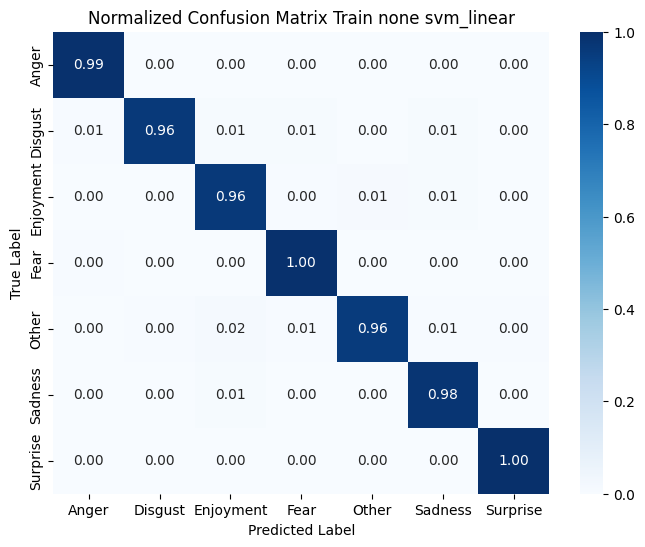

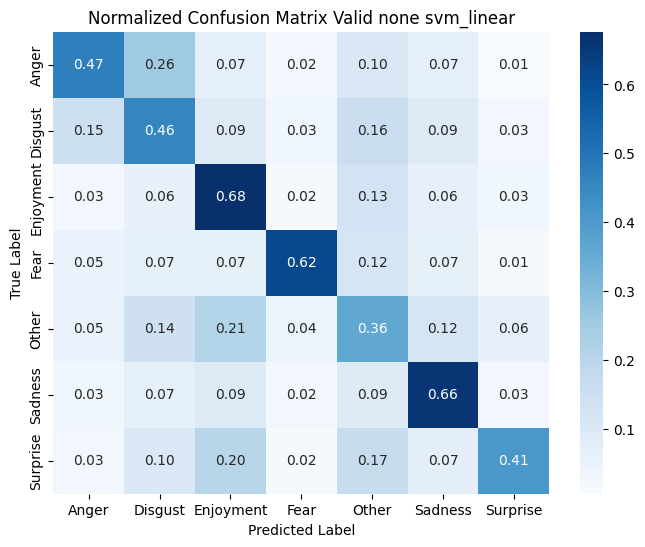

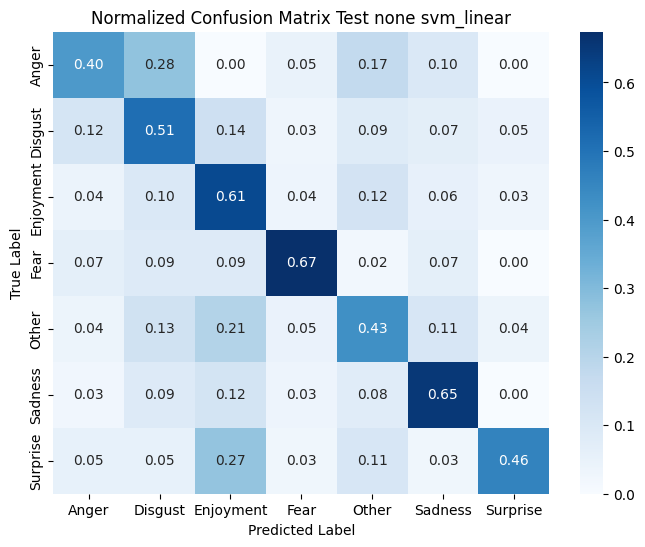

In [84]:
# SVM - linear - None (6:4)
model_64_svm_linear, train_64_svm_linear, valid_64_svm_linear, test_64_svm_linear, pred_64_svm_linear = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_64_svm_linear, y_valid_64_svm_linear, y_test_64_svm_linear = train_64_svm_linear[1], valid_64_svm_linear[1], test_64_svm_linear[1]
y_pred_train_64_svm_linear, y_pred_valid_64_svm_linear, y_pred_test_64_svm_linear = pred_64_svm_linear

pipeline_evaluation(
    y_train_64_svm_linear, y_valid_64_svm_linear, y_test_64_svm_linear,
    y_pred_train_64_svm_linear, y_pred_valid_64_svm_linear, y_pred_test_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_poly --- none ---
Accuracy: 0.9951469398759774
Recall: 0.9951469398759774
Precision: 0.9951617821284426
F1-score: 0.9951463727280614

--- valid --- 6:4 --- svm_poly --- none ---
Accuracy: 0.4890864995957963
Recall: 0.4890864995957963
Precision: 0.5737264704726278
F1-score: 0.4874232466339641

--- test --- 6:4 --- svm_poly --- none ---
Accuracy: 0.4796511627906977
Recall: 0.4796511627906977
Precision: 0.5635816262515705
F1-score: 0.4757613455957822


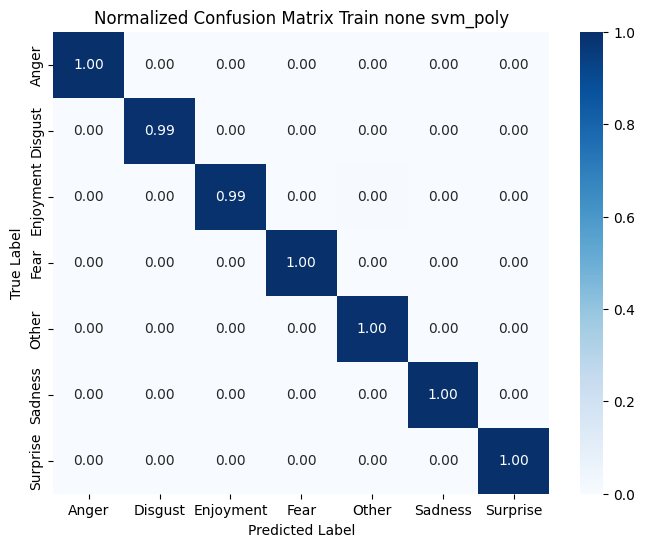

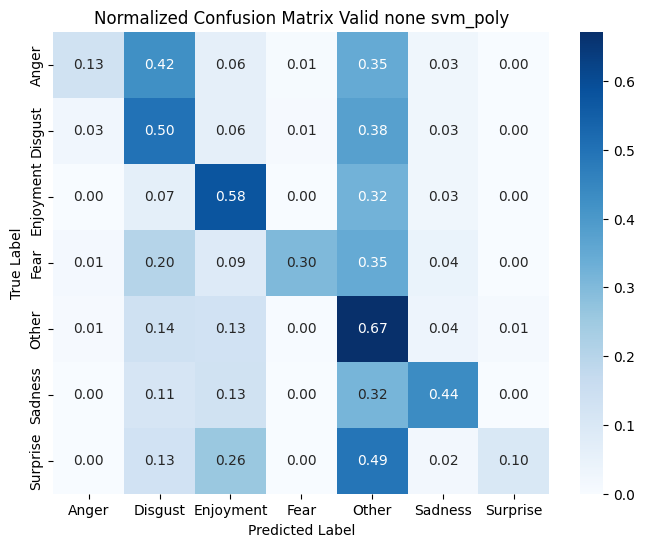

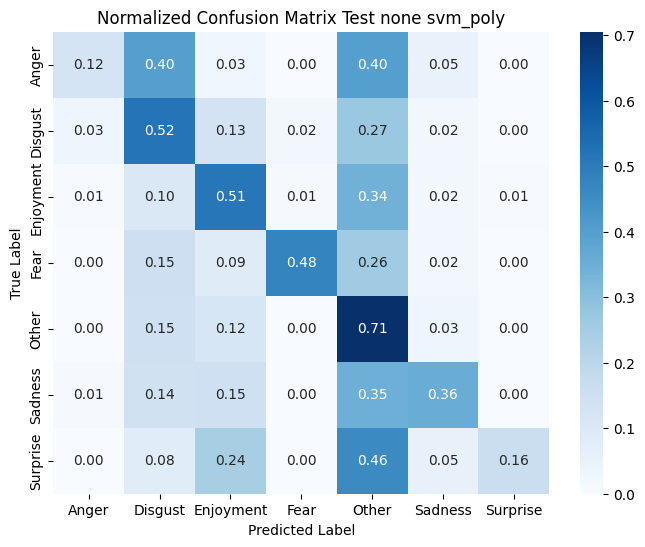

In [85]:
# SVM - poly - None (6:4)
model_64_svm_poly, train_64_svm_poly, valid_64_svm_poly, test_64_svm_poly, pred_64_svm_poly = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly = train_64_svm_poly[1], valid_64_svm_poly[1], test_64_svm_poly[1]
y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly = pred_64_svm_poly

pipeline_evaluation(
    y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly,
    y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.9746562415745484
Recall: 0.9746562415745484
Precision: 0.9753964062541222
F1-score: 0.9746371900200829

--- valid --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.5254648342764754
Recall: 0.5254648342764754
Precision: 0.5820703350909697
F1-score: 0.5309776533509514

--- test --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.5188953488372093
Recall: 0.5188953488372093
Precision: 0.5834292770200522
F1-score: 0.5225602782332937


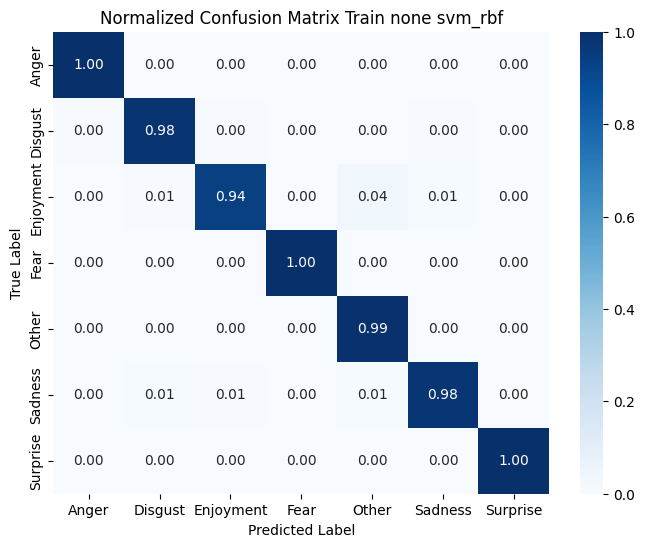

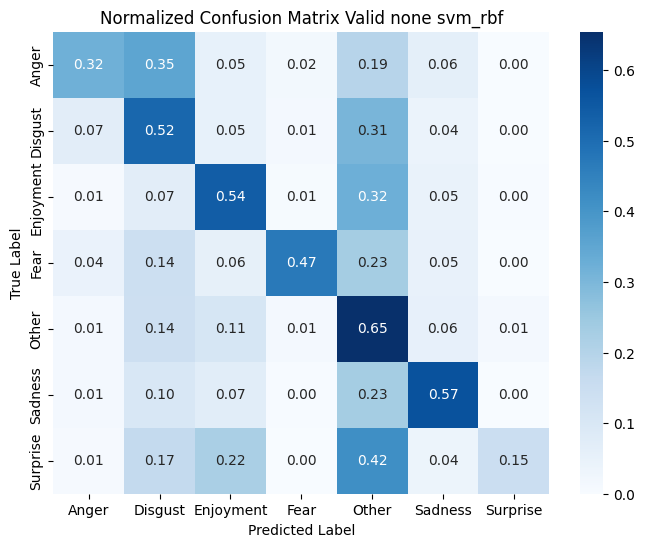

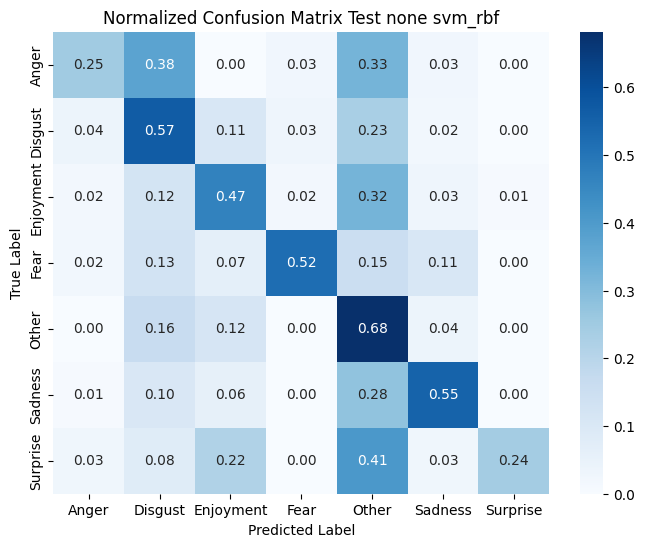

In [86]:
# SVM - rbf - None (6:4)
model_64_svm_rbf, train_64_svm_rbf, valid_64_svm_rbf, test_64_svm_rbf, pred_64_svm_rbf = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_64_svm_rbf, y_valid_64_svm_rbf, y_test_64_svm_rbf = train_64_svm_rbf[1], valid_64_svm_rbf[1], test_64_svm_rbf[1]
y_pred_train_64_svm_rbf, y_pred_valid_64_svm_rbf, y_pred_test_64_svm_rbf = pred_64_svm_rbf

pipeline_evaluation(
    y_train_64_svm_rbf, y_valid_64_svm_rbf, y_test_64_svm_rbf,
    y_pred_train_64_svm_rbf, y_pred_valid_64_svm_rbf, y_pred_test_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.9083310865462388
Recall: 0.9083310865462388
Precision: 0.9105284976944726
F1-score: 0.9081654617197177

--- valid --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.5557801131770412
Recall: 0.5557801131770412
Precision: 0.5560746352362047
F1-score: 0.5544036841921057

--- test --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.5465116279069767
Recall: 0.5465116279069767
Precision: 0.5510715234659262
F1-score: 0.5459766573692456


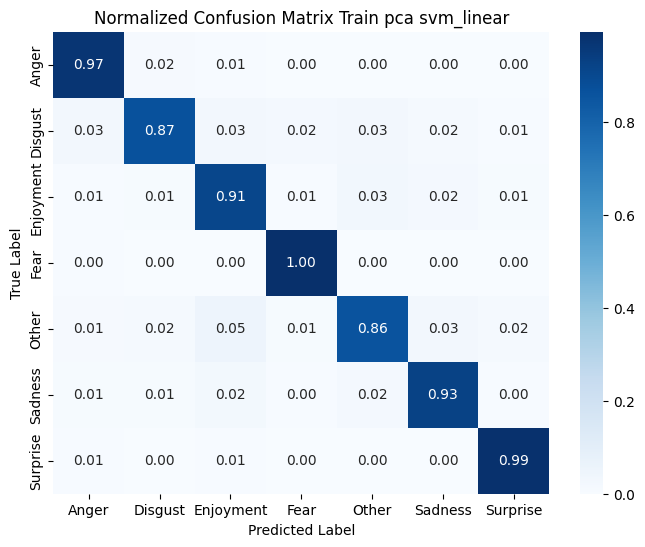

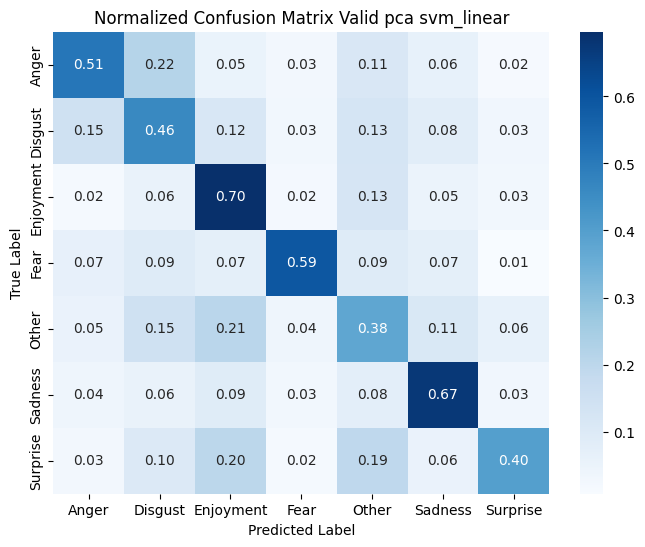

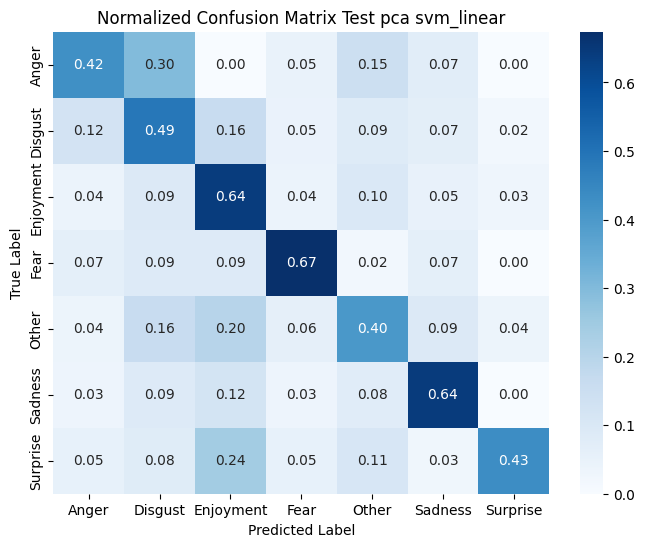

In [87]:
# SVM - linear - PCA (6:4)
model_pca_64_svm_linear, train_pca_64_svm_linear, valid_pca_64_svm_linear, test_pca_64_svm_linear, pred_pca_64_svm_linear = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_64_svm_linear, y_valid_pca_64_svm_linear, y_test_pca_64_svm_linear = train_pca_64_svm_linear[1], valid_pca_64_svm_linear[1], test_pca_64_svm_linear[1]
y_pred_train_pca_64_svm_linear, y_pred_valid_pca_64_svm_linear, y_pred_test_pca_64_svm_linear = pred_pca_64_svm_linear

pipeline_evaluation(
    y_train_pca_64_svm_linear, y_valid_pca_64_svm_linear, y_test_pca_64_svm_linear,
    y_pred_train_pca_64_svm_linear, y_pred_valid_pca_64_svm_linear, y_pred_test_pca_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.9919115664599623
Recall: 0.9919115664599623
Precision: 0.9919644251988199
F1-score: 0.9919089142316477

--- valid --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.46402586903799514
Recall: 0.46402586903799514
Precision: 0.5753951806644461
F1-score: 0.4673944868893348

--- test --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.4563953488372093
Recall: 0.4563953488372093
Precision: 0.5791563344014907
F1-score: 0.45890465334400804


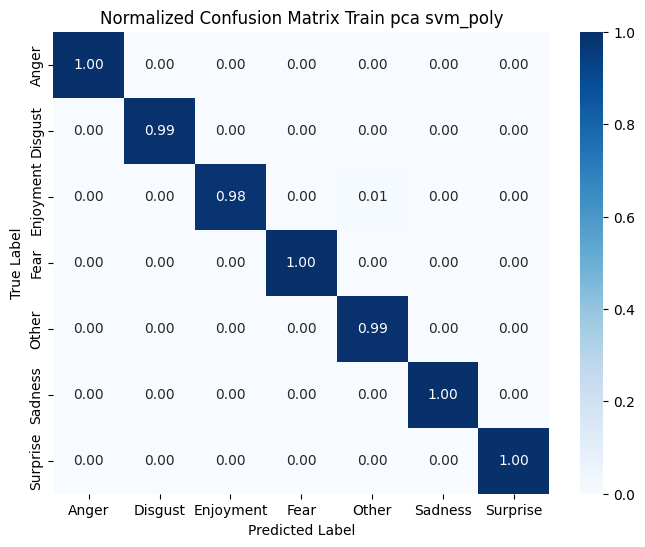

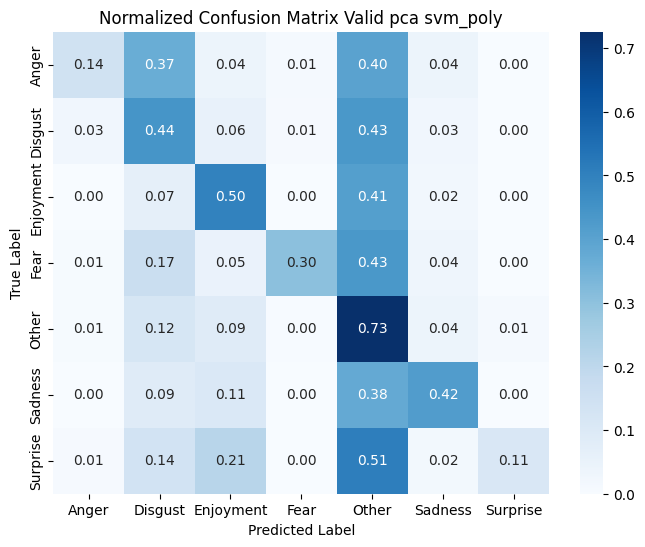

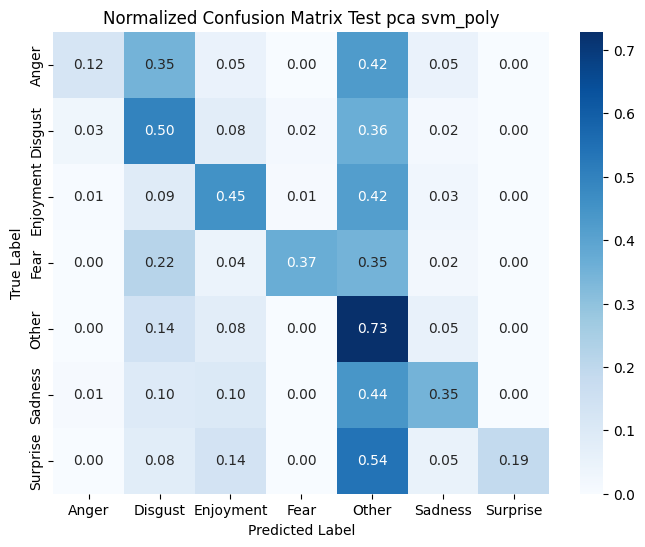

In [88]:
# SVM - poly - PCA (6:4)
model_pca_64_svm_poly, train_pca_64_svm_poly, valid_pca_64_svm_poly, test_pca_64_svm_poly, pred_pca_64_svm_poly = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly = train_pca_64_svm_poly[1], valid_pca_64_svm_poly[1], test_pca_64_svm_poly[1]
y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly = pred_pca_64_svm_poly

pipeline_evaluation(
    y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly,
    y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.9511997843084389
Recall: 0.9511997843084389
Precision: 0.9534873716221328
F1-score: 0.95122019712516

--- valid --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.5286984640258691
Recall: 0.5286984640258691
Precision: 0.5591520613463579
F1-score: 0.5332960174434885

--- test --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.5261627906976745
Recall: 0.5261627906976745
Precision: 0.5566265190306434
F1-score: 0.5295277110284073


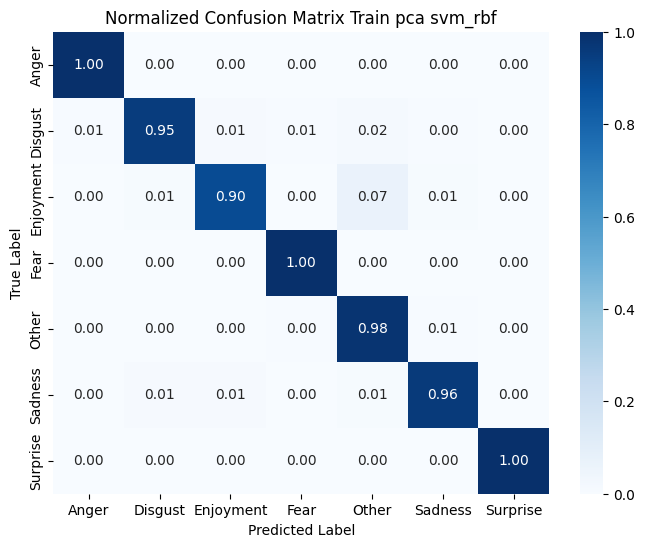

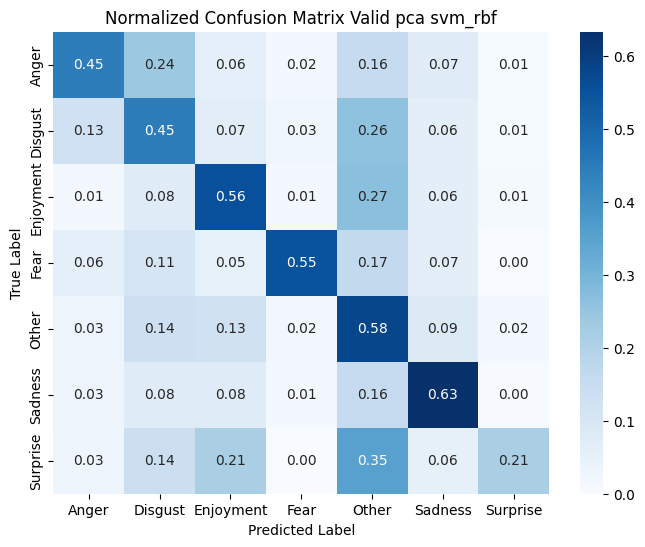

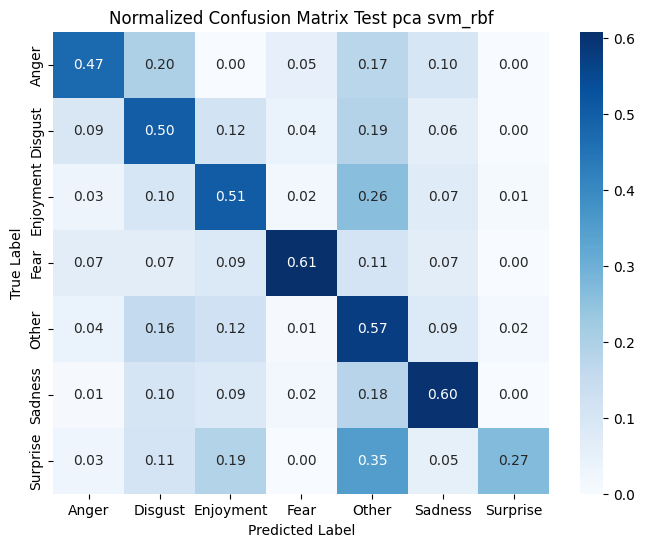

In [89]:
# SVM - rbf - PCA (6:4)
model_pca_64_svm_rbf, train_pca_64_svm_rbf, valid_pca_64_svm_rbf, test_pca_64_svm_rbf, pred_pca_64_svm_rbf = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_64_svm_rbf, y_valid_pca_64_svm_rbf, y_test_pca_64_svm_rbf = train_pca_64_svm_rbf[1], valid_pca_64_svm_rbf[1], test_pca_64_svm_rbf[1]
y_pred_train_pca_64_svm_rbf, y_pred_valid_pca_64_svm_rbf, y_pred_test_pca_64_svm_rbf = pred_pca_64_svm_rbf

pipeline_evaluation(
    y_train_pca_64_svm_rbf, y_valid_pca_64_svm_rbf, y_test_pca_64_svm_rbf,
    y_pred_train_pca_64_svm_rbf, y_pred_valid_pca_64_svm_rbf, y_pred_test_pca_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu LDA

--- train --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.9991911566459962
Recall: 0.9991911566459962
Precision: 0.9991932710208
F1-score: 0.9991912444576949

--- valid --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.3286176232821342
Recall: 0.3286176232821342
Precision: 0.3719524582884563
F1-score: 0.3372076734597943

--- test --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.33430232558139533
Recall: 0.33430232558139533
Precision: 0.3616932194538224
F1-score: 0.3323136700621603


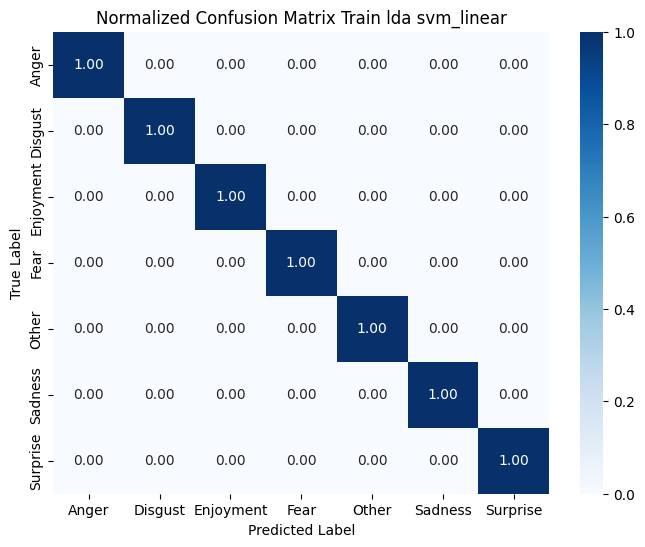

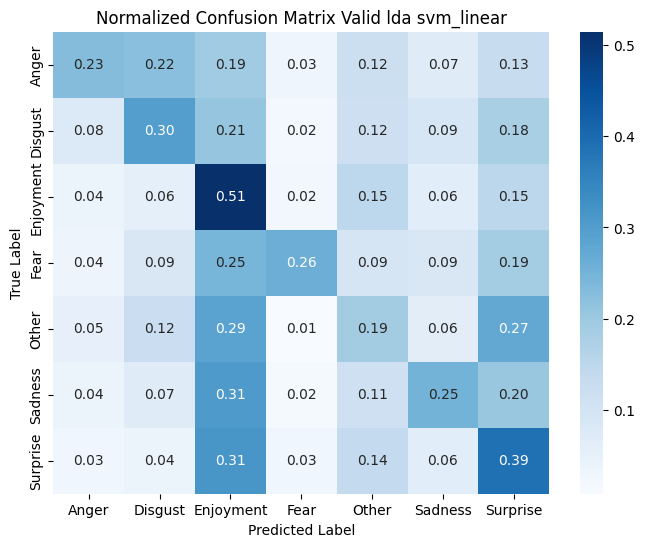

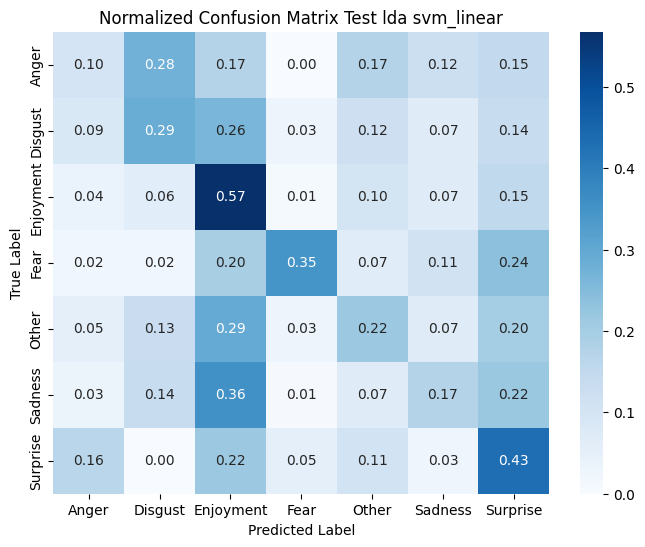

In [90]:
# SVM - linear - LDA (6:4)
model_lda_64_svm_linear, train_lda_64_svm_linear, valid_lda_64_svm_linear, test_lda_64_svm_linear, pred_lda_64_svm_linear = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_64_svm_linear, y_valid_lda_64_svm_linear, y_test_lda_64_svm_linear = train_lda_64_svm_linear[1], valid_lda_64_svm_linear[1], test_lda_64_svm_linear[1]
y_pred_train_lda_64_svm_linear, y_pred_valid_lda_64_svm_linear, y_pred_test_lda_64_svm_linear = pred_lda_64_svm_linear

pipeline_evaluation(
    y_train_lda_64_svm_linear, y_valid_lda_64_svm_linear, y_test_lda_64_svm_linear,
    y_pred_train_lda_64_svm_linear, y_pred_valid_lda_64_svm_linear, y_pred_test_lda_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.998651927743327
Recall: 0.998651927743327
Precision: 0.9986618832738862
F1-score: 0.998653640548772

--- valid --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.21705739692805173
Recall: 0.21705739692805173
Precision: 0.302200555205298
F1-score: 0.2364302086754157

--- test --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.18459302325581395
Recall: 0.18459302325581395
Precision: 0.2573560107171588
F1-score: 0.2018401672939419


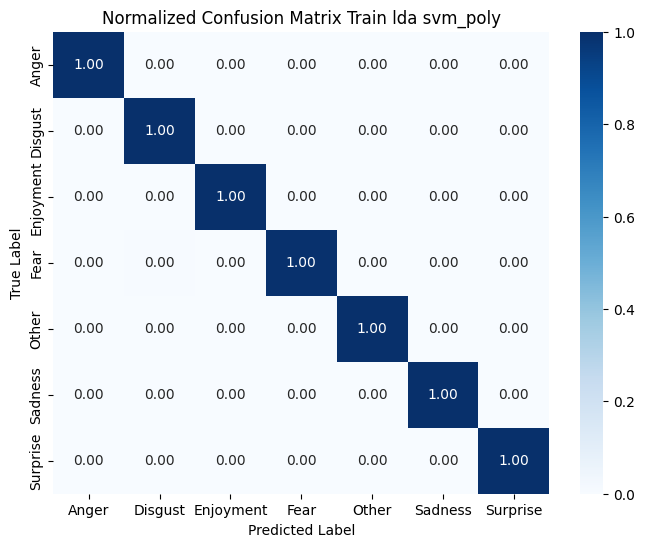

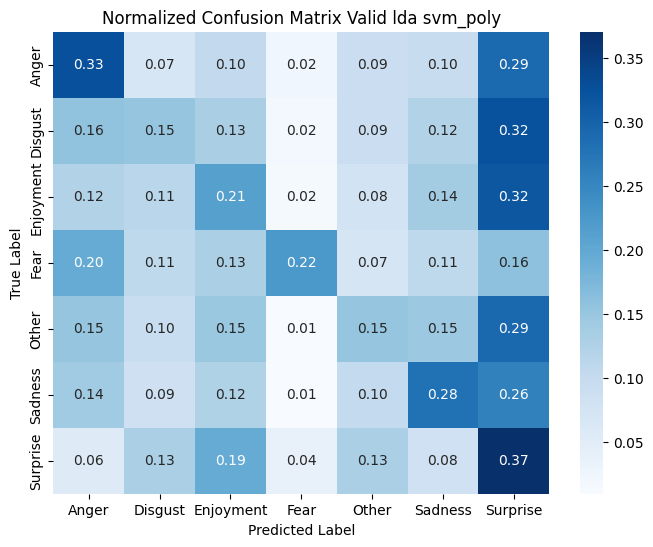

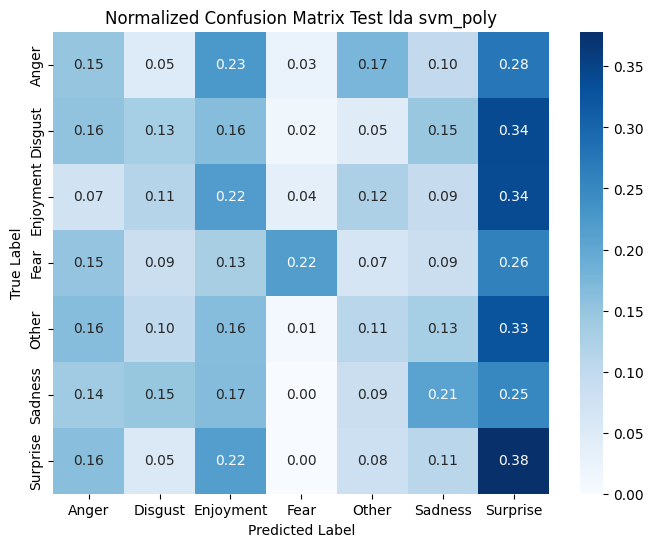

In [91]:
# SVM - poly - LDA (6:4)
model_lda_64_svm_poly, train_lda_64_svm_poly, valid_lda_64_svm_poly, test_lda_64_svm_poly, pred_lda_64_svm_poly = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly = train_lda_64_svm_poly[1], valid_lda_64_svm_poly[1], test_lda_64_svm_poly[1]
y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly = pred_lda_64_svm_poly

pipeline_evaluation(
    y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly,
    y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.9994607710973308
Recall: 0.9994607710973308
Precision: 0.999462061118629
F1-score: 0.9994609848657118

--- valid --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.28617623282134197
Recall: 0.28617623282134197
Precision: 0.3669520679298279
F1-score: 0.13050563051011652

--- test --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.2819767441860465
Recall: 0.2819767441860465
Precision: 0.31211861821140413
F1-score: 0.1277803351413722


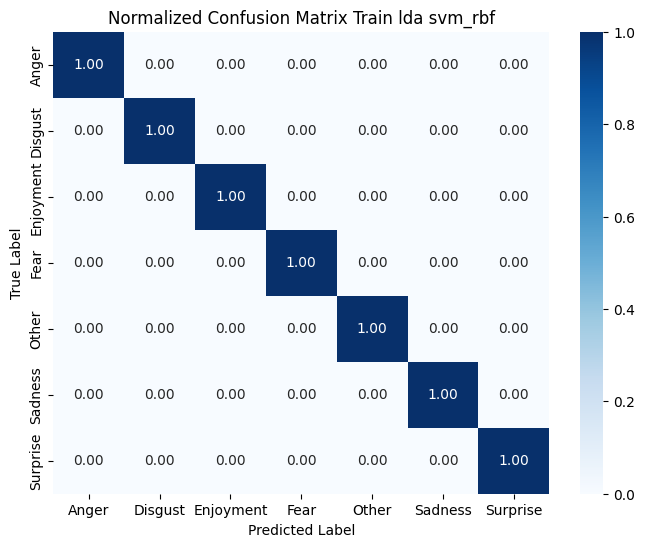

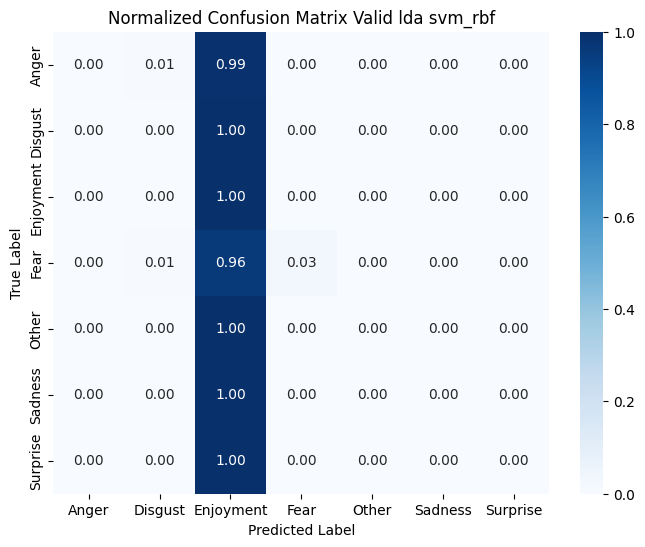

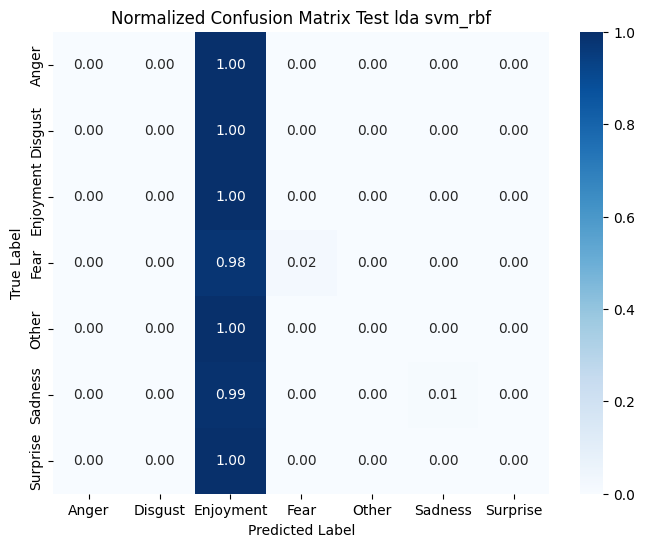

In [92]:
# SVM - rbf - LDA (6:4)
model_lda_64_svm_rbf, train_lda_64_svm_rbf, valid_lda_64_svm_rbf, test_lda_64_svm_rbf, pred_lda_64_svm_rbf = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_64_svm_rbf, y_valid_lda_64_svm_rbf, y_test_lda_64_svm_rbf = train_lda_64_svm_rbf[1], valid_lda_64_svm_rbf[1], test_lda_64_svm_rbf[1]
y_pred_train_lda_64_svm_rbf, y_pred_valid_lda_64_svm_rbf, y_pred_test_lda_64_svm_rbf = pred_lda_64_svm_rbf

pipeline_evaluation(
    y_train_lda_64_svm_rbf, y_valid_lda_64_svm_rbf, y_test_lda_64_svm_rbf,
    y_pred_train_lda_64_svm_rbf, y_pred_valid_lda_64_svm_rbf, y_pred_test_lda_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Tổng hợp kết quả các mô hình phân loại

In [126]:
# Tổng hợp kết quả từ các cell output đã chạy
import pandas as pd
import re
import json
import matplotlib.pyplot as plt
import seaborn as sns

def extract_results_from_notebook(notebook_path=None):
    """Trích xuất kết quả từ notebook JSON"""
    import os
    
    # Tự động tìm file notebook hiện tại
    if notebook_path is None:
        # Thử các đường dẫn có thể
        possible_paths = [
            'modeling_hus_fb copy.ipynb',
            'src/modeling_hus_fb copy.ipynb',
            '../src/modeling_hus_fb copy.ipynb',
            os.path.abspath(__file__.replace('.py', '.ipynb')) if '__file__' in globals() else None
        ]
        
        for path in possible_paths:
            if path and os.path.exists(path):
                notebook_path = path
                break
        
        if notebook_path is None:
            raise FileNotFoundError("Không tìm thấy file notebook. Vui lòng chỉ định đường dẫn.")
    
    results = []
    
    with open(notebook_path, 'r', encoding='utf-8') as f:
        notebook = json.load(f)
    
    # Pattern để parse output - lấy kết quả từ cả train, valid và test
    pattern = r'--- (train|valid|test) --- (\d+):(\d+) --- ([^-]+) --- ([^-]+) ---\s+Accuracy: ([\d.]+)\s+Recall: ([\d.]+)\s+Precision: ([\d.]+)\s+F1-score: ([\d.]+)'
    
    for cell in notebook['cells']:
        if 'outputs' in cell:
            for output in cell['outputs']:
                if 'text' in output:
                    text = ''.join(output['text'])
                    
                    # Tìm tất cả các kết quả trong output
                    matches = re.findall(pattern, text)
                    
                    for match in matches:
                        dataset, train_size, valid_size, model_type, discriminant, acc, recall, prec, f1 = match
                        
                        results.append({
                            'Dataset': dataset.strip().upper(),  # TRAIN, VALID, hoặc TEST
                            'Model': model_type.strip(),
                            'Train:Valid': f'{train_size}:{valid_size}',
                            'Discriminant': discriminant.strip().upper(),
                            'Accuracy': float(acc),
                            'Precision': float(prec),
                            'Recall': float(recall),
                            'F1-Score': float(f1)
                        })
    
    return pd.DataFrame(results)

# Trích xuất và tổng hợp
try:
    results_df = extract_results_from_notebook()
    
    # Loại bỏ duplicate (nếu có)
    results_df = results_df.drop_duplicates(subset=['Dataset', 'Model', 'Train:Valid', 'Discriminant']).reset_index(drop=True)
    
    # Sắp xếp: Dataset (TEST > VALID > TRAIN), sau đó F1-Score giảm dần
    dataset_order = {'TEST': 0, 'VALID': 1, 'TRAIN': 2}
    results_df['Dataset_Order'] = results_df['Dataset'].map(dataset_order)
    results_df = results_df.sort_values(['Dataset_Order', 'F1-Score'], ascending=[True, False]).reset_index(drop=True)
    results_df = results_df.drop('Dataset_Order', axis=1)
    
    print("=" * 120)
    print("TỔNG HỢP KẾT QUẢ CÁC MÔ HÌNH PHÂN LOẠI (TRAIN - VALID - TEST)")
    print("=" * 120)
    print()
    
    # Hiển thị bảng đầy đủ
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', None)
    pd.set_option('display.max_colwidth', None)
    print(results_df.to_string(index=False))
    
    print()
    print("=" * 120)
    print(f"Tổng số kết quả: {len(results_df)}")
    
    # Thống kê theo từng dataset
    for dataset in ['TRAIN', 'VALID', 'TEST']:
        df_dataset = results_df[results_df['Dataset'] == dataset]
        if len(df_dataset) > 0:
            best = df_dataset.iloc[0]
            print(f"\n{dataset} SET - Mô hình tốt nhất (F1-Score):")
            print(f"  Model: {best['Model']} - {best['Discriminant']} - {best['Train:Valid']}")
            print(f"  F1-Score: {best['F1-Score']:.4f} | Accuracy: {best['Accuracy']:.4f} | Precision: {best['Precision']:.4f} | Recall: {best['Recall']:.4f}")
    
    print("=" * 120)
    
except Exception as e:
    print(f"Lỗi khi đọc notebook: {e}")
    print("Vui lòng đảm bảo các cell đã được chạy và có output.")
    import traceback
    traceback.print_exc()

TỔNG HỢP KẾT QUẢ CÁC MÔ HÌNH PHÂN LOẠI (TRAIN - VALID - TEST)

Dataset               Model Train:Valid Discriminant  Accuracy  Precision   Recall  F1-Score
   TEST          svm_linear         8:2         NONE  0.561047   0.566456 0.561047  0.562202
   TEST          svm_linear         8:2          PCA  0.559593   0.563895 0.559593  0.559632
   TEST          svm_linear         7:3          PCA  0.555233   0.559282 0.555233  0.554535
   TEST          svm_linear         7:3         NONE  0.553779   0.557490 0.553779  0.553940
   TEST logistic_regression         8:2          PCA  0.549419   0.564167 0.549419  0.553359
   TEST logistic_regression         8:2         NONE  0.546512   0.560776 0.546512  0.550461
   TEST          svm_linear         6:4         NONE  0.547965   0.550296 0.547965  0.547907
   TEST          svm_linear         6:4          PCA  0.546512   0.551072 0.546512  0.545977
   TEST logistic_regression         6:4         NONE  0.539244   0.551032 0.539244  0.542647
   TEST

# Xem kết quả dự đoán cho từng nhãn

In [50]:
from sklearn.metrics import classification_report

print(classification_report(y_test_73, y_pred_test_73, digits=4))

              precision    recall  f1-score   support

       Anger     0.3088    0.5250    0.3889        40
     Disgust     0.4812    0.4961    0.4885       129
   Enjoyment     0.6626    0.5625    0.6085       192
        Fear     0.5660    0.6522    0.6061        46
       Other     0.4310    0.3876    0.4082       129
     Sadness     0.6460    0.6348    0.6404       115
    Surprise     0.4762    0.5405    0.5063        37

    accuracy                         0.5320       688
   macro avg     0.5103    0.5427    0.5210       688
weighted avg     0.5453    0.5320    0.5353       688



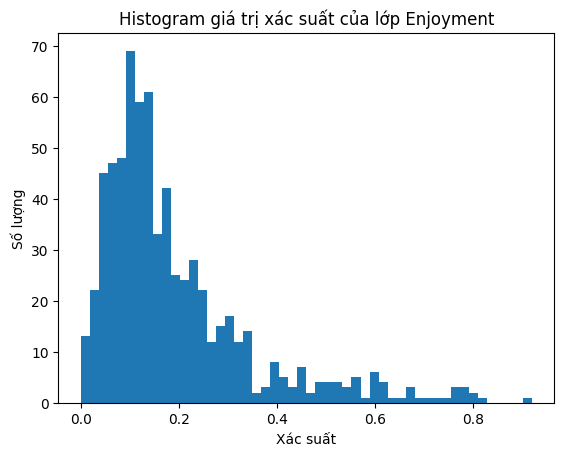

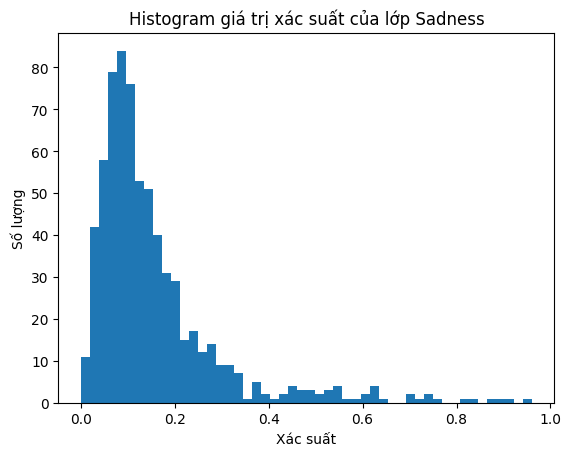

In [95]:
def plot_score_hist(model, X, label_name):
    scores = model.predict_proba(X)       # Trả về giá trị hàm quyết định
    classes = list(model.classes_)       # Các lớp của mô hình 

    # Lấy index của lớp lable_name
    idx = classes.index(label_name)
    
    # Lấy ra cột score của nhãn label_name 
    score = scores[:, idx]  

    plt.figure()
    plt.hist(score, bins=50)
    plt.title(f"Histogram giá trị xác suất của lớp {label_name}")
    plt.xlabel("Xác suất")
    plt.ylabel("Số lượng")
    plt.show()
    
    return score
    
# Chọn 1 mô hình bất kì   
model = model_82         # model logistic regression đã huấn luyện
X_test_processed, y_test = test_82

score_enj = plot_score_hist(model, X_test_processed, "Enjoyment")
score_sad = plot_score_hist(model, X_test_processed, "Sadness")

Nhận xét: 


- Lớp Enjoyment có F1 cao nhất và số lượng nhãn lớn nhất => Ổn định, ít nhiễu hơn và ít giao động khi chia tập DL 

- Dựa vào histogram ta thấy phân bố của lớp Enjoyment khá mượt và trải rộng => có nhiều mức điểm khác nhau cho mô hình ==> phù hợp làm đầu ra hồi quy

- Lớp Sadness cũng là một sự lựa chọn ổn, tuy nhiên phân bố không quá đẹp, không ổn định bằng Enjoyment và F1-Score của 2 lớp này cũng không chênh lệch nhiều

=> Chọn đầu ra hồi quy là giá trị hàm quyết định của lớp Enjoyment

# Chuyển bài toán sang hồi quy


## Các hàm xử lý cho hồi quy

In [96]:
import numpy as np
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.decomposition import PCA


### Hàm lấy softmax probability của lớp Enjoyment


In [97]:
def get_enjoyment_score(model, X_data):

    # Lấy tất cả softmax probabilities cho tất cả các lớp
    probabilities = model.predict_proba(X_data)  # Shape: (n_samples, n_classes)
    
    # Tìm index của lớp Enjoyment
    classes = list(model.classes_)
    idx_enjoyment = classes.index("Enjoyment")
    
    # Lấy cột probability của lớp Enjoyment
    prob_enjoyment = probabilities[:, idx_enjoyment]
    
    return prob_enjoyment


### Hàm đánh giá mô hình hồi quy (MSE, MAE, R2)


In [98]:
def evaluate_regression(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    return {"MSE": mse, "MAE": mae, "R2": r2}


### Hồi quy tuyến tính (L2 regularization)


In [99]:
# alpha: hệ số regularization
def train_ridge(X_train, y_train, alpha=1.0, random_state=11):
    ridge = Ridge(alpha=alpha, random_state=random_state)
    ridge.fit(X_train, y_train)
    return ridge


### KNN


In [100]:
def train_knn_regressor(X_train, y_train, metric='cosine', n_jobs=-1):
    k = int(np.sqrt(len(X_train)))
    knn = KNeighborsRegressor(n_neighbors=k, metric=metric, n_jobs=n_jobs)
    knn.fit(X_train, y_train)
    return knn


### Hàm lựa chọn mô hình hồi quy


Hệ số cho mô hình
- model_type: loại mô hình
- alpha: hệ số regularization 
- metric: metric của KNN (cosine,...)

In [101]:
def use_regression_model(model_type, X_train, y_train, alpha=1.0, metric='cosine'):
    if model_type == "ridge":
        return train_ridge(X_train, y_train, alpha=alpha)
    elif model_type == "knn":
        return train_knn_regressor(X_train, y_train, metric=metric)
    else:
        raise ValueError(f"Unknown model_type: {model_type}. Use 'ridge' or 'knn'")


### Hàm dự đoán hồi quy


In [102]:
def predict_regression(model, X_train, X_valid, X_test):
    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)
    
    return y_pred_train, y_pred_valid, y_pred_test


### Hàm chuẩn bị dữ liệu 

- Input là dữ liệu sau TF-IDF của model lựa chọn (model đã trả về dữ liệu này)
- Lấy softmax probabilities từ model có kết quả phân loại tốt nhất (chọn model_73)
- Áp dụng PCA (1/3, tùy chọn)

In [103]:
def prepare_data_for_regression(classification_model, X_train_valid, X_test, 
                                 y_train_valid, y_test,
                                 train_size=7, valid_size=3,
                                 discriminant="none", n_components_pca=None, random_state=11):

    
    # 1. Lấy giá trị softmax probalilities từ classification_model cho train_valid và test
    z_train_valid = get_enjoyment_score(classification_model, X_train_valid)
    z_test = get_enjoyment_score(classification_model, X_test)
    
    # 2. Chia train_valid
    print(f"Tỉ lệ train - valid {train_size}:{valid_size}")
    X_train_reg, X_valid_reg, z_train_reg, z_valid_reg = train_test_split(
        X_train_valid, z_train_valid,
        test_size=valid_size/(train_size + valid_size),
        random_state=random_state,
        stratify=y_train_valid 
    )
    
    # 3. Giảm chiều (1/3, tùy chọn)
    if discriminant == 'pca':
        if n_components_pca is None:
            n_components_pca = max(1, int(X_train_reg.shape[1] / 3))
        
        print(f'PCA: {X_train_reg.shape[1]} -> {n_components_pca} chiều')
        pca_reducer = PCA(n_components=n_components_pca, random_state=random_state)
        X_train_processed = pca_reducer.fit_transform(X_train_reg)
        X_valid_processed = pca_reducer.transform(X_valid_reg)
        X_test_processed = pca_reducer.transform(X_test)
        
        print(f'PCA explained variance ratio: {pca_reducer.explained_variance_ratio_.sum():.4f}')
        discriminant_model = pca_reducer
    else:
        X_train_processed = X_train_reg
        X_valid_processed = X_valid_reg
        X_test_processed = X_test
        discriminant_model = None
    
    return (X_train_processed, X_valid_processed, X_test_processed,
            z_train_reg, z_valid_reg, z_test,
            discriminant_model)

## Pipeline hồi quy


In [104]:
def pipeline_regression(X_train, X_valid, X_test, z_train, z_valid, z_test,
                        regression_model_type='ridge', alpha=1.0, metric='cosine',
                        random_state=11):

    # Đặt lại tên cho tường minh
    X_reg_train, y_reg_train = X_train, z_train
    X_reg_valid, y_reg_valid = X_valid, z_valid
    X_reg_test, y_reg_test = X_test, z_test

    print(f'Tập hồi quy - Train: {X_reg_train.shape}, Valid: {X_reg_valid.shape}, Test: {X_reg_test.shape}')
    print()

    # Huấn luyện mô hình hồi quy
    regression_model = use_regression_model(regression_model_type, X_reg_train, y_reg_train,
                                            alpha=alpha, metric=metric)

    # Dự đoán
    y_pred_train, y_pred_valid, y_pred_test = predict_regression(
        regression_model, X_reg_train, X_reg_valid, X_reg_test
    )

    # Đánh giá mô hình
    metrics_train = evaluate_regression(y_reg_train, y_pred_train)
    metrics_valid = evaluate_regression(y_reg_valid, y_pred_valid)
    metrics_test = evaluate_regression(y_reg_test, y_pred_test)

    return (regression_model,
            (X_reg_train, X_reg_valid, X_reg_test),
            (y_reg_train, y_reg_valid, y_reg_test),
            (y_pred_train, y_pred_valid, y_pred_test),
            (metrics_train, metrics_valid, metrics_test))


## Hàm đánh giá và hiển thị kết quả


In [105]:
def pipeline_evaluation_regression(metrics_train, metrics_valid, metrics_test,
                                   regression_model_type, discriminant, data_type=""):
    print(f"=== {regression_model_type.upper()} Regression - {discriminant.upper()} {data_type} ===")
    print()
    
    print("--- Train ---")
    print(f"MSE = {metrics_train['MSE']:.6f}")
    print(f"MAE = {metrics_train['MAE']:.6f}")
    print(f"R2  = {metrics_train['R2']:.6f}")
    print()
    
    print("--- Valid ---")
    print(f"MSE = {metrics_valid['MSE']:.6f}")
    print(f"MAE = {metrics_valid['MAE']:.6f}")
    print(f"R2  = {metrics_valid['R2']:.6f}")
    print()
    
    print("--- Test ---")
    print(f"MSE = {metrics_test['MSE']:.6f}")
    print(f"MAE = {metrics_test['MAE']:.6f}")
    print(f"R2  = {metrics_test['R2']:.6f}")
    print()
    print("=" * 80)
    print()


## Tạo bộ dữ liệu hồi quy

In [106]:
import numpy as np

In [107]:
X_train_73_reg = train_73[0]
X_valid_73_reg = valid_73[0]
X_test_reg = test_73[0]
y_train_73_cls = train_73[1]
y_valid_73_cls = valid_73[1]
y_test_cls = test_73[1]

# Gộp train và valid thành train_valid
X_train_valid_reg = np.vstack([X_train_73_reg, X_valid_73_reg])
y_train_valid_reg = np.concatenate([y_train_73_cls, y_valid_73_cls])

print("============== Kích thước ===============")
print(f"train_valid: {X_train_valid_reg.shape}, test: {X_test_reg.shape}")
print(f"labels train_valid: {y_train_valid_reg.shape}, test: {y_test_cls.shape}")

============== Kích thước ===============
train_valid: (6183, 7227), test: (688, 7227)
labels train_valid: (6183,), test: (688,)


## Train:Validation = 8:2

### Hồi quy tuyến tính (Ridge L2)

#### Dữ liệu gốc

In [108]:
X_train_reg_82, X_valid_reg_82, X_test_reg_82, \
z_train_reg_82, z_valid_reg_82, z_test_reg_82, disc_model_reg_82 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=8,
    valid_size=2,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_82_model, X_reg_82, y_reg_82, y_pred_ridge_82, metrics_ridge_82 = pipeline_regression(
    X_train_reg_82, X_valid_reg_82, X_test_reg_82,
    z_train_reg_82, z_valid_reg_82, z_test_reg_82,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_82[0], metrics_ridge_82[1], metrics_ridge_82[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(8:2)"
)

Tỉ lệ train - valid 8:2
Tập hồi quy - Train: (4946, 7227), Valid: (1237, 7227), Test: (688, 7227)

=== RIDGE Regression - NONE (8:2) ===

--- Train ---
MSE = 0.001042
MAE = 0.023819
R2  = 0.956924

--- Valid ---
MSE = 0.002216
MAE = 0.035471
R2  = 0.914155

--- Test ---
MSE = 0.001530
MAE = 0.027794
R2  = 0.933148




#### Dữ liệu PCA

In [109]:
X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82, \
z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82, disc_model_reg_pca_82 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=8,
    valid_size=2,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính = 1/3 rồi nên không cần nữa
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_82_model, X_reg_pca_82, y_reg_pca_82, y_pred_ridge_pca_82, metrics_ridge_pca_82 = pipeline_regression(
    X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82,
    z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_82[0], metrics_ridge_pca_82[1], metrics_ridge_pca_82[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(8:2)"
)

Tỉ lệ train - valid 8:2
PCA: 7227 -> 2409 chiều
PCA explained variance ratio: 0.9218
Tập hồi quy - Train: (4946, 2409), Valid: (1237, 2409), Test: (688, 2409)

=== RIDGE Regression - PCA (8:2) ===

--- Train ---
MSE = 0.001199
MAE = 0.025669
R2  = 0.950451

--- Valid ---
MSE = 0.002317
MAE = 0.036406
R2  = 0.910225

--- Test ---
MSE = 0.001589
MAE = 0.028499
R2  = 0.930592




### KNN

#### Bộ dữ liệu không giảm chiều 

In [110]:
# KNN / None
knn_82_model, X_reg_82_knn, y_reg_82_knn, y_pred_knn_82, metrics_knn_82 = pipeline_regression(
    X_train_reg_82, X_valid_reg_82, X_test_reg_82,
    z_train_reg_82, z_valid_reg_82, z_test_reg_82,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_82[0], metrics_knn_82[1], metrics_knn_82[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(8:2)"
)

Tập hồi quy - Train: (4946, 7227), Valid: (1237, 7227), Test: (688, 7227)

=== KNN Regression - NONE (8:2) ===

--- Train ---
MSE = 0.009673
MAE = 0.076197
R2  = 0.600241

--- Valid ---
MSE = 0.010968
MAE = 0.080562
R2  = 0.575022

--- Test ---
MSE = 0.009147
MAE = 0.069966
R2  = 0.600459




In [111]:
# KNN / PCA
knn_pca_82_model, X_reg_pca_82_knn, y_reg_pca_82_knn, y_pred_knn_pca_82, metrics_knn_pca_82 = pipeline_regression(
    X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82,
    z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_82[0], metrics_knn_pca_82[1], metrics_knn_pca_82[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(8:2)"
)

Tập hồi quy - Train: (4946, 2409), Valid: (1237, 2409), Test: (688, 2409)

=== KNN Regression - PCA (8:2) ===

--- Train ---
MSE = 0.009830
MAE = 0.076745
R2  = 0.593749

--- Valid ---
MSE = 0.010988
MAE = 0.080516
R2  = 0.574247

--- Test ---
MSE = 0.009216
MAE = 0.070154
R2  = 0.597422




## Train:Validation = 7:3

### Ridge Regression

#### Bộ dữ liệu không giảm chiều

In [112]:
# Chuẩn bị dữ liệu
X_train_reg_73, X_valid_reg_73, X_test_reg_73, \
z_train_reg_73, z_valid_reg_73, z_test_reg_73, disc_model_reg_73 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=7,
    valid_size=3,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_73_model, X_reg_73, y_reg_73, y_pred_ridge_73, metrics_ridge_73 = pipeline_regression(
    X_train_reg_73, X_valid_reg_73, X_test_reg_73,
    z_train_reg_73, z_valid_reg_73, z_test_reg_73,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_73[0], metrics_ridge_73[1], metrics_ridge_73[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(7:3)"
)

Tỉ lệ train - valid 7:3
Tập hồi quy - Train: (4328, 7227), Valid: (1855, 7227), Test: (688, 7227)

=== RIDGE Regression - NONE (7:3) ===

--- Train ---
MSE = 0.001097
MAE = 0.024481
R2  = 0.954279

--- Valid ---
MSE = 0.002299
MAE = 0.036213
R2  = 0.910668

--- Test ---
MSE = 0.001640
MAE = 0.028712
R2  = 0.928378




### Bộ dữ liệu PCA

In [113]:
# Chuẩn bị dữ liệu 
X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73, \
z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73, disc_model_reg_pca_73 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=7,
    valid_size=3,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính 1/3 rồi nên không cần nữa 
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_73_model, X_reg_pca_73, y_reg_pca_73, y_pred_ridge_pca_73, metrics_ridge_pca_73 = pipeline_regression(
    X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73,
    z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_73[0], metrics_ridge_pca_73[1], metrics_ridge_pca_73[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(7:3)"
)

Tỉ lệ train - valid 7:3
PCA: 7227 -> 2409 chiều
PCA explained variance ratio: 0.9369
Tập hồi quy - Train: (4328, 2409), Valid: (1855, 2409), Test: (688, 2409)

=== RIDGE Regression - PCA (7:3) ===

--- Train ---
MSE = 0.001232
MAE = 0.026055
R2  = 0.948644

--- Valid ---
MSE = 0.002400
MAE = 0.037080
R2  = 0.906746

--- Test ---
MSE = 0.001668
MAE = 0.029141
R2  = 0.927159




### KNN

#### Bộ dữ liệu không giảm chiều

In [114]:
# KNN / None
knn_73_model, X_reg_73_knn, y_reg_73_knn, y_pred_knn_73, metrics_knn_73 = pipeline_regression(
    X_train_reg_73, X_valid_reg_73, X_test_reg_73,
    z_train_reg_73, z_valid_reg_73, z_test_reg_73,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_73[0], metrics_knn_73[1], metrics_knn_73[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(7:3)"
)

Tập hồi quy - Train: (4328, 7227), Valid: (1855, 7227), Test: (688, 7227)

=== KNN Regression - NONE (7:3) ===

--- Train ---
MSE = 0.009934
MAE = 0.077585
R2  = 0.585992

--- Valid ---
MSE = 0.011060
MAE = 0.080777
R2  = 0.570299

--- Test ---
MSE = 0.009205
MAE = 0.070037
R2  = 0.597892




In [115]:
# KNN / PCA
knn_pca_73_model, X_reg_pca_73_knn, y_reg_pca_73_knn, y_pred_knn_pca_73, metrics_knn_pca_73 = pipeline_regression(
    X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73,
    z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_73[0], metrics_knn_pca_73[1], metrics_knn_pca_73[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(7:3)"
)

Tập hồi quy - Train: (4328, 2409), Valid: (1855, 2409), Test: (688, 2409)

=== KNN Regression - PCA (7:3) ===

--- Train ---
MSE = 0.010073
MAE = 0.077939
R2  = 0.580207

--- Valid ---
MSE = 0.011097
MAE = 0.080683
R2  = 0.568867

--- Test ---
MSE = 0.009327
MAE = 0.070502
R2  = 0.592559




## Train:Validation = 6:4

### Ridge Regression

#### Bộ dữ liệu không giảm chiều

In [116]:
# Chuẩn bị dữ liệu
X_train_reg_64, X_valid_reg_64, X_test_reg_64, \
z_train_reg_64, z_valid_reg_64, z_test_reg_64, disc_model_reg_64 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=6,
    valid_size=4,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_64_model, X_reg_64, y_reg_64, y_pred_ridge_64, metrics_ridge_64 = pipeline_regression(
    X_train_reg_64, X_valid_reg_64, X_test_reg_64,
    z_train_reg_64, z_valid_reg_64, z_test_reg_64,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_64[0], metrics_ridge_64[1], metrics_ridge_64[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(6:4)"
)

Tỉ lệ train - valid 6:4
Tập hồi quy - Train: (3709, 7227), Valid: (2474, 7227), Test: (688, 7227)

=== RIDGE Regression - NONE (6:4) ===

--- Train ---
MSE = 0.001174
MAE = 0.025323
R2  = 0.951972

--- Valid ---
MSE = 0.002544
MAE = 0.037951
R2  = 0.896696

--- Test ---
MSE = 0.001802
MAE = 0.030049
R2  = 0.921297




#### Bộ dữ liệu sau khi PCA

In [117]:
# Chuẩn bị dữ liệu 
X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64, \
z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64, disc_model_reg_pca_64 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=6,
    valid_size=4,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính = 1/3 số chiều
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_64_model, X_reg_pca_64, y_reg_pca_64, y_pred_ridge_pca_64, metrics_ridge_pca_64 = pipeline_regression(
    X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64,
    z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_64[0], metrics_ridge_pca_64[1], metrics_ridge_pca_64[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(6:4)"
)

Tỉ lệ train - valid 6:4
PCA: 7227 -> 2409 chiều
PCA explained variance ratio: 0.9558
Tập hồi quy - Train: (3709, 2409), Valid: (2474, 2409), Test: (688, 2409)

=== RIDGE Regression - PCA (6:4) ===

--- Train ---
MSE = 0.001267
MAE = 0.026338
R2  = 0.948174

--- Valid ---
MSE = 0.002606
MAE = 0.038461
R2  = 0.894154

--- Test ---
MSE = 0.001827
MAE = 0.030349
R2  = 0.920194




## KNN

### Bộ dữ liệu không giảm chiều

In [118]:
# KNN / None
knn_64_model, X_reg_64_knn, y_reg_64_knn, y_pred_knn_64, metrics_knn_64 = pipeline_regression(
    X_train_reg_64, X_valid_reg_64, X_test_reg_64,
    z_train_reg_64, z_valid_reg_64, z_test_reg_64,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_64[0], metrics_knn_64[1], metrics_knn_64[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(6:4)"
)

Tập hồi quy - Train: (3709, 7227), Valid: (2474, 7227), Test: (688, 7227)

=== KNN Regression - NONE (6:4) ===

--- Train ---
MSE = 0.010045
MAE = 0.077807
R2  = 0.589053

--- Valid ---
MSE = 0.010901
MAE = 0.081216
R2  = 0.557302

--- Test ---
MSE = 0.009320
MAE = 0.070748
R2  = 0.592896




#### Bộ dữ liệu sau PCA

In [119]:
# KNN / PCA
knn_pca_64_model, X_reg_pca_64_knn, y_reg_pca_64_knn, y_pred_knn_pca_64, metrics_knn_pca_64 = pipeline_regression(
    X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64,
    z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_64[0], metrics_knn_pca_64[1], metrics_knn_pca_64[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(6:4)"
)

Tập hồi quy - Train: (3709, 2409), Valid: (2474, 2409), Test: (688, 2409)

=== KNN Regression - PCA (6:4) ===

--- Train ---
MSE = 0.010173
MAE = 0.078293
R2  = 0.583789

--- Valid ---
MSE = 0.010881
MAE = 0.080986
R2  = 0.558117

--- Test ---
MSE = 0.009386
MAE = 0.070996
R2  = 0.590020




# So sánh và đánh giá kết quả

In [120]:
# Tạo bảng so sánh kết quả
print("=" * 100)
print("BẢNG SO SÁNH KẾT QUẢ HỒI QUY")
print("=" * 100)
print(f"{'Mô hình':<25} {'Tỉ lệ':<10} {'Dữ liệu':<15} {'MSE (Test)':<15} {'MAE (Test)':<15} {'R2 (Test)':<15}")
print("-" * 100)
print(f"{'Ridge Regression':<25} {'8:2':<10} {'Gốc':<15} {metrics_ridge_82[2]['MSE']:<15.6f} {metrics_ridge_82[2]['MAE']:<15.6f} {metrics_ridge_82[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'8:2':<10} {'PCA':<15} {metrics_ridge_pca_82[2]['MSE']:<15.6f} {metrics_ridge_pca_82[2]['MAE']:<15.6f} {metrics_ridge_pca_82[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'7:3':<10} {'Gốc':<15} {metrics_ridge_73[2]['MSE']:<15.6f} {metrics_ridge_73[2]['MAE']:<15.6f} {metrics_ridge_73[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'7:3':<10} {'PCA':<15} {metrics_ridge_pca_73[2]['MSE']:<15.6f} {metrics_ridge_pca_73[2]['MAE']:<15.6f} {metrics_ridge_pca_73[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'6:4':<10} {'Gốc':<15} {metrics_ridge_64[2]['MSE']:<15.6f} {metrics_ridge_64[2]['MAE']:<15.6f} {metrics_ridge_64[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'6:4':<10} {'PCA':<15} {metrics_ridge_pca_64[2]['MSE']:<15.6f} {metrics_ridge_pca_64[2]['MAE']:<15.6f} {metrics_ridge_pca_64[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'8:2':<10} {'Gốc':<15} {metrics_knn_82[2]['MSE']:<15.6f} {metrics_knn_82[2]['MAE']:<15.6f} {metrics_knn_82[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'8:2':<10} {'PCA':<15} {metrics_knn_pca_82[2]['MSE']:<15.6f} {metrics_knn_pca_82[2]['MAE']:<15.6f} {metrics_knn_pca_82[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'7:3':<10} {'Gốc':<15} {metrics_knn_73[2]['MSE']:<15.6f} {metrics_knn_73[2]['MAE']:<15.6f} {metrics_knn_73[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'7:3':<10} {'PCA':<15} {metrics_knn_pca_73[2]['MSE']:<15.6f} {metrics_knn_pca_73[2]['MAE']:<15.6f} {metrics_knn_pca_73[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'6:4':<10} {'Gốc':<15} {metrics_knn_64[2]['MSE']:<15.6f} {metrics_knn_64[2]['MAE']:<15.6f} {metrics_knn_64[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'6:4':<10} {'PCA':<15} {metrics_knn_pca_64[2]['MSE']:<15.6f} {metrics_knn_pca_64[2]['MAE']:<15.6f} {metrics_knn_pca_64[2]['R2']:<15.6f}")
print("=" * 100)


BẢNG SO SÁNH KẾT QUẢ HỒI QUY
Mô hình                   Tỉ lệ      Dữ liệu         MSE (Test)      MAE (Test)      R2 (Test)      
----------------------------------------------------------------------------------------------------
Ridge Regression          8:2        Gốc             0.001530        0.027794        0.933148       
Ridge Regression          8:2        PCA             0.001589        0.028499        0.930592       
Ridge Regression          7:3        Gốc             0.001640        0.028712        0.928378       
Ridge Regression          7:3        PCA             0.001668        0.029141        0.927159       
Ridge Regression          6:4        Gốc             0.001802        0.030049        0.921297       
Ridge Regression          6:4        PCA             0.001827        0.030349        0.920194       
KNN Regressor             8:2        Gốc             0.009147        0.069966        0.600459       
KNN Regressor             8:2        PCA             0.009216 

In [52]:
# Tổng hợp kết quả từ các cell output đã chạy
import pandas as pd
import re
import json
import matplotlib.pyplot as plt
import seaborn as sns

def extract_regression_results_from_notebook(notebook_path=None):
    """Trích xuất kết quả hồi quy từ notebook JSON"""
    import os
    
    # Tự động tìm file notebook hiện tại
    if notebook_path is None:
        # Thử các đường dẫn có thể
        possible_paths = [
            'modeling_uit.ipynb',
            'src/modeling_uit.ipynb',
            '../src/modeling_uit.ipynb',
            os.path.abspath(__file__.replace('.py', '.ipynb')) if '__file__' in globals() else None
        ]
        
        for path in possible_paths:
            if path and os.path.exists(path):
                notebook_path = path
                break
        
        if notebook_path is None:
            raise FileNotFoundError("Không tìm thấy file notebook. Vui lòng chỉ định đường dẫn.")
    
    results = []
    
    with open(notebook_path, 'r', encoding='utf-8') as f:
        notebook = json.load(f)
    
    # Pattern để parse output - lấy kết quả từ cả train, valid và test
    # Format: === RIDGE Regression - NONE (8:2) ===
    #         --- Train ---
    #         MSE = 0.123456
    #         MAE = 0.234567
    #         R2  = 0.345678
    pattern = r'=== ([A-Z]+) Regression - ([A-Z]+) \(?([^)]+)\)? ===.*?--- (Train|Valid|Test) ---.*?MSE = ([\d.]+).*?MAE = ([\d.]+).*?R2\s*=\s*([\d.]+)'
    
    for cell in notebook['cells']:
        if 'outputs' in cell:
            for output in cell['outputs']:
                if 'text' in output:
                    text = ''.join(output['text'])
                    
                    # Tìm từng block kết quả (mỗi block có train, valid, test)
                    # Pattern để tìm block: === MODEL Regression - DISC (RATIO) ===
                    block_pattern = r'=== ([A-Z]+) Regression - ([A-Z]+) \(?([^)]+)\)? ===(.*?)(?=== |\Z)'
                    blocks = re.findall(block_pattern, text, re.DOTALL)
                    
                    for model_type, discriminant, ratio, block_content in blocks:
                        # Tìm train, valid, test trong block
                        dataset_pattern = r'--- (Train|Valid|Test) ---.*?MSE = ([\d.]+).*?MAE = ([\d.]+).*?R2\s*=\s*([\d.]+)'
                        datasets = re.findall(dataset_pattern, block_content, re.DOTALL)
                        
                        for dataset, mse, mae, r2 in datasets:
                            # Parse ratio (có thể là "8:2" hoặc chỉ "8:2")
                            ratio_clean = ratio.strip()
                            
                            results.append({
                                'Dataset': dataset.strip().upper(),  # TRAIN, VALID, hoặc TEST
                                'Model': model_type.strip().lower(),  # ridge, knn
                                'Train:Valid': ratio_clean,
                                'Discriminant': discriminant.strip().upper(),
                                'MSE': float(mse),
                                'MAE': float(mae),
                                'R2': float(r2)
                            })
    
    return pd.DataFrame(results)

# Trích xuất và tổng hợp
try:
    results_df = extract_regression_results_from_notebook()
    
    # Loại bỏ duplicate (nếu có)
    results_df = results_df.drop_duplicates(subset=['Dataset', 'Model', 'Train:Valid', 'Discriminant']).reset_index(drop=True)
    
    # Sắp xếp: Dataset (TEST > VALID > TRAIN), sau đó R2 giảm dần
    dataset_order = {'TEST': 0, 'VALID': 1, 'TRAIN': 2}
    results_df['Dataset_Order'] = results_df['Dataset'].map(dataset_order)
    results_df = results_df.sort_values(['Dataset_Order', 'R2'], ascending=[True, False]).reset_index(drop=True)
    results_df = results_df.drop('Dataset_Order', axis=1)
    
    print("=" * 120)
    print("TỔNG HỢP KẾT QUẢ CÁC MÔ HÌNH HỒI QUY (TRAIN - VALID - TEST)")
    print("=" * 120)
    print()
    
    # Hiển thị bảng đầy đủ
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', None)
    pd.set_option('display.max_colwidth', None)
    print(results_df.to_string(index=False))
    
    print()
    print("=" * 120)
    print(f"Tổng số kết quả: {len(results_df)}")
    
    # Thống kê theo từng dataset
    for dataset in ['TRAIN', 'VALID', 'TEST']:
        df_dataset = results_df[results_df['Dataset'] == dataset]
        if len(df_dataset) > 0:
            best = df_dataset.iloc[0]
            print(f"\n{dataset} - Mô hình tốt nhất (R2 cao nhất):")
            print(f"  Model: {best['Model']}, Train:Valid: {best['Train:Valid']}, Discriminant: {best['Discriminant']}")
            print(f"  MSE: {best['MSE']:.6f}, MAE: {best['MAE']:.6f}, R2: {best['R2']:.6f}")
    
    print("\n" + "=" * 120)
    
except Exception as e:
    print(f"Lỗi khi trích xuất kết quả: {e}")
    import traceback
    traceback.print_exc()

TỔNG HỢP KẾT QUẢ CÁC MÔ HÌNH HỒI QUY (TRAIN - VALID - TEST)

Dataset Model Train:Valid Discriminant      MSE      MAE       R2
   TEST ridge         8:2         NONE 0.001530 0.027794 0.933148
   TEST ridge         8:2          PCA 0.001589 0.028499 0.930592
   TEST ridge         7:3         NONE 0.001640 0.028712 0.928378
   TEST ridge         7:3          PCA 0.001668 0.029141 0.927159
   TEST ridge         6:4         NONE 0.001802 0.030049 0.921297
   TEST ridge         6:4          PCA 0.001827 0.030349 0.920194
   TEST   knn         8:2         NONE 0.009147 0.069966 0.600459
   TEST   knn         7:3         NONE 0.009205 0.070037 0.597892
   TEST   knn         8:2          PCA 0.009216 0.070154 0.597422
   TEST   knn         6:4         NONE 0.009320 0.070748 0.592896
   TEST   knn         7:3          PCA 0.009327 0.070502 0.592559
   TEST   knn         6:4          PCA 0.009386 0.070996 0.590020
  VALID ridge         8:2         NONE 0.002216 0.035471 0.914155
  VALID ridge  

In [121]:
def plot_regression_correlation(y_true, y_pred, title='Correlation'):
    corr = np.corrcoef(y_true, y_pred)[0, 1]
    plt.figure(figsize=(6, 6))
    plt.scatter(y_true, y_pred, s=10, alpha=0.5)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f"{title} (corr={corr:.4f})")
    plt.grid(True, alpha=0.3)
    plt.show()
    return corr
